In [ ]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import torch
import torchvision
from torchvision import datasets
from torchvision import transforms
from torch.autograd import Variable
import torch.nn as nn
from tqdm import tqdm
import time

import os
from PIL import Image
from torch.utils.data import Dataset
import cv2
import torch.nn.functional as F
import torchvision.models as models

import torchvision.transforms.functional as TF
import torch.optim as optim
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.model_zoo as model_zoo
import torchvision
import numpy as np


In [ ]:
from PIL import Image, ImageFilter
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
def imshow(img):
    img = img #/ 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.figure(figsize=(10,10))
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

In [ ]:
import os
import cv2
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

class CASIA(Dataset):
    def __init__(self, tampered_path, groundtruth_path,transform=None):
        self.tampered_path = tampered_path
        self.groundtruth_path = groundtruth_path
        self.transform = transform
        self.images = []
        self.labels = []
        self.mask=[]
    
        self.load_dataset()

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        label = self.labels[idx]
        mask=self.mask[idx]

        if self.transform:
            image = self.transform(image)
            mask=self.transform(mask)
    
        return image, label,mask

    def load_dataset(self):
        # Load tampered images
        for filename in os.listdir(self.tampered_path):
            # print(filename)
            mask_filename = os.path.splitext(filename)[0]

            # mask_filename=filename.replace(".tif","")
            # mask_filename=filename.replace(".jpg","")
            mask_filename = mask_filename + "_gt" +".png"
            mask_path = os.path.join(self.groundtruth_path, mask_filename)


            tampered_path = os.path.join(self.tampered_path, filename)
            tampered_img = cv2.imread(tampered_path)
            tampered_img = cv2.cvtColor(tampered_img, cv2.COLOR_BGR2RGB)
            self.images.append(tampered_img)

            # print(mask_path)
            mask_img = cv2.imread(mask_path)
            mask_img = cv2.cvtColor(mask_img, cv2.COLOR_BGR2RGB)
            self.mask.append(mask_img)
            # print(gen_edge_mask(mask_img).shape)
            self.labels.append(1) # 1 for tampered


    


In [ ]:
class CASIA_1(Dataset):
    def __init__(self, authentic_path,transform=None):
        self.authentic_path = authentic_path
        self.transform = transform
        self.images = []
        self.labels = []
        # self.mask=[]
        self.load_dataset()

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        label = self.labels[idx]
        # mask=self.mask[idx]
        if self.transform:
            image = self.transform(image)
        return image, label

    def load_dataset(self):
        # Load authentic images
        for filename in os.listdir(self.authentic_path):
            img_path = os.path.join(self.authentic_path, filename)
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            self.images.append(img)
            # self.mask.append(None)
            self.labels.append(0) # 0 for authentic

    

In [ ]:
import torchvision.transforms as transforms
import torch

if torch.cuda.is_available():
    device = torch.device("cuda") 
else:
    device = torch.device("cpu")  

# model = MyResNet18(in_channels=3)
# model.to(device)
print(device)

cuda


In [ ]:
# authentic_path = r'C:\Users\varun\OneDrive\Desktop\MVS\CASIA2\Au'
# tampered_path = r'C:\Users\varun\OneDrive\Desktop\MVS\CASIA2\Tp'
# groundtruth_path = r'C:\Users\varun\OneDrive\Desktop\MVS\CASIA2\Groundtruth'

authentic_path = '/content/drive/My Drive/casia_temp/Au'
groundtruth_path = '/content/drive/My Drive/casia_temp/Groundtruth'
tampered_path = '/content/drive/My Drive/casia_temp/Tp'

transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Resize((256, 256)),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
        transforms.Lambda(lambda x: x/2)
    ])

dataset = CASIA(tampered_path,groundtruth_path, transform=transform)
dataloader_tampered = DataLoader(dataset, batch_size=8, shuffle=True)
dataset_1=CASIA_1(authentic_path,transform=transform)
dataloader_authentic = DataLoader(dataset_1,batch_size=8,shuffle=True)

In [ ]:
def gen_edge_mask(mask):
    
# Assuming the tensor is called "images" and has a shape of (batch_size, channels, height, width)
# Convert the tensor to a list of PIL images
  pil_images = [TF.to_pil_image(image.squeeze()) for image in mask]

# Apply the Canny edge detection algorithm to each image
  edge_masks = [pil_image.filter(ImageFilter.FIND_EDGES) for pil_image in pil_images]

  edge_masks = [TF.to_tensor(TF.to_grayscale(edge_mask)) for edge_mask in edge_masks]


# Convert the edge masks to binary values
  edge_masks = [torch.where(edge_mask > 0.5, torch.tensor(1.0), torch.tensor(0.0)) for edge_mask in edge_masks]

# Convert the list of edge masks to a tensor and stack them along the batch dimension
  edge_masks = torch.stack(edge_masks, dim=0)
  return edge_masks


class DiceLoss(torch.nn.Module):
    def __init__(self, smooth=1):
        super(DiceLoss, self).__init__()
        self.smooth = smooth

    def forward(self, pred, target):
        # Flatten the predicted and ground truth masks
        pred = pred.view(-1)
        target = target.view(-1)

        # Calculate intersection and union
        intersection = (pred * target).sum()
        union = pred.sum() + target.sum()

        # Calculate DICE loss
        dice = (2 * intersection + self.smooth) / (union + self.smooth)
        loss = 1 - dice

        return loss
loss_dice = DiceLoss()
loss_bce=nn.BCELoss()


gmp=nn.AdaptiveMaxPool2d((1,1))


def calculate_img_score(pd, gt):
    seg_inv, gt_inv = np.logical_not(pd), np.logical_not(gt)
    true_pos = float(np.logical_and(pd, gt).sum())
    false_pos = np.logical_and(pd, gt_inv).sum()
    false_neg = np.logical_and(seg_inv, gt).sum()
    true_neg = float(np.logical_and(seg_inv, gt_inv).sum())
    acc = (true_pos + true_neg) / (true_pos + true_neg + false_neg + false_pos + 1e-6)
    sen = true_pos / (true_pos + false_neg + 1e-6)
    spe = true_neg / (true_neg + false_pos + 1e-6)
    f1 = 2 * sen * spe / (sen + spe)
    return acc, sen, spe, f1, true_pos, true_neg, false_pos, false_neg


def calculate_pixel_f1(pd, gt):
    if np.max(pd) == np.max(gt) and np.max(pd) == 0:
        f1, iou = 1.0, 1.0
        return f1, 0.0, 0.0
    seg_inv, gt_inv = np.logical_not(pd), np.logical_not(gt)
    true_pos = float(np.logical_and(pd, gt).sum())
    false_pos = np.logical_and(pd, gt_inv).sum()
    false_neg = np.logical_and(seg_inv, gt).sum()
    f1 = 2 * true_pos / (2 * true_pos + false_pos + false_neg + 1e-6)
    precision = true_pos / (true_pos + false_pos + 1e-6)
    recall = true_pos / (true_pos + false_neg + 1e-6)
    return f1, precision, recall

In [ ]:
from sklearn.metrics import roc_auc_score
def cal_auc(outputs, gt):
    batch_size = outputs.shape[0]
    auc = 0
    for idx in range(batch_size):
        trans_output = outputs[idx].flatten()
        trans_gt = gt[idx].flatten().astype(np.int32)
        try:
            roc_auc = roc_auc_score(trans_gt, trans_output)
        except ValueError:
            roc_auc = 0
        auc += roc_auc
    auc = auc / batch_size

    return auc



#####Complete RESNET

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.model_zoo as model_zoo
import torchvision
import numpy as np

def sobel(in_chan, out_chan):
    filter_vertical = np.array([
        [1, 0, -1],
        [2, 0, -2],
        [1, 0, -1],
    ]).astype(np.float32)
    filter_horizontal = np.array([
        [1, 2, 1],
        [0, 0, 0],
        [-1, -2, -1],
    ]).astype(np.float32)


    filter_vertical = np.tile(filter_vertical.reshape((1, 1, 3, 3)), (out_chan, in_chan, 1, 1))

    filter_horizontal = np.tile(filter_horizontal.reshape((1, 1, 3, 3)), (out_chan, in_chan, 1, 1))



    filter_vertical_tensor = torch.from_numpy(filter_vertical.copy()).clone().detach()
    filter_horizontal_tensor = torch.from_numpy(filter_horizontal.copy()).clone().detach()

    conv_x = nn.Conv2d(in_channels=in_chan, out_channels=out_chan, kernel_size=3, stride=1, padding=1, bias=False)
    conv_x.weight = nn.Parameter(filter_vertical_tensor, requires_grad=False)

    conv_y = nn.Conv2d(in_channels=in_chan, out_channels=out_chan, kernel_size=3, stride=1, padding=1, bias=False)
    conv_y.weight = nn.Parameter(filter_horizontal_tensor, requires_grad=False)

    sobel_height_ = nn.Sequential(conv_x, nn.BatchNorm2d(out_chan))
    sobel_width_ = nn.Sequential(conv_y, nn.BatchNorm2d(out_chan))

    return sobel_height_, sobel_width_


def sobel_layer(conv_x, conv_y, input):
    return torch.sigmoid(torch.sqrt(torch.pow(conv_x(input), 2) + torch.pow(conv_y(input), 2))) * input


In [ ]:
class BayarConv2d(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=5, stride=1, padding=0):
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.kernel_size = kernel_size
        self.stride = stride
        self.padding = padding
        self.minus1 = (torch.ones(self.in_channels, self.out_channels, 1) * -1.000)

        super(BayarConv2d, self).__init__()
        # only (kernel_size ** 2 - 1) trainable params as the center element is always -1
        self.kernel = nn.Parameter(torch.rand(self.in_channels, self.out_channels, kernel_size ** 2 - 1),
                                   requires_grad=True)


    def bayarConstraint(self):
        self.kernel.data = self.kernel.permute(2, 0, 1)
        self.kernel.data = torch.div(self.kernel.data, self.kernel.data.sum(0))
        self.kernel.data = self.kernel.permute(1, 2, 0)
        ctr = self.kernel_size ** 2 // 2
        real_kernel = torch.cat((self.kernel[:, :, :ctr], self.minus1.to(self.kernel.device), self.kernel[:, :, ctr:]), dim=2)
        real_kernel = real_kernel.reshape((self.out_channels, self.in_channels, self.kernel_size, self.kernel_size))
        return real_kernel

    def forward(self, x):
        x = F.conv2d(x, self.bayarConstraint(), stride=self.stride, padding=self.padding)
        return x

In [ ]:
class ERB(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ERB, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, 1, kernel_size=1, stride=1, padding=0)
        self.conv2 = nn.Conv2d(1, 1, kernel_size=3, stride=1, padding=1)
        self.relu = nn.ReLU()
        self.bn = nn.BatchNorm2d(1)

    def forward(self, x, relu=True):
        x = self.conv1(x)
        res = self.conv2(x)
        res = self.bn(res)
        res = self.relu(res)
        res = self.conv2(res)
        return self.relu(x + res)

In [ ]:
class Position_Attention_Module(nn.Module):
    def __init__(self, in_channels):
        super(Position_Attention_Module, self).__init__()
        self.conv_b = nn.Conv2d(in_channels, in_channels // 8, 1)
        self.conv_c = nn.Conv2d(in_channels, in_channels // 8, 1)
        self.conv_d = nn.Conv2d(in_channels, in_channels, 1)
        self.alpha = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim=-1)

    def forward(self, x):
        batch_size, _, height, width = x.size()
        feat_b = self.conv_b(x).view(batch_size, -1, height * width).permute(0, 2, 1)
        feature_channel = self.conv_c(x).view(batch_size, -1, height * width)
        attention_s = self.softmax(torch.bmm(feat_b, feature_channel))
        feat_d = self.conv_d(x).view(batch_size, -1, height * width)
        features_ext = torch.bmm(feat_d, attention_s.permute(0, 2, 1)).view(batch_size, -1, height, width)
        out = self.alpha * features_ext + x

        return out


In [ ]:
class Channel_Attention_Module(nn.Module):

    def __init__(self, ):
        super(Channel_Attention_Module, self).__init__()
        self.beta = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim=-1)

    def forward(self, x):
        batch_size, channel, height, width = x.size()
        feat_a = x.view(batch_size, -1, height * width)
        feat_a_transpose = x.view(batch_size, -1, height * width).permute(0, 2, 1)
        attention = torch.bmm(feat_a, feat_a_transpose)
        update_attention = torch.max(attention, dim=-1, keepdim=True)[0].expand_as(attention) - attention
        attention = self.softmax(update_attention)

        features_ext = torch.bmm(attention, feat_a).view(batch_size, -1, height, width)
        out = self.beta * features_ext + x

        return out


In [ ]:
class Dual_Attention_Head(nn.Module):
    def __init__(self, in_channels, nclass, aux=True, norm_layer=nn.BatchNorm2d):
        super(Dual_Attention_Head, self).__init__()
        inter_channels = in_channels // 4
        self.conv_p1 = nn.Sequential(nn.Conv2d(in_channels, inter_channels, 3, padding=1, bias=False),norm_layer(inter_channels),nn.ReLU(True))
        self.conv_c1 = nn.Sequential(nn.Conv2d(in_channels, inter_channels, 3, padding=1, bias=False),norm_layer(inter_channels),nn.ReLU(True))
        self.pos_atten = Position_Attention_Module(inter_channels)
        self.channel_attention = Channel_Attention_Module()
        self.conv_p2 = nn.Sequential(nn.Conv2d(inter_channels, inter_channels, 3, padding=1, bias=False),norm_layer(inter_channels),nn.ReLU(True))
        self.conv_c2 = nn.Sequential(nn.Conv2d(inter_channels, inter_channels, 3, padding=1, bias=False),norm_layer(inter_channels),nn.ReLU(True))
        self.out = nn.Sequential(nn.Dropout(0.1), nn.Conv2d(inter_channels, nclass, 1))
        self.conv_p3 = nn.Sequential(nn.Dropout(0.1), nn.Conv2d(inter_channels, nclass, 1))
        self.conv_c3 = nn.Sequential(nn.Dropout(0.1), nn.Conv2d(inter_channels, nclass, 1))

    def forward(self, x):
        feature_parameters = self.conv_p1(x)
        feature_parameters = self.pos_atten(feature_parameters)
        feature_parameters = self.conv_p2(feature_parameters)

        feature_channel = self.conv_c1(x)
        feature_channel = self.channel_attention(feature_channel)
        feature_channel = self.conv_c2(feature_channel)

        feat_fusion = feature_parameters + feature_channel

        outputs = []
        fusion_out = self.out(feat_fusion)
        outputs.append(fusion_out)

        return tuple(outputs)

In [ ]:
criterion = nn.BCELoss()
criterion_dice = DiceLoss()

In [ ]:
class ResNet50(nn.Module):
    def __init__(self, pretrained=True, n_input=3):
        super(ResNet50, self).__init__()
        self.model = models.resnet50(pretrained=pretrained)
        self.conv1 = nn.Conv2d(n_input, 64, kernel_size=7, stride=2, padding=3,bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.feature_maps = [self.model.layer1, self.model.layer2, self.model.layer3, self.model.layer4]
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
      

    def base_forward(self, x):
        feature_map = []
        
        out = x
        out = self.conv1(out)
        out = self.bn1(out)
        out= self.relu(out)
        out= self.maxpool(out)
        for layer in self.feature_maps:
            out = layer(out)
            feature_map.append(out)
        out = self.avgpool(out)
        out = out.view(out.size(0), -1)

        return feature_map, out


In [ ]:
class MVSSNet(ResNet50):
    def __init__(self,  n_input=3):
        super(MVSSNet, self).__init__(pretrained=True, n_input=n_input)
        # self.aux = aux
        self.__setattr__('exclusive', ['head'])

        self.upsample_1 = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
        self.upsample_2 = nn.Upsample(scale_factor=4, mode="bilinear", align_corners=True)
       

        self.erb1 = ERB(256, 1)
        self.erb2 = ERB(512, 1)
        self.erb3 = ERB(1024, 1)
        self.erb4 = ERB(2048, 1)
        self.erb = ERB(1, 1)
        self.sobel_height_1, self.sobel_width_1 = sobel(256, 1)
        self.sobel_height_2, self.sobel_width_2 = sobel(512, 1)
        self.sobel_height_3, self.sobel_width_3 = sobel(1024, 1)
        self.sobel_height_4, self.sobel_width_4 = sobel(2048, 1)

        self.resnet = ResNet50(n_input=3, pretrained=True)
        self.constrain_conv = BayarConv2d(in_channels=1, out_channels=3, padding=2)
        self.dual = Dual_Attention_Head(4096, 1)
       

    def forward(self, x):
        size = x.size()[2:]
        input_ = x.clone()
        feature_map, _ = self.base_forward(input_)
        c1, c2, c3, c4 = feature_map

        
        res1 = sobel_layer(self.sobel_height_1, self.sobel_width_1, c1)
        res1=self.erb1(res1)
        temp_1=sobel_layer(self.sobel_height_2, self.sobel_width_2, c2)
        temp_2=self.upsample_1(self.erb2(temp_1))
        res1=self.erb(res1+temp_2)
        temp_3=self.upsample_2(self.erb3(sobel_layer(self.sobel_height_3, self.sobel_width_3, c3)))
        res1=self.erb(temp_3+res1)
        res1 = self.erb(res1 + self.upsample_2(self.erb4(sobel_layer(self.sobel_height_4, self.sobel_width_4, self.upsample_1(c4)))), relu=False)

        
        x = torch.unsqueeze(0.2989 * x[:, 0, :, :] + 0.5870 * x[:, 1, :, :] + 0.1140 * x[:, 2, :, :], 1)

        x = self.constrain_conv(x)
        constrain_features, _ = self.resnet.base_forward(x)
        constrain_feature = constrain_features[-1]
        c4 = torch.cat([c4, constrain_feature], dim=1)

        c4=self.upsample_1(c4)

        x = self.dual(c4)
        x0 = F.interpolate(x[0], size, mode='bilinear', align_corners=True)

        return res1, x0



def get_mvss():
    model = MVSSNet()
    return model

In [ ]:
model = get_mvss().to(device)

optimizer = optim.Adam(model.parameters(), lr=1e-4, betas=(0.9, 0.999), eps=1e-8,weight_decay=1e-7)

scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.1)

model

MVSSNet(
  (model): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0

In [ ]:
main_loss = []

epoch = 5
for i in range(epoch):
    loss_val = []

    model.train()
    for idx, (image, label, mask) in enumerate(dataloader_tampered):
        label = label.view(len(label), -1)
        optimizer.zero_grad()
        image, label, mask = image.to(device), label.to(device), mask.to(device)
        edge, outputs = model(image.to(device))
        # print(edge, outputs )
        edge, outputs = edge.to(device), outputs.to(device)
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
        # outputs = gray_transform(torch.mean(outputs, dim=1, keepdim=True))

        # Make a copy of mask and outputs before modifying them
        # mask_copy = mask.clone()
        # outputs_copy = outputs.clone()

        # Normalize mask_copy and outputs_copy using their minimum and maximum values
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)

        # Compute the segmentation loss and edge loss
        loss_seg = criterion_dice(outputs, mask)
        edge_mask=F.interpolate(gen_edge_mask(mask), scale_factor=0.25, mode='nearest').to(device)
        # print(edge.shape, edge_mask.shape)
        loss_edge = criterion_dice(edge, edge_mask)

        # # Compute the classification loss (assuming criterion is defined)
        Gx = []
        for out in outputs:
            Gx.append(torch.max(out).to(torch.float64))
        Gx = torch.tensor(Gx).view(outputs.size(0), -1).to(device)
        loss_clf = criterion(Gx.float(), label.float())

        # Compute the total loss as a weighted sum of the individual losses
        loss = 0.23 * loss_seg + 0.07 * loss_clf + 0.7 * loss_edge
        # loss = loss_seg
        loss.backward()
        optimizer.step()
        val = loss.detach().cpu().numpy()
        loss_val.append(val.item())
        scheduler.step(val.item())
    main_loss.append(loss_val)
    print("LOSS : ", sum(loss_val))
    print(i)
    torch.save({
    'epoch': epoch,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'loss': [loss_dice,loss_bce],
    }, '/content/drive/My Drive/smai/checkpoint_resnet50_all_losses.pt')


LOSS :  87.53435450792313
0
LOSS :  68.2547435760498
1
LOSS :  59.652978241443634
2
LOSS :  53.551200687885284
3
LOSS :  27.782336838543415
4


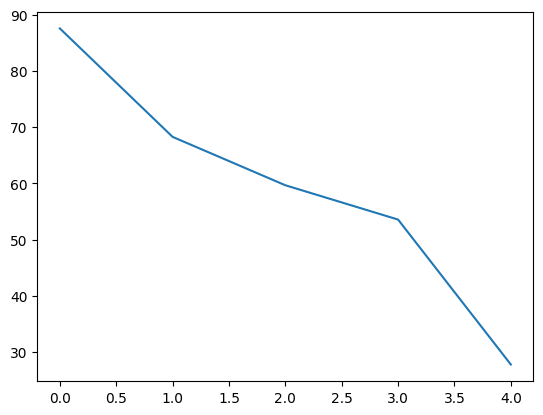

In [ ]:
# epochhee=[0,1,2,3,4,5,6,7,8,9,]
lst1 = range(len(main_loss))
lst2 = []
for i in range(len(main_loss)):
    # print(i,sum(main_loss[i]))
    lst2.append(sum(main_loss[i]))
plt.plot(lst1, lst2)


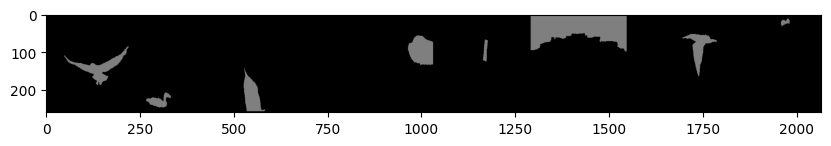

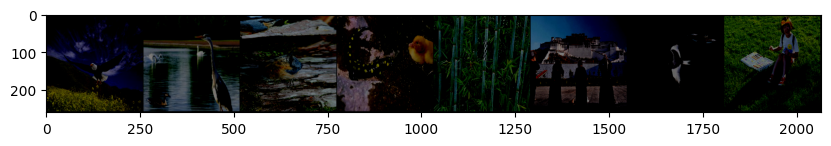

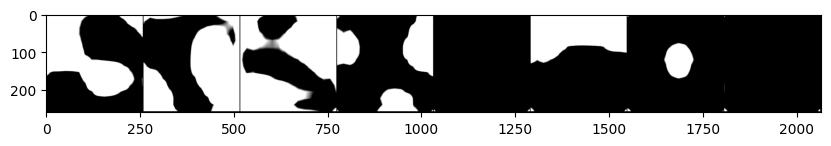

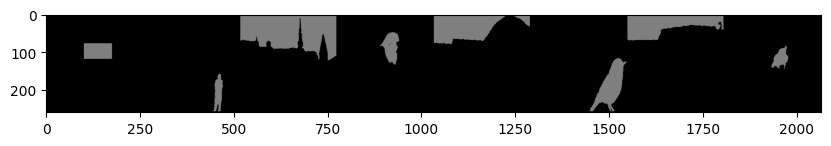

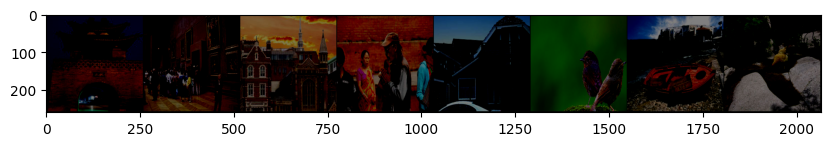

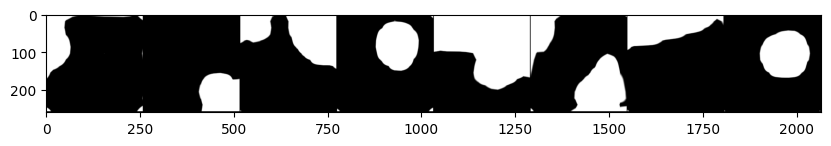

In [ ]:
count=0
for batch_idx, (images, labels, mask) in enumerate(dataloader_tampered):
    if count == 2 :
      break
    count+=1
    with torch.no_grad():
            edge, outputs = model(images.to(device))
            imshow(torchvision.utils.make_grid(mask))
            imshow(torchvision.utils.make_grid(images))
            imshow(torchvision.utils.make_grid(outputs.cpu().detach()))

In [ ]:
def calculate_img_score(pd, gt):
    seg_inv, gt_inv = np.logical_not(pd), np.logical_not(gt)
    true_pos = float(np.logical_and(pd, gt).sum())
    false_pos = np.logical_and(pd, gt_inv).sum()
    false_neg = np.logical_and(seg_inv, gt).sum()
    true_neg = float(np.logical_and(seg_inv, gt_inv).sum())
    acc = (true_pos + true_neg) / (true_pos + true_neg + false_neg + false_pos + 1e-6)
    sen = true_pos / (true_pos + false_neg + 1e-6)
    spe = true_neg / (true_neg + false_pos + 1e-6)
    f1 = 2 * sen * spe / (sen + spe)
    return acc, sen, spe, f1, true_pos, true_neg, false_pos, false_neg


def calculate_pixel_f1(pd, gt):
    if np.max(pd) == np.max(gt) and np.max(pd) == 0:
        f1, iou = 1.0, 1.0
        return f1, 0.0, 0.0
    seg_inv, gt_inv = np.logical_not(pd), np.logical_not(gt)
    true_pos = float(np.logical_and(pd, gt).sum())
    false_pos = np.logical_and(pd, gt_inv).sum()
    false_neg = np.logical_and(seg_inv, gt).sum()
    f1 = 2 * true_pos / (2 * true_pos + false_pos + false_neg + 1e-6)
    precision = true_pos / (true_pos + false_pos + 1e-6)
    recall = true_pos / (true_pos + false_neg + 1e-6)
    return f1, precision, recall

In [ ]:
img_score_train=[]
f1_score_train=[]
auc_score_train=[]
countt=0
for batch_idx, (images, labels, mask) in enumerate(dataloader_tampered):
    
    with torch.no_grad():
        edge, outputs = model(images.to(device))
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
      
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)
        val = calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy())
        img_score_train.append(val)
      
        val = calculate_pixel_f1(outputs.cpu().detach().numpy(),mask.numpy())
        f1_score_train.append(val)
        auc_score_train.append(cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
        if countt < 2:
    
          countt+=1
       
          print("F1_score: ",calculate_pixel_f1(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Image score: ",calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Auc :",cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
          print("="*60)

F1_score:  (0.27082409164847876, 0.15662032436402845, 0.9999999999878219)
Image score:  (0.1566219329830997, 0.9999999999878219, 2.2615531442322216e-06, 4.523096059242329e-06, 82114.0, 1.0, 442173, 0)
Auc : 0.926265612013793
F1_score:  (0.20892825115901761, 0.11664985017725664, 0.9999999999836489)
Image score:  (0.11665153503395718, 0.9999999999836489, 2.1592209530754665e-06, 4.318432581700818e-06, 61158.0, 1.0, 463129, 0)
Auc : 0.8428154790082516


Test Data

In [ ]:
image_path_coverage = '/content/drive/My Drive/COVERAGE/image'
# groundtruth_path_coverage = '/content/drive/My Drive/COVERAGE/Groundtruth'
mask_path_coverage = '/content/drive/My Drive/COVERAGE/mask'

class Coverage(Dataset):
    def __init__(self, authentic_path, mask_path_coverage, transform=None):
        self.authentic_path = authentic_path
        self.mask_path_coverage = mask_path_coverage
        self.transform = transform
        self.images = []
        self.labels = []
        self.masks=[]
        self.load_dataset()

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        label = self.labels[idx]
        mask = self.masks[idx]
        if self.transform:
            mask=self.transform(mask)
            image = self.transform(image)
        return image, mask, label

    def load_dataset(self):
        # # Load authentic images
        # lst = os.listdir(self.authentic_path)
        
        # lst = sorted(lst, key=lambda x: int(x[:-5]))
        # print(lst)
        # for filename in lst:
        # # for filename in os.listdir(self.authentic_path).sort():
        #     img_path = os.path.join(self.authentic_path, filename)
        #     img = cv2.imread(img_path)
        #     # print(img.shape)
        #     img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #     self.images.append(img)
        #     # self.mask.append(None)
        #     self.labels.append(1) # 0 for authentic
        
        for i in range(1, 101):
            val = str(i)+"copy.tif"
            img_path = os.path.join(self.mask_path_coverage, val)
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            self.masks.append(img)
            val = str(i)+"t.tif"
            img_path = os.path.join(self.authentic_path, val)
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            self.images.append(img)
            # self.mask.append(None)
            self.labels.append(1)

transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Resize((256, 256)),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
        transforms.Lambda(lambda x: x/2)
    ])     
data=Coverage(image_path_coverage, mask_path_coverage ,transform=transform)
authenticated_data=DataLoader(data,batch_size=4,shuffle=False)

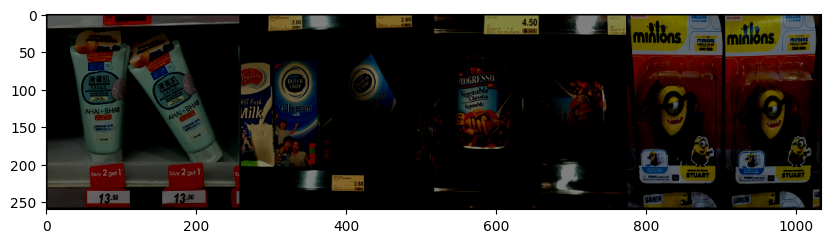

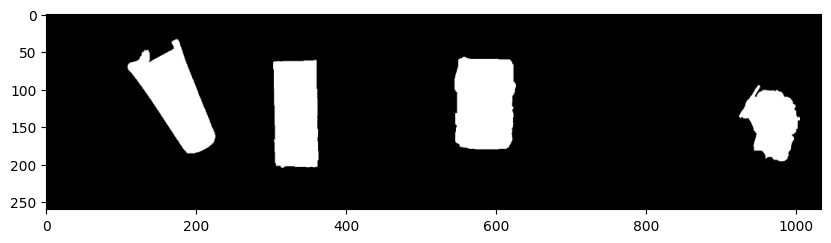

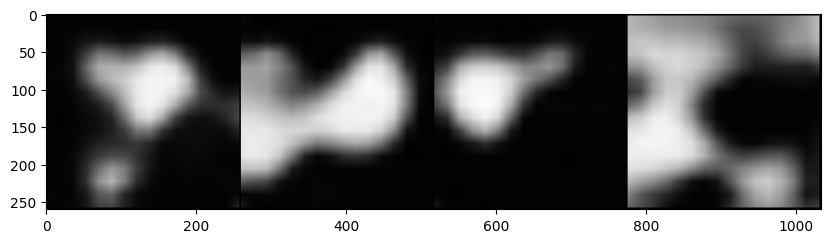

F1_score:  (0.21258621101042002, 0.11893508504854626, 0.9999999999679261)
Image score:  (0.11893844604446815, 0.9999999999679261, 4.329641592250246e-06, 8.659245693070179e-06, 31178.0, 1.0, 230965, 0)
Auc : 0.6451695451756132


In [ ]:
img_score_test = []
f1_score_test = []
auc_score_test=[]
counttt=0
for batch_idx, (images, mask, labels) in enumerate(authenticated_data):
    
    with torch.no_grad():
        # print(labels)
        # print(mask.shape)
        # print(images)
        edge, outputs = model(images.to(device))

        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
      
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)
        val = calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy())
        img_score_test.append(val)
      
        val = calculate_pixel_f1(outputs.cpu().detach().numpy(),mask.numpy())
        f1_score_test.append(val)

        auc_score_test.append(cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
        if counttt < 1:
          
          counttt+=1
          imshow(torchvision.utils.make_grid(images))
          imshow(torchvision.utils.make_grid(mask))
          imshow(torchvision.utils.make_grid(outputs.cpu().detach()))
          print("F1_score: ",calculate_pixel_f1(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Image score: ",calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Auc :",cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
          print("="*60)


SEG AND EDGE LOSS

In [ ]:
model_seg_edge = get_mvss().to(device)

optimizer = optim.Adam(model_seg_edge.parameters(), lr=1e-4, betas=(0.9, 0.999), eps=1e-8,weight_decay=1e-7)

scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.1)

In [ ]:
main_loss_edge_seg = []

epoch = 5
for i in range(epoch):
    loss_val = []

    model_seg_edge.train()
    for idx, (image, label, mask) in enumerate(dataloader_tampered):
        label = label.view(len(label), -1)
        optimizer.zero_grad()
        image, label, mask = image.to(device), label.to(device), mask.to(device)
        edge, outputs = model_seg_edge(image.to(device))
        # print(edge, outputs )
        edge, outputs = edge.to(device), outputs.to(device)
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
        # outputs = gray_transform(torch.mean(outputs, dim=1, keepdim=True))

        # Make a copy of mask and outputs before modifying them
        # mask_copy = mask.clone()
        # outputs_copy = outputs.clone()

        # Normalize mask_copy and outputs_copy using their minimum and maximum values
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)

        # Compute the segmentation loss and edge loss
        loss_seg = criterion_dice(outputs, mask)
        edge_mask=F.interpolate(gen_edge_mask(mask), scale_factor=0.25, mode='nearest').to(device)
        # print(edge.shape, edge_mask.shape)
        loss_edge = criterion_dice(edge, edge_mask)

        # # Compute the classification loss (assuming criterion is defined)
        # Gx = []
        # for out in outputs:
        #     Gx.append(torch.max(out).to(torch.float64))
        # Gx = torch.tensor(Gx).view(outputs.size(0), -1).to(device)
        # loss_clf = criterion(Gx.float(), label.float())

        # Compute the total loss as a weighted sum of the individual losses
        loss = 0.3 * loss_seg +  0.7 * loss_edge
        # loss = loss_seg
        loss.backward()
        optimizer.step()
        val = loss.detach().cpu().numpy()
        loss_val.append(val.item())
        scheduler.step(val.item())
    main_loss_edge_seg.append(loss_val)
    print("LOSS : ", sum(loss_val))
    print(i)
    torch.save({
    'epoch': epoch,
    'model_state_dict': model_seg_edge.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'loss': [loss_dice,loss_bce],
    }, '/content/drive/My Drive/smai/checkpoint_resnet50_segandedge_loss.pt')


LOSS :  76.94638723134995
0
LOSS :  65.48635596036911
1
LOSS :  57.55153477191925
2
LOSS :  52.39796593785286
3
LOSS :  42.25848809629679
4


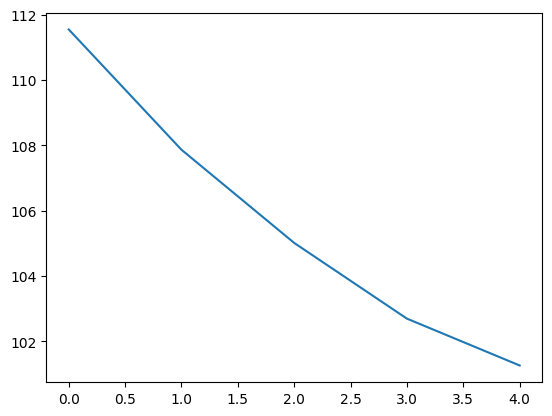

In [ ]:
lst11 = range(len(main_loss_edge_seg))
lst22 = []
for i in range(len(main_loss_edge_seg)):
    # print(i,sum(main_loss[i]))
    lst22.append(sum(main_loss_edge_seg[i]))
plt.plot(lst11, lst22)

In [ ]:
img_score_train_1=[]
f1_score_train_1=[]
auc_score_train_1=[]
countt=0
for batch_idx, (images, labels, mask) in enumerate(dataloader_tampered):
    
    with torch.no_grad():
        edge, outputs = model_seg_edge(images.to(device))
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
      
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)
        val = calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy())
        img_score_train_1.append(val)
      
        val = calculate_pixel_f1(outputs.cpu().detach().numpy(),mask.numpy())
        f1_score_train_1.append(val)
        auc_score_train_1.append(cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))

        if countt <2:
          countt+=1
          print("F1_score: ",calculate_pixel_f1(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Image score: ",calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Auc :",cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
          print("="*60)

F1_score:  (0.3693056080414397, 0.22647137922506858, 0.999999999991578)
Image score:  (0.22647285461382585, 0.999999999991578, 2.4657750424052507e-06, 4.931537924747366e-06, 118736.0, 1.0, 405551, 0)
Auc : 0.7622176087468057
F1_score:  (0.2123115899156388, 0.11876319649329706, 0.9999999999839398)
Image score:  (0.11876487731910941, 0.9999999999839398, 2.1643990978737712e-06, 4.328788826520912e-06, 62266.0, 1.0, 462021, 0)
Auc : 0.7925731946406518


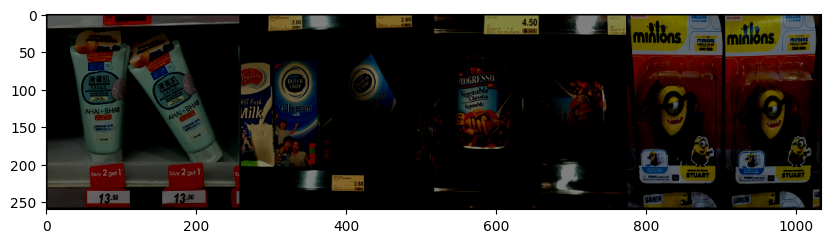

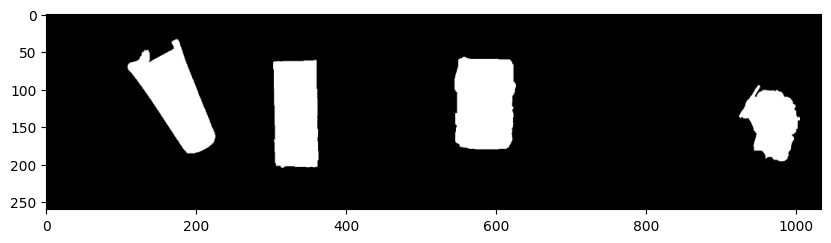

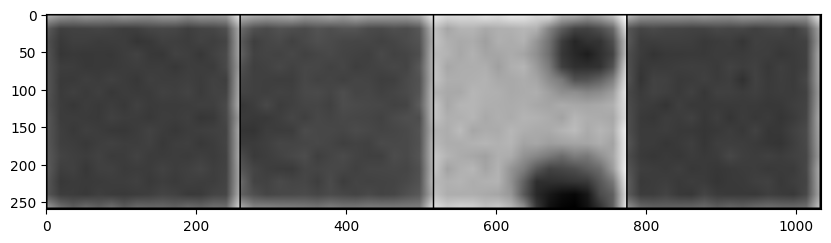

F1_score:  (0.21258621101042002, 0.11893508504854626, 0.9999999999679261)
Image score:  (0.11893844604446815, 0.9999999999679261, 4.329641592250246e-06, 8.659245693070179e-06, 31178.0, 1.0, 230965, 0)
Auc : 0.3905021229309075


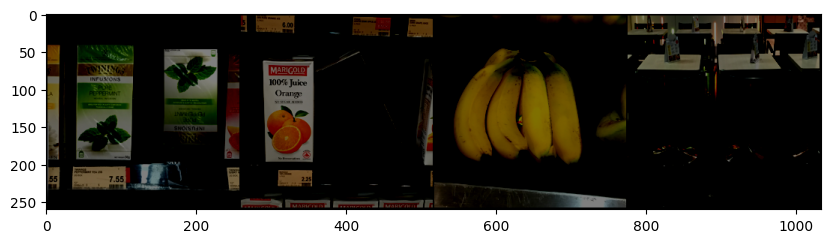

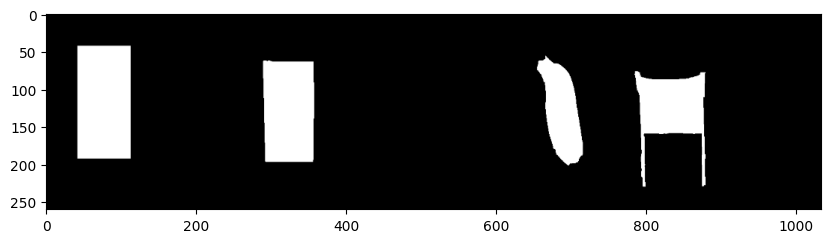

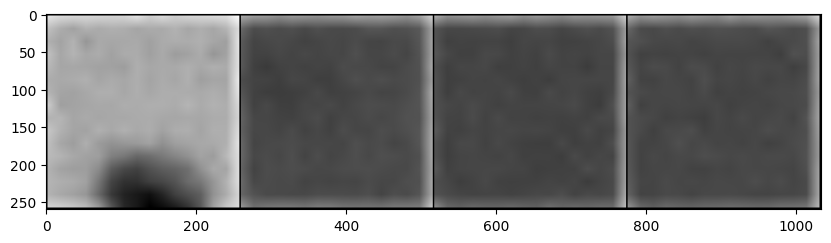

F1_score:  (0.22112516922250228, 0.12430619928770058, 0.999999999969312)
Image score:  (0.12430953979444767, 0.999999999969312, 4.3561975622528674e-06, 8.71235717175666e-06, 32586.0, 1.0, 229557, 0)
Auc : 0.29718345815769087


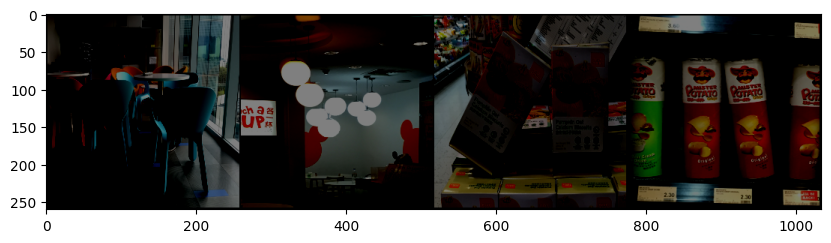

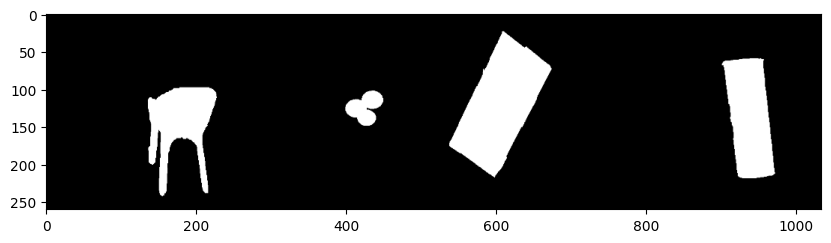

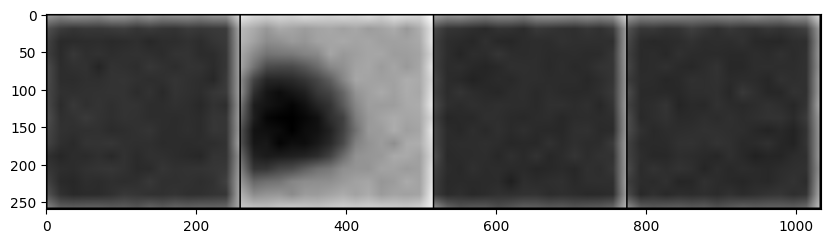

F1_score:  (0.2069255630219158, 0.11540266190546608, 0.9999999999669443)
Image score:  (0.11540603637651288, 0.9999999999669443, 4.3123523019150625e-06, 8.62466741122576e-06, 30252.0, 1.0, 231891, 0)
Auc : 0.3230322604199648


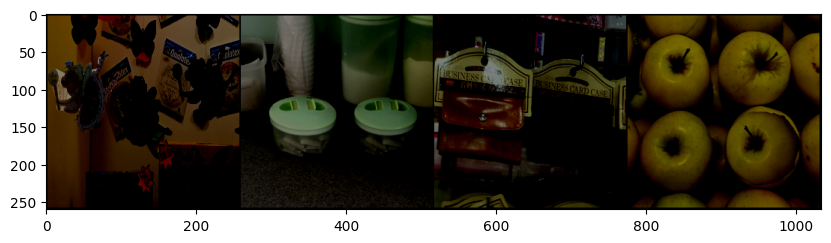

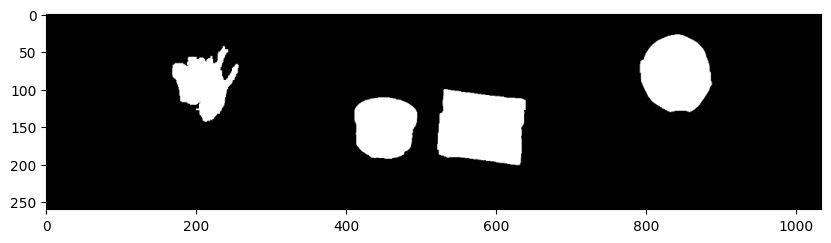

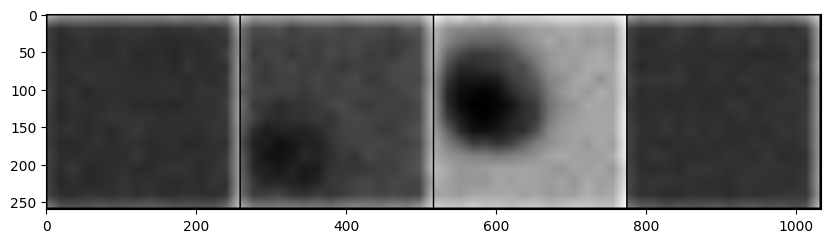

F1_score:  (0.19451972712210078, 0.10773890586394548, 0.9999645942147017)
Image score:  (0.10773849487263588, 0.9999645942147017, 0.0, 0.0, 28243.0, 0.0, 233900, 1)
Auc : 0.34268615870876784


In [ ]:
img_score_test_1 = []
f1_score_test_1 = []
auc_score_test_1=[]
counttt=0
for batch_idx, (images, mask, labels) in enumerate(authenticated_data):
   
    with torch.no_grad():
        # print(labels)
        # print(mask.shape)
        # print(images)
        edge, outputs = model_seg_edge(images.to(device))
        
    
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
      
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)
        val = calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy())
        img_score_test_1.append(val)
      
        val = calculate_pixel_f1(outputs.cpu().detach().numpy(),mask.numpy())
        f1_score_test_1.append(val)

        auc_score_test_1.append(cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
        if counttt < 4:
      
          counttt+=1
          imshow(torchvision.utils.make_grid(images))
          imshow(torchvision.utils.make_grid(mask))
          imshow(torchvision.utils.make_grid(outputs.cpu().detach()))
          print("F1_score: ",calculate_pixel_f1(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Image score: ",calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Auc :",cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
          print("="*60)


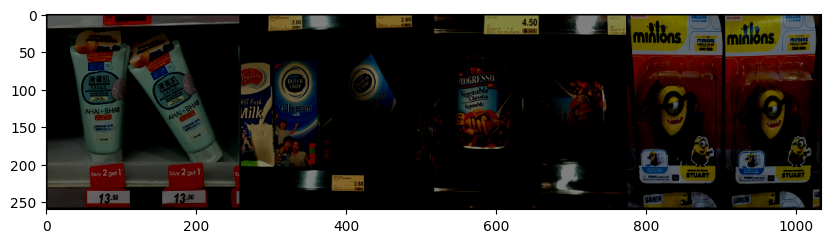

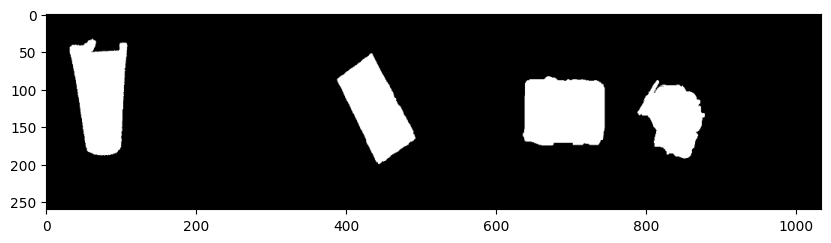

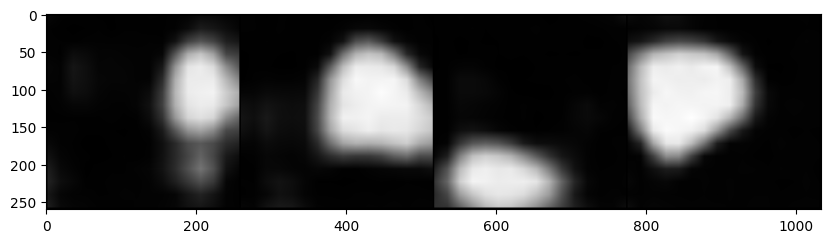

F1_score:  (0.21567039220150677, 0.12086914394005993, 0.9999999999684394)
Image score:  (0.12087249755813266, 0.9999999999684394, 4.339166619640199e-06, 8.67829558270989e-06, 31685.0, 1.0, 230458, 0)
Auc : 0.660497989426418


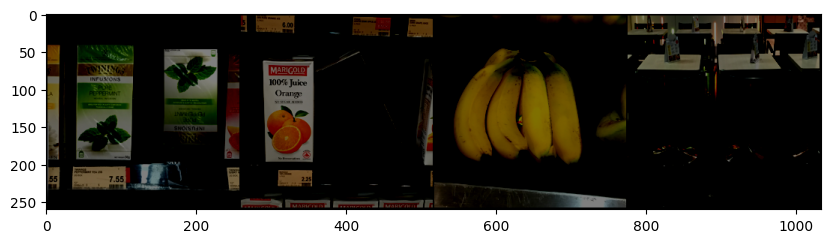

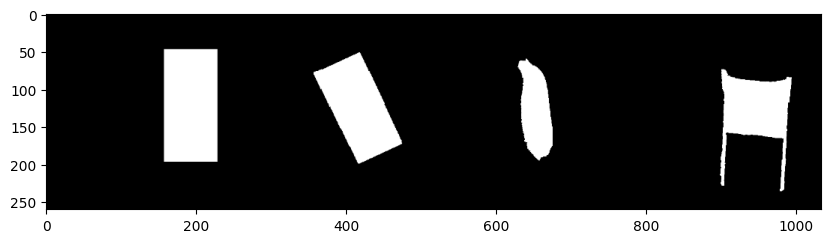

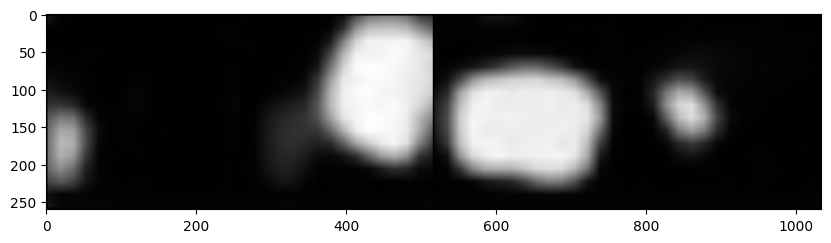

F1_score:  (0.21784177357108142, 0.12223481077075399, 0.999999999968792)
Image score:  (0.12223815917922119, 0.999999999968792, 4.345917662225084e-06, 8.691797550613673e-06, 32043.0, 1.0, 230100, 0)
Auc : 0.5848485704837543


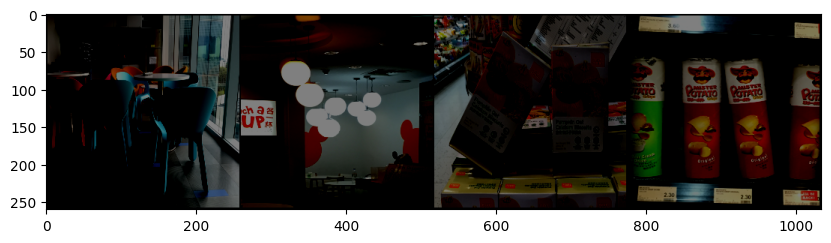

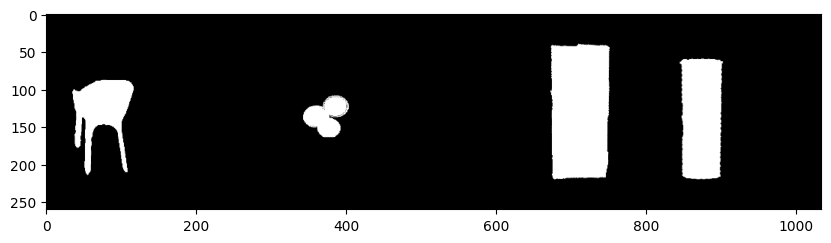

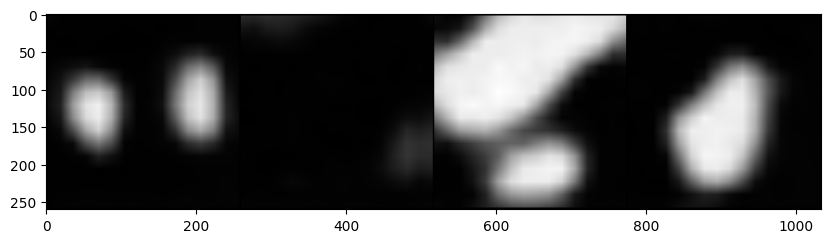

F1_score:  (0.2020000411524174, 0.11234707773958355, 0.9999999999660453)
Image score:  (0.11235046386675891, 0.9999999999660453, 4.297507875164712e-06, 8.594978813340285e-06, 29451.0, 1.0, 232692, 0)
Auc : 0.5538369368689304


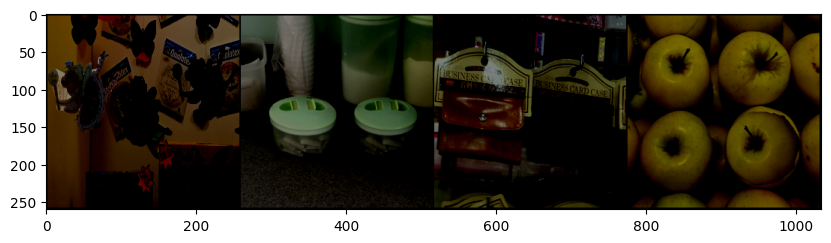

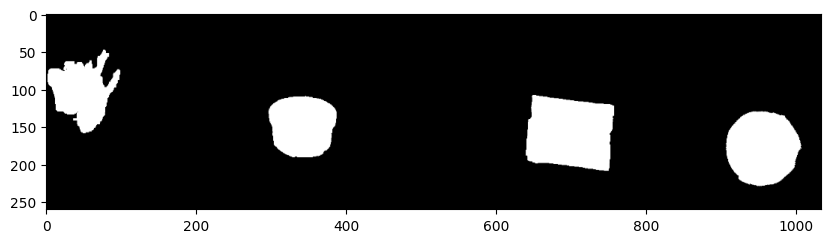

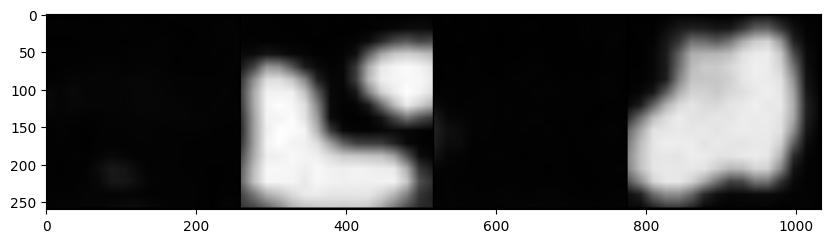

F1_score:  (0.20430936160960816, 0.1137775946711765, 0.9999999999664722)
Image score:  (0.11378097534136283, 0.9999999999664722, 4.304444769650632e-06, 8.608852482971219e-06, 29826.0, 1.0, 232317, 0)
Auc : 0.6764108751328997


In [ ]:
img_score_test_1 = []
f1_score_test_1 = []
auc_score_test_1=[]
counttt=0
for batch_idx, (images, mask, labels) in enumerate(authenticated_data):
   
    with torch.no_grad():
        # print(labels)
        # print(mask.shape)
        # print(images)
        edge, outputs = model_seg_edge(images.to(device))
        
    
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
      
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)
        val = calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy())
        img_score_test_1.append(val)
      
        val = calculate_pixel_f1(outputs.cpu().detach().numpy(),mask.numpy())
        f1_score_test_1.append(val)

        auc_score_test_1.append(cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
        if counttt < 4:
      
          counttt+=1
          imshow(torchvision.utils.make_grid(images))
          imshow(torchvision.utils.make_grid(mask))
          imshow(torchvision.utils.make_grid(outputs.cpu().detach()))
          print("F1_score: ",calculate_pixel_f1(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Image score: ",calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Auc :",cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
          print("="*60)


Edge loss

In [ ]:
model_edge = get_mvss().to(device)

optimizer = optim.Adam(model_seg_edge.parameters(), lr=1e-4, betas=(0.9, 0.999), eps=1e-8,weight_decay=1e-7)

scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.1)

In [ ]:
main_loss_edge = []

epoch = 5
for i in range(epoch):
    loss_val = []

    model_edge.train()
    for idx, (image, label, mask) in enumerate(dataloader_tampered):
        label = label.view(len(label), -1)
        optimizer.zero_grad()
        image, label, mask = image.to(device), label.to(device), mask.to(device)
        edge, outputs = model_edge(image.to(device))
        # print(edge, outputs )
        edge, outputs = edge.to(device), outputs.to(device)
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
        # outputs = gray_transform(torch.mean(outputs, dim=1, keepdim=True))

        # Make a copy of mask and outputs before modifying them
        # mask_copy = mask.clone()
        # outputs_copy = outputs.clone()

        # Normalize mask_copy and outputs_copy using their minimum and maximum values
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)

        # Compute the segmentation loss and edge loss
        loss_seg = criterion_dice(outputs, mask)
        edge_mask=F.interpolate(gen_edge_mask(mask), scale_factor=0.25, mode='nearest').to(device)
        # print(edge.shape, edge_mask.shape)
        loss_edge = criterion_dice(edge, edge_mask)

        # # Compute the classification loss (assuming criterion is defined)
        # Gx = []
        # for out in outputs:
        #     Gx.append(torch.max(out).to(torch.float64))
        # Gx = torch.tensor(Gx).view(outputs.size(0), -1).to(device)
        # loss_clf = criterion(Gx.float(), label.float())

        # Compute the total loss as a weighted sum of the individual losses
        loss =  loss_edge
        # loss = loss_seg
        loss.backward()
        optimizer.step()
        val = loss.detach().cpu().numpy()
        loss_val.append(val.item())
        # losses.update(loss.detach().cpu().numpy())
        scheduler.step(val.item())
    main_loss_edge.append(loss_val)
    print("LOSS : ", sum(loss_val))
    print(i)
    torch.save({
    'epoch': epoch,
    'model_state_dict': model_edge.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'loss': [loss_dice,loss_bce],
    }, '/content/drive/My Drive/smai/checkpoint_resnet50_edgeLoss.pt')


LOSS :  121.93548285961151
0
LOSS :  122.02013325691223
1
LOSS :  121.97174084186554
2
LOSS :  122.02122557163239
3
LOSS :  121.99306809902191
4


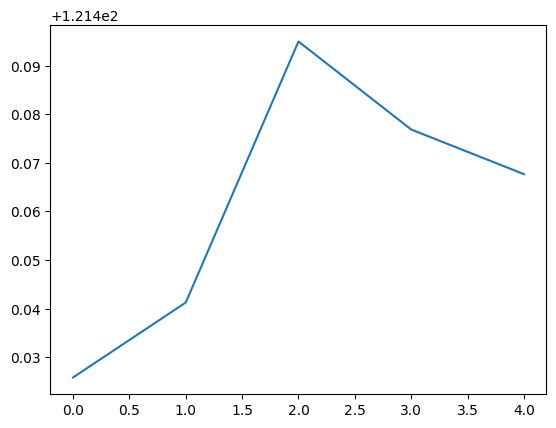

In [ ]:
lst123 = range(len(main_loss_edge))
lst222 = []
for i in range(len(main_loss_edge)):
    # print(i,sum(main_loss[i]))
    lst222.append(sum(main_loss_edge[i]))
plt.plot(lst123, lst222)

In [ ]:
img_score_train_11=[]
f1_score_train_11=[]
auc_score_train_11=[]
countt=0
for batch_idx, (images, labels, mask) in enumerate(dataloader_tampered):
    
    with torch.no_grad():
        edge, outputs = model_edge(images.to(device))
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
      
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)
        val = calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy())
        img_score_train_11.append(val)
      
        val = calculate_pixel_f1(outputs.cpu().detach().numpy(),mask.numpy())
        f1_score_train_11.append(val)

        auc_score_train_11.append(cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))

        if countt < 2:
      
          countt+=1
          print("F1_score: ",calculate_pixel_f1(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Image score: ",calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Auc :",cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
          print("="*60)

F1_score:  (0.24003303160621217, 0.13638522412316845, 0.9999860151455825)
Image score:  (0.1363849639889977, 0.9999860151455825, 0.0, 0.0, 71505.0, 0.0, 452782, 1)
Auc : 0.6109060740144098
F1_score:  (0.18778635189169346, 0.10362263416772946, 0.9999999999815933)
Image score:  (0.10362434387187267, 0.9999999999815933, 2.1278406672863056e-06, 4.255672279180069e-06, 54328.0, 1.0, 469959, 0)
Auc : 0.5682091955695788


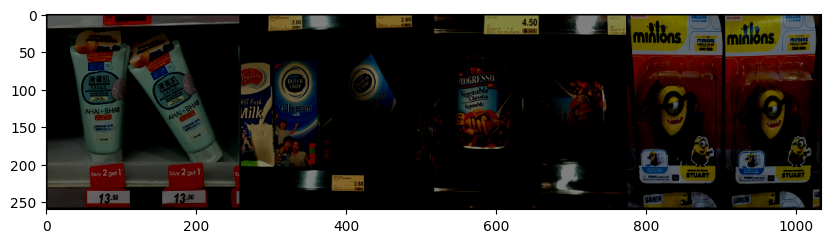

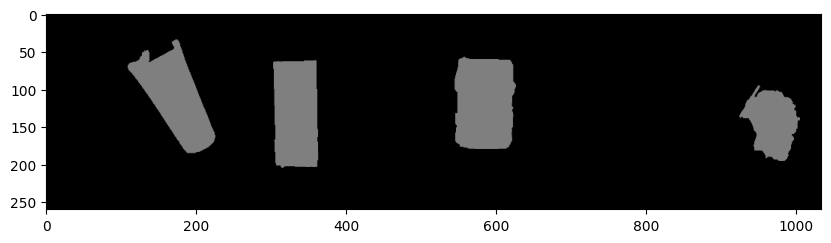

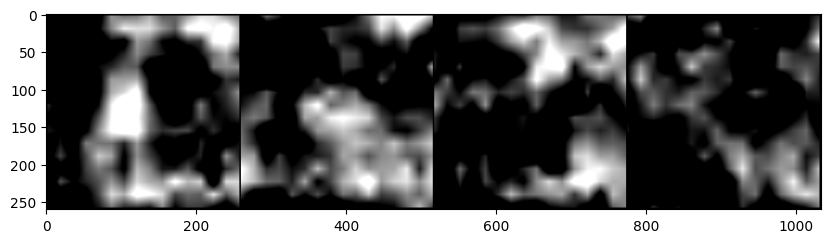

F1_score:  (0.21258621101042002, 0.11893508504854626, 0.9999999999679261)
Image score:  (0.11893844604446815, 0.9999999999679261, 4.329641592250246e-06, 8.659245693070179e-06, 31178.0, 1.0, 230965, 0)
Auc : 0.3478806104552413


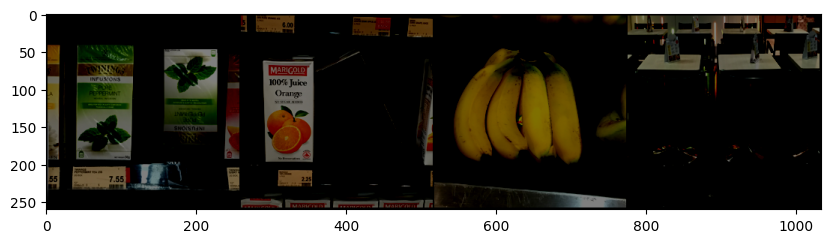

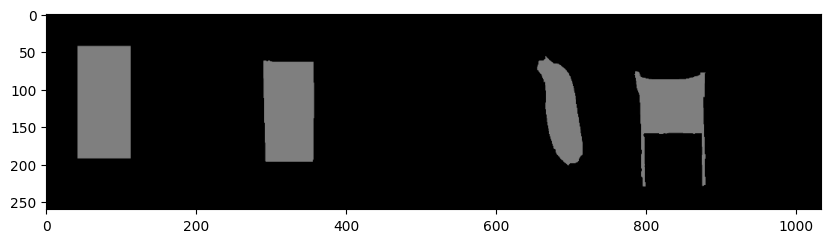

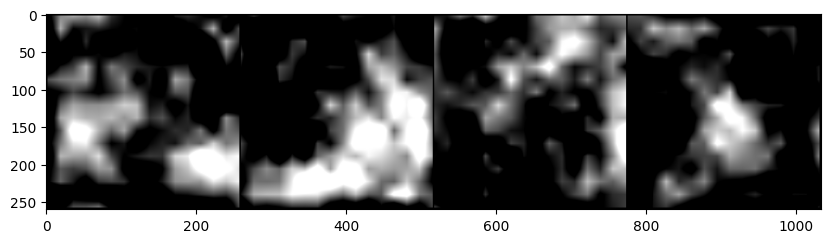

F1_score:  (0.22112516922250228, 0.12430619928770058, 0.999999999969312)
Image score:  (0.12430953979444767, 0.999999999969312, 4.3561975622528674e-06, 8.71235717175666e-06, 32586.0, 1.0, 229557, 0)
Auc : 0.42687685769796324


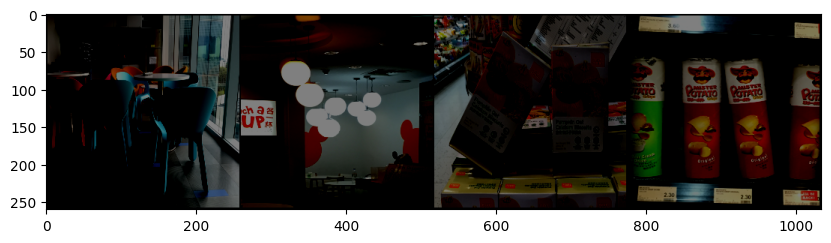

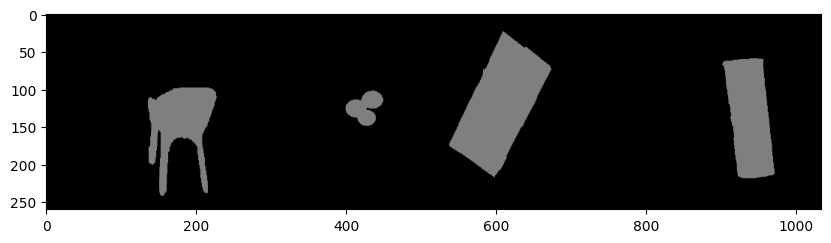

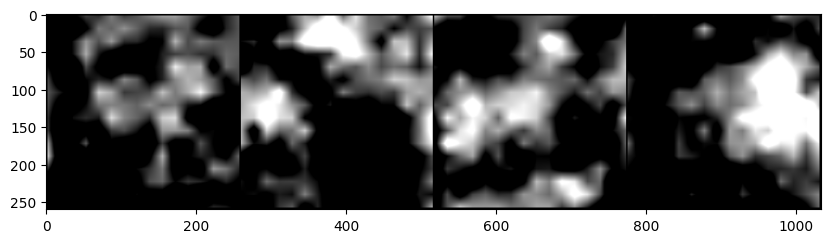

F1_score:  (0.2069255630219158, 0.11540266190546608, 0.9999999999669443)
Image score:  (0.11540603637651288, 0.9999999999669443, 4.3123523019150625e-06, 8.62466741122576e-06, 30252.0, 1.0, 231891, 0)
Auc : 0.6605989546945711


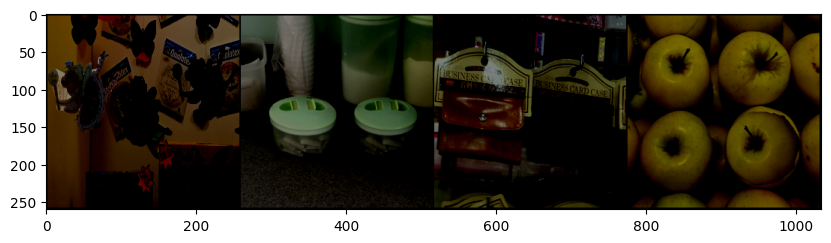

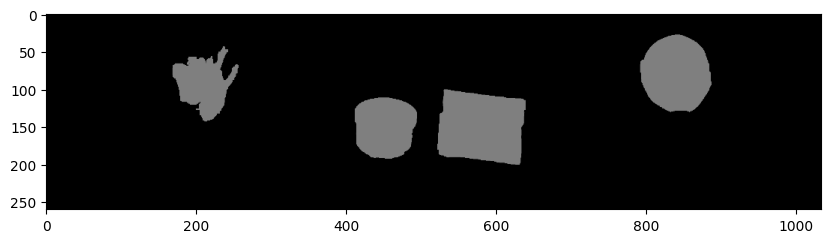

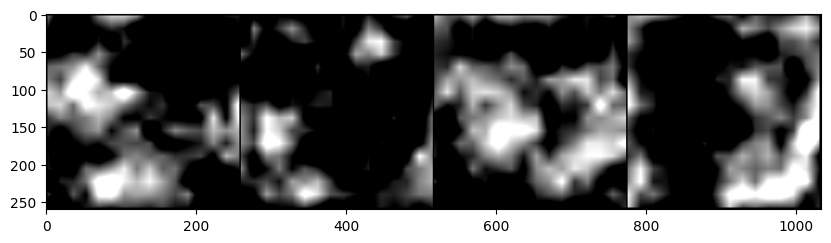

F1_score:  (0.19452661448276085, 0.10774272057576306, 0.9999999999645942)
Image score:  (0.1077461242671671, 0.9999999999645942, 4.27533133816043e-06, 8.550626119561049e-06, 28244.0, 1.0, 233899, 0)
Auc : 0.3241289847093784


In [ ]:
img_score_test_11 = []
f1_score_test_11 = []
auc_score_test_11=[]
counttt=0
countti=0
for batch_idx, (images, mask, labels) in enumerate(authenticated_data):
   
    with torch.no_grad():
        # print(labels)
        # print(mask.shape)
        # print(images)
        edge, outputs = model_edge(images.to(device))
        if countti <4:
          countti+=1
          imshow(torchvision.utils.make_grid(images))
          imshow(torchvision.utils.make_grid(mask))
          imshow(torchvision.utils.make_grid(outputs.cpu().detach()))
      
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
      
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)
        val = calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy())
        img_score_test_11.append(val)
      
        val = calculate_pixel_f1(outputs.cpu().detach().numpy(),mask.numpy())
        f1_score_test_11.append(val)

        auc_score_test_11.append(cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))

        if counttt < 4:
          counttt+=1
         
          print("F1_score: ",calculate_pixel_f1(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Image score: ",calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Auc :",cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
          print("="*60)


#### Middle chains removed in RESNET50

In [ ]:
class ResNet50(nn.Module):
    def __init__(self, pretrained=True, n_input=3):
        super(ResNet50, self).__init__()
        self.model = models.resnet50(pretrained=pretrained)
        self.conv1 = nn.Conv2d(n_input, 64, kernel_size=7, stride=2, padding=3,bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.feature_maps = [self.model.layer1, self.model.layer2, self.model.layer3, self.model.layer4]
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
      

    def base_forward(self, x):
        feature_map = []
        
        out = x
        out = self.conv1(out)
        out = self.bn1(out)
        out= self.relu(out)
        out= self.maxpool(out)
        for layer in self.feature_maps:
            out = layer(out)
            feature_map.append(out)
        out = self.avgpool(out)
        out = out.view(out.size(0), -1)

        return feature_map, out


class MVSSNet(ResNet50):
    def __init__(self,  n_input=3):
        super(MVSSNet, self).__init__(pretrained=True, n_input=n_input)
        # self.aux = aux
        self.__setattr__('exclusive', ['head'])

        self.upsample_1 = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
        self.upsample_2 = nn.Upsample(scale_factor=4, mode="bilinear", align_corners=True)
       

        self.erb_1 = ERB(256, 1)
        self.erb_2 = ERB(512, 1)
        self.erb_3 = ERB(1024, 1)
        self.erb_4 = ERB(2048, 1)
        self.erb = ERB(1, 1)
        self.sobel_height_1, self.sobel_width_1 = sobel(256, 1)
        self.sobel_height_2, self.sobel_width_2 = sobel(512, 1)
        self.sobel_height_3, self.sobel_width_3 = sobel(1024, 1)
        self.sobel_height_4, self.sobel_width_4 = sobel(2048, 1)

        self.resnet = ResNet50(n_input=3, pretrained=True)
        self.constrain_conv = BayarConv2d(in_channels=1, out_channels=3, padding=2)
        self.dual = Dual_Attention_Head(4096, 1)
       

    def forward(self, x):
        size = x.size()[2:]
        input_ = x.clone()
        feature_map, _ = self.base_forward(input_)
        c1, c2, c3, c4 = feature_map
        res1 = self.erb_1(sobel_layer(self.sobel_height_1, self.sobel_width_1, c1))
        res1 = self.erb(res1 + self.upsample_2(self.erb_4(sobel_layer(self.sobel_height_4, self.sobel_width_4, self.upsample_1(c4)))), relu=False)
        # erb_1

        x = torch.unsqueeze(0.2989 * x[:, 0, :, :] + 0.5870 * x[:, 1, :, :] + 0.1140 * x[:, 2, :, :], 1)

        x = self.constrain_conv(x)
        constrain_features, _ = self.resnet.base_forward(x)
        constrain_feature = constrain_features[-1]
        c4 = torch.cat([c4, constrain_feature], dim=1)

        c4=self.upsample_1(c4)

        x = self.dual(c4)
        x0 = F.interpolate(x[0], size, mode='bilinear', align_corners=True)

        return res1, x0
# upsample_2

def get_mvss_layer_remove():
    model = MVSSNet()
    return model

In [ ]:
model1 = get_mvss_layer_remove().to(device)

optimizer = optim.Adam(model1.parameters(), lr=1e-4, betas=(0.9, 0.999), eps=1e-8,weight_decay=1e-7)

scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.1)

model1

MVSSNet(
  (model): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0

In [ ]:

main_loss1 = []

epoch = 5
for i in range(epoch):
    loss_val1 = []

    model1.train()
    for idx, (image, label, mask) in enumerate(dataloader_tampered):
        label = label.view(len(label), -1)
        optimizer.zero_grad()
        image, label, mask = image.to(device), label.to(device), mask.to(device)
        edge, outputs = model1(image.to(device))
        # print(edge, outputs )
        edge, outputs = edge.to(device), outputs.to(device)
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
        # outputs = gray_transform(torch.mean(outputs, dim=1, keepdim=True))

        # Make a copy of mask and outputs before modifying them
        # mask_copy = mask.clone()
        # outputs_copy = outputs.clone()

        # Normalize mask_copy and outputs_copy using their minimum and maximum values
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)

        # Compute the segmentation loss and edge loss
        loss_seg = criterion_dice(outputs, mask)
        edge_mask=F.interpolate(gen_edge_mask(mask), scale_factor=0.25, mode='nearest').to(device)
        # print(edge.shape, edge_mask.shape)
        loss_edge = criterion_dice(edge, edge_mask)

        # # Compute the classification loss (assuming criterion is defined)
        Gx = []
        for out in outputs:
            Gx.append(torch.max(out).to(torch.float64))
        Gx = torch.tensor(Gx).view(outputs.size(0), -1).to(device)
        loss_clf = criterion(Gx.float(), label.float())

        # Compute the total loss as a weighted sum of the individual losses1
        loss = 0.23 * loss_seg + 0.07 * loss_clf + 0.7 * loss_edge
        # loss = loss_seg
        loss.backward()
        optimizer.step()
        val = loss.detach().cpu().numpy()
        loss_val1.append(val.item())
        scheduler.step(val.item())
    main_loss1.append(loss_val1)
    print("LOSS : ", sum(loss_val1))
    print(i)
    torch.save({
    'epoch': epoch,
    'model1_state_dict': model1.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'loss': [loss_dice,loss_bce],
    }, '/content/drive/My Drive/smai/checkpoint_resnet50_removed_all_losses.pt')


LOSS :  104.899922311306
0
LOSS :  87.20878428220749
1
LOSS :  74.83933883905411
2
LOSS :  65.88629296422005
3
LOSS :  61.516253143548965
4


In [ ]:

main_loss1 = []

epoch = 5
for i in range(epoch):
    loss_val1 = []

    model1.train()
    for idx, (image, label, mask) in enumerate(dataloader_tampered):
        label = label.view(len(label), -1)
        optimizer.zero_grad()
        image, label, mask = image.to(device), label.to(device), mask.to(device)
        edge, outputs = model1(image.to(device))
        # print(edge, outputs )
        edge, outputs = edge.to(device), outputs.to(device)
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
        # outputs = gray_transform(torch.mean(outputs, dim=1, keepdim=True))

        # Make a copy of mask and outputs before modifying them
        # mask_copy = mask.clone()
        # outputs_copy = outputs.clone()

        # Normalize mask_copy and outputs_copy using their minimum and maximum values
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)

        # Compute the segmentation loss and edge loss
        loss_seg = criterion_dice(outputs, mask)
        edge_mask=F.interpolate(gen_edge_mask(mask), scale_factor=0.25, mode='nearest').to(device)
        # print(edge.shape, edge_mask.shape)
        loss_edge = criterion_dice(edge, edge_mask)

        # # Compute the classification loss (assuming criterion is defined)
        Gx = []
        for out in outputs:
            Gx.append(torch.max(out).to(torch.float64))
        Gx = torch.tensor(Gx).view(outputs.size(0), -1).to(device)
        loss_clf = criterion(Gx.float(), label.float())

        # Compute the total loss as a weighted sum of the individual losses1
        loss = 0.23 * loss_seg + 0.07 * loss_clf + 0.7 * loss_edge
        # loss = loss_seg
        loss.backward()
        optimizer.step()
        val = loss.detach().cpu().numpy()
        loss_val1.append(val.item())
        # losses1.update(loss.detach().cpu().numpy())
        scheduler.step(val.item())
    main_loss1.append(loss_val1)
    print("LOSS : ", sum(loss_val1))
    print(i)
    # torch.save({
    # 'epoch': epoch,
    # 'model1_state_dict': model1.state_dict(),
    # 'optimizer_state_dict': optimizer.state_dict(),
    # 'loss': [loss_dice,loss_bce],
    # }, '/content/drive/My Drive/checkpoint_resnet50_7may_3am_chains_removed.pt')


----------use sobel-------------
----------use constrain-------------
LOSS :  90.70831808447838
0
LOSS :  75.3248330950737
1
LOSS :  69.93930107355118
2
LOSS :  65.66277199983597
3
LOSS :  60.65320527553558
4


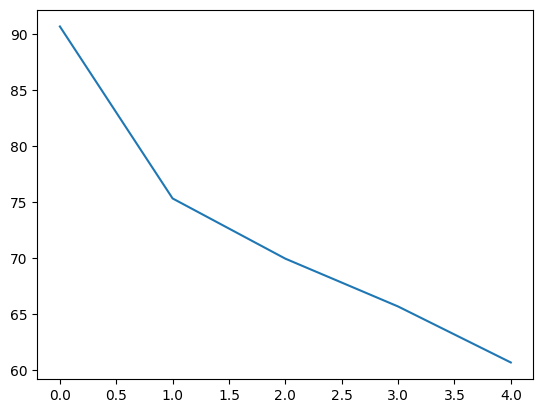

In [ ]:
# epochhee=[0,1,2,3,4,5,6,7,8,9,]
lst19 = range(len(main_loss1))
lst29 = []
for i in range(len(main_loss1)):
    # print(i,sum(main_loss1[i]))
    lst29.append(sum(main_loss1[i]))
plt.plot(lst19, lst29)

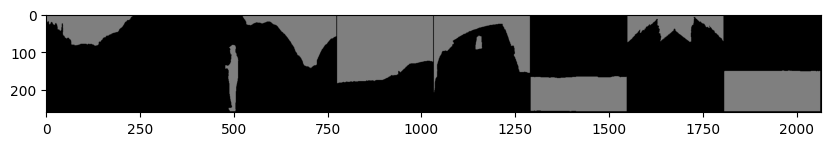

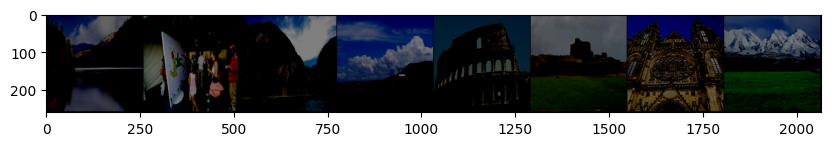

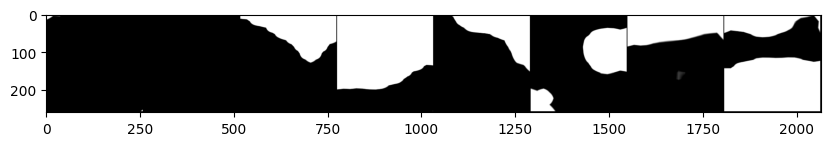

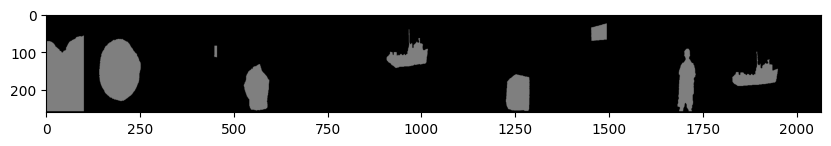

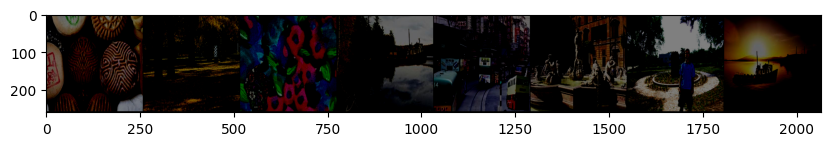

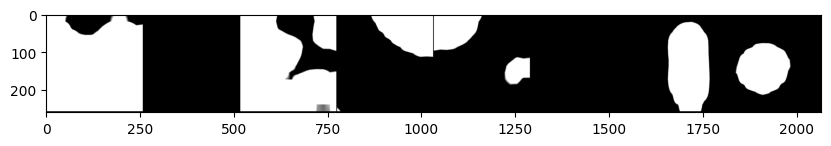

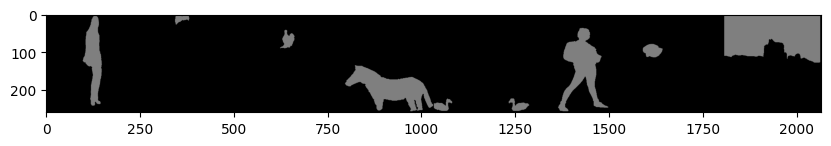

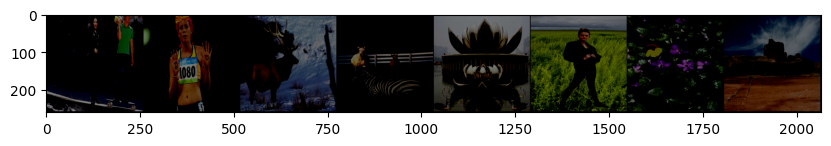

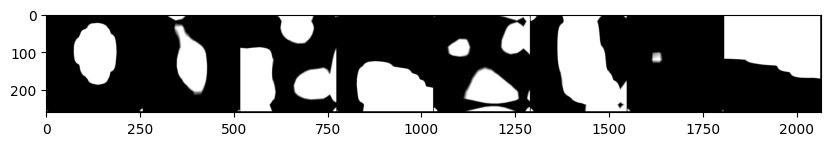

In [ ]:
countttt=0
for batch_idx, (images, labels, mask) in enumerate(dataloader_tampered):
    if countttt == 3:
      break
    countttt+=1
    with torch.no_grad():
            edge, outputs = model1(images.to(device))
            imshow(torchvision.utils.make_grid(mask))
            imshow(torchvision.utils.make_grid(images))
            imshow(torchvision.utils.make_grid(outputs.cpu().detach()))

In [ ]:
img_score_train_11_=[]
f1_score_train_11_=[]
auc_score_train_11_=[]
countt=0
for batch_idx, (images, labels, mask) in enumerate(dataloader_tampered):
    
    with torch.no_grad():
        edge, outputs = model1(images.to(device))
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
      
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)
        val = calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy())
        img_score_train_11.append(val)
      
        val = calculate_pixel_f1(outputs.cpu().detach().numpy(),mask.numpy())
        f1_score_train_11.append(val)

        auc_score_train_11.append(cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))

        if countt < 2:
        
          countt+=1
          print("F1_score: ",calculate_pixel_f1(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Image score: ",calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Auc :",cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
          print("="*60)

F1_score:  (0.1812637782912555, 0.09966487820583066, 0.999980862689938)
Image score:  (0.09966468811016146, 0.999980862689938, 0.0, 0.0, 52253.0, 0.0, 472034, 1)
Auc : 0.6878902733695491
F1_score:  (0.26991397203634176, 0.15601187898964497, 0.9999999999877744)
Image score:  (0.15601348876923368, 0.9999999999877744, 2.259922755835098e-06, 4.519835297191555e-06, 81795.0, 1.0, 442492, 0)
Auc : 0.7035975845347705


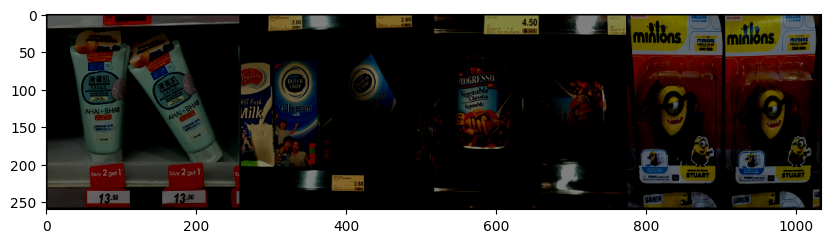

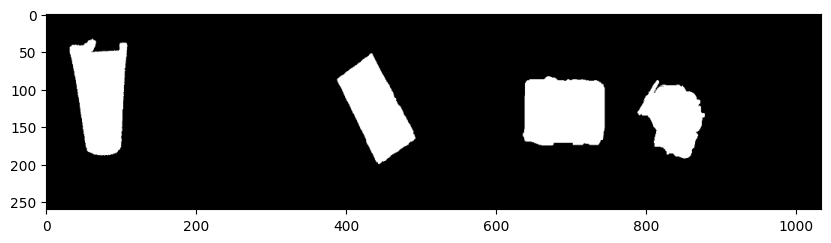

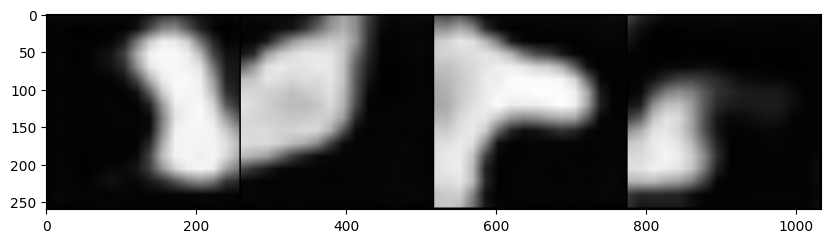

F1_score:  (0.21567039220150677, 0.12086914394005993, 0.9999999999684394)
Image score:  (0.12087249755813266, 0.9999999999684394, 4.339166619640199e-06, 8.67829558270989e-06, 31685.0, 1.0, 230458, 0)
Auc : 0.538030752563194


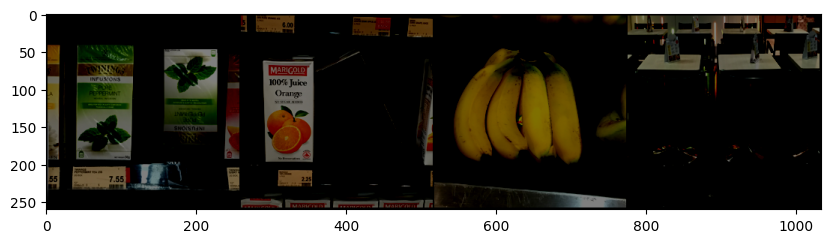

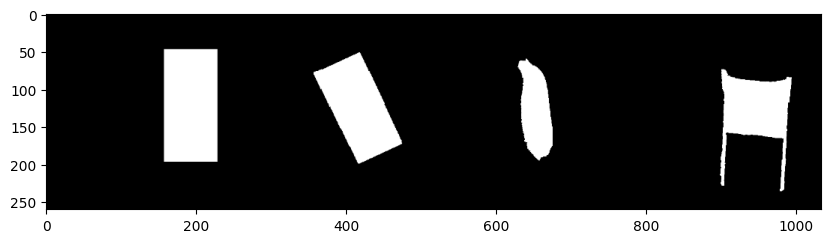

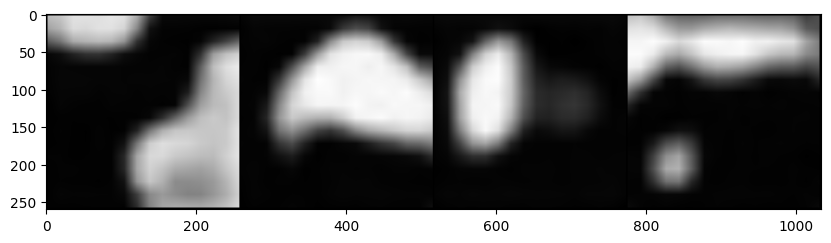

F1_score:  (0.21784177357108142, 0.12223481077075399, 0.999999999968792)
Image score:  (0.12223815917922119, 0.999999999968792, 4.345917662225084e-06, 8.691797550613673e-06, 32043.0, 1.0, 230100, 0)
Auc : 0.6191078626821752


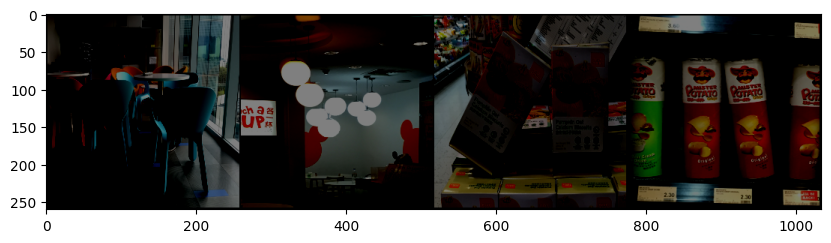

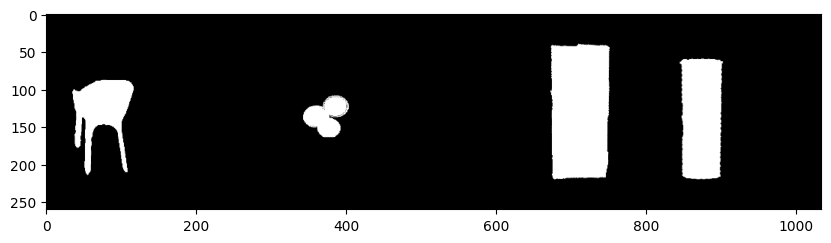

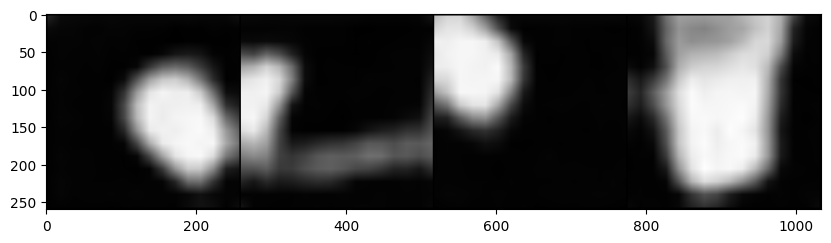

F1_score:  (0.2020000411524174, 0.11234707773958355, 0.9999999999660453)
Image score:  (0.11235046386675891, 0.9999999999660453, 4.297507875164712e-06, 8.594978813340285e-06, 29451.0, 1.0, 232692, 0)
Auc : 0.3900928748518317


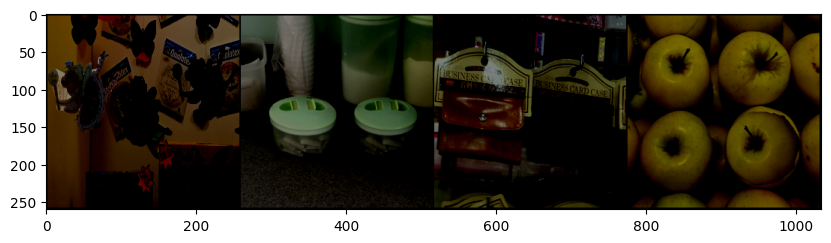

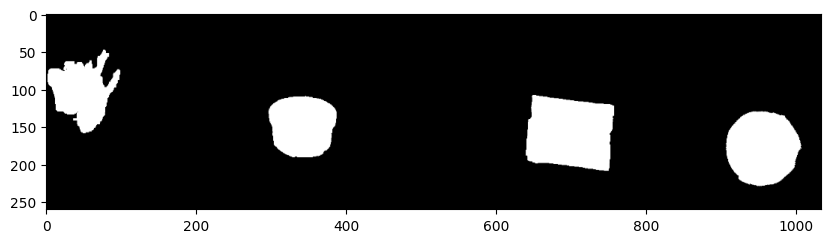

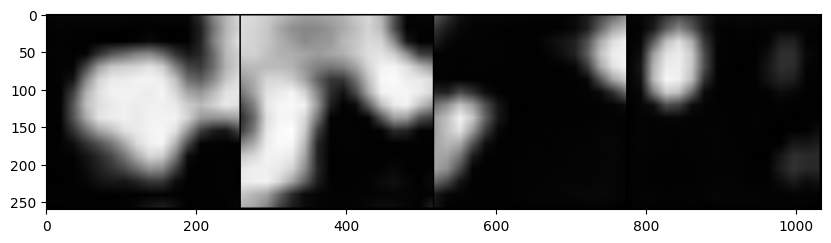

F1_score:  (0.2043025115673092, 0.11377377995935892, 0.9999664721719317)
Image score:  (0.11377334594683161, 0.9999664721719317, 0.0, 0.0, 29825.0, 0.0, 232318, 1)
Auc : 0.47714742499413476


In [ ]:
img_score_testing = []
f1_score_testing = []
auc_score_testing=[]
counttting=0
for batch_idx, (images, mask, labels) in enumerate(authenticated_data):
  
    with torch.no_grad():
        # print(labels)
        # print(mask.shape)
        # print(images)
        edge, outputs = model1(images.to(device))
        # imshow(torchvision.utils.make_grid(images))
        # imshow(torchvision.utils.make_grid(mask))
        # imshow(torchvision.utils.make_grid(outputs.cpu().detach()))
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
      
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)
        val = calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy())
        img_score_testing.append(val)
      
        val = calculate_pixel_f1(outputs.cpu().detach().numpy(),mask.numpy())
        f1_score_testing.append(val)

        auc_score_testing.append(cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
        if counttting < 4:
          
          counttting+=1
          imshow(torchvision.utils.make_grid(images))
          imshow(torchvision.utils.make_grid(mask))
          imshow(torchvision.utils.make_grid(outputs.cpu().detach()))
          print("F1_score: ",calculate_pixel_f1(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Image score: ",calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Auc :",cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
          print("="*60)



Seg only

In [ ]:
model1_11 = get_mvss_layer_remove().to(device)

optimizer = optim.Adam(model1_11.parameters(), lr=1e-4, betas=(0.9, 0.999), eps=1e-8,weight_decay=1e-7)

scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.1)
main_loss1_11 = []

epoch = 5
for i in range(epoch):
    loss_val1_11 = []

    model1_11.train()
    for idx, (image, label, mask) in enumerate(dataloader_tampered):
        label = label.view(len(label), -1)
        optimizer.zero_grad()
        image, label, mask = image.to(device), label.to(device), mask.to(device)
        edge, outputs = model1_11(image.to(device))
        # print(edge, outputs )
        edge, outputs = edge.to(device), outputs.to(device)
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
        # outputs = gray_transform(torch.mean(outputs, dim=1, keepdim=True))

        # Make a copy of mask and outputs before modifying them
        # mask_copy = mask.clone()
        # outputs_copy = outputs.clone()

        # Normalize mask_copy and outputs_copy using their minimum and maximum values
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)

        # Compute the segmentation loss and edge loss
        loss_seg = criterion_dice(outputs, mask)
        edge_mask=F.interpolate(gen_edge_mask(mask), scale_factor=0.25, mode='nearest').to(device)
        # print(edge.shape, edge_mask.shape)
        loss_edge = criterion_dice(edge, edge_mask)

        # # Compute the classification loss (assuming criterion is defined)
        Gx = []
        for out in outputs:
            Gx.append(torch.max(out).to(torch.float64))
        Gx = torch.tensor(Gx).view(outputs.size(0), -1).to(device)
        loss_clf = criterion(Gx.float(), label.float())

        # Compute the total loss as a weighted sum of the individual losses1
        loss = loss_seg 
        # loss = loss_seg
        loss.backward()
        optimizer.step()
        val = loss.detach().cpu().numpy()
        loss_val1_11.append(val.item())
        # losses1.update(loss.detach().cpu().numpy())
        scheduler.step(val.item())
    main_loss1_11.append(loss_val1)
    print("LOSS : ", sum(loss_val1))
    print(i)
    torch.save({
    'epoch': epoch,
    'model1_state_dict': model1.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'loss': [loss_dice,loss_bce],
    }, '/content/drive/My Drive/smai/checkpoint_resnet50_removed_seg_loss.pt')


----------use sobel-------------
----------use constrain-------------
LOSS :  60.65320527553558
0
LOSS :  60.65320527553558
1
LOSS :  60.65320527553558
2
LOSS :  60.65320527553558
3


LOSS :  60.65320527553558
4


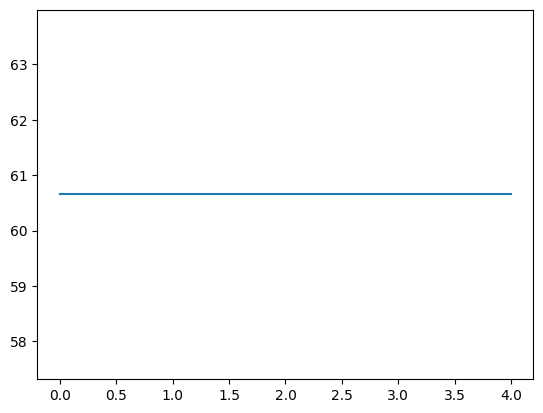

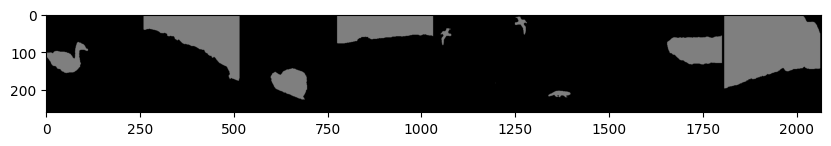

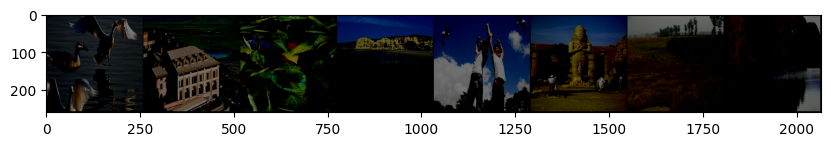

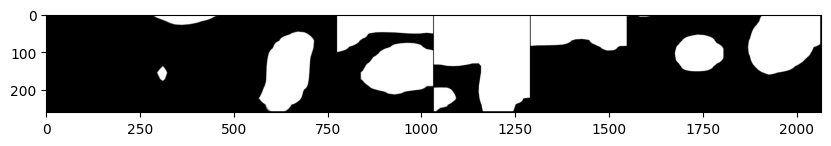

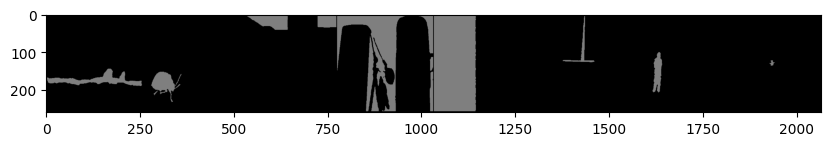

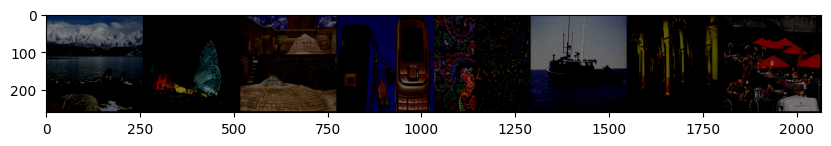

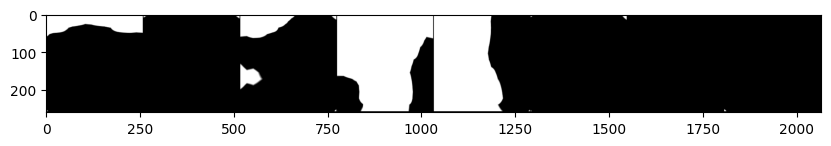

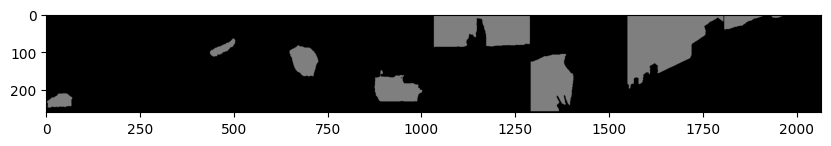

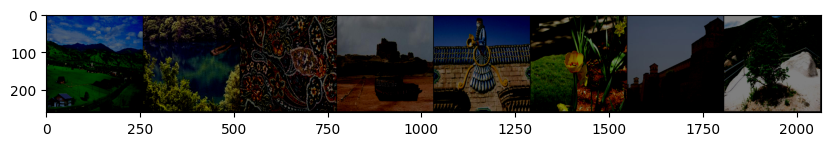

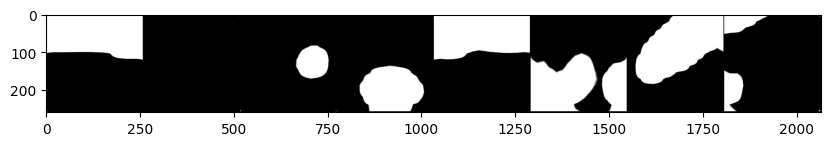

F1_score:  (0.11066045640030872, 0.05857097353156082, 0.9999999999674352)
Image score:  (0.058572769164927346, 0.9999999999674352, 2.0260140200129136e-06, 4.052019830576841e-06, 30708.0, 1.0, 493579, 0)
Auc : 0.5971045579254678
F1_score:  (0.31585760725661427, 0.187548041434963, 0.9999999999898301)
Image score:  (0.1875495910640954, 0.9999999999898301, 2.347643787307352e-06, 4.695276551777877e-06, 98329.0, 1.0, 425958, 0)
Auc : 0.9442924914870163


In [ ]:
lst156 = range(len(main_loss1_11))
lst256 = []
for i in range(len(main_loss1_11)):
    # print(i,sum(main_loss1[i]))
    lst256.append(sum(main_loss1_11[i]))
plt.plot(lst156, lst256)



countttt=0
for batch_idx, (images, labels, mask) in enumerate(dataloader_tampered):
    if countttt == 3:
      break
    countttt+=1
    with torch.no_grad():
            edge, outputs = model1_11(images.to(device))
            imshow(torchvision.utils.make_grid(mask))
            imshow(torchvision.utils.make_grid(images))
            imshow(torchvision.utils.make_grid(outputs.cpu().detach()))


img_score_train_11_1=[]
f1_score_train_11_1=[]
auc_score_train_11_1=[]
countt=0
for batch_idx, (images, labels, mask) in enumerate(dataloader_tampered):
   
    with torch.no_grad():
        edge, outputs = model1_11(images.to(device))
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
      
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)
        val = calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy())
        img_score_train_11_1.append(val)
      
        val = calculate_pixel_f1(outputs.cpu().detach().numpy(),mask.numpy())
        f1_score_train_11_1.append(val)
        auc_score_train_11_1.append(cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))

        if countt < 2:
      
          countt+=1
          print("F1_score: ",calculate_pixel_f1(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Image score: ",calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Auc :",cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
          print("="*60)


img_score_testing_1 = []
f1_score_testing_1 = []
auc_score_testing_1=[]
counttting=0
for batch_idx, (images, mask, labels) in enumerate(authenticated_data):
    
    with torch.no_grad():
        # print(labels)
        # print(mask.shape)
        # print(images)
        edge, outputs = model1_11(images.to(device))
       
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
      
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)
        val = calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy())
        img_score_testing_1.append(val)
      
        val = calculate_pixel_f1(outputs.cpu().detach().numpy(),mask.numpy())
        f1_score_testing_1.append(val)

        auc_score_testing_1.append(cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
        if counttting == 4:
      
          counttting+=1
          imshow(torchvision.utils.make_grid(images))
          imshow(torchvision.utils.make_grid(mask))
          imshow(torchvision.utils.make_grid(outputs.cpu().detach()))

          print("F1_score: ",calculate_pixel_f1(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Image score: ",calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Auc :",cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
          print("="*60)





With seg and edge loss

In [ ]:
model1_11t = get_mvss_layer_remove().to(device)

optimizer = optim.Adam(model1_11t.parameters(), lr=1e-4, betas=(0.9, 0.999), eps=1e-8,weight_decay=1e-7)

scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.1)
main_loss1_11t = []

epoch = 5
for i in range(epoch):
    loss_val1_11t = []

    model1_11t.train()
    for idx, (image, label, mask) in enumerate(dataloader_tampered):
        label = label.view(len(label), -1)
        optimizer.zero_grad()
        image, label, mask = image.to(device), label.to(device), mask.to(device)
        edge, outputs = model1_11t(image.to(device))
        # print(edge, outputs )
        edge, outputs = edge.to(device), outputs.to(device)
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
        # outputs = gray_transform(torch.mean(outputs, dim=1, keepdim=True))

        # Make a copy of mask and outputs before modifying them
        # mask_copy = mask.clone()
        # outputs_copy = outputs.clone()

        # Normalize mask_copy and outputs_copy using their minimum and maximum values
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)

        # Compute the segmentation loss and edge loss
        loss_seg = criterion_dice(outputs, mask)
        edge_mask=F.interpolate(gen_edge_mask(mask), scale_factor=0.25, mode='nearest').to(device)
        # print(edge.shape, edge_mask.shape)
        loss_edge = criterion_dice(edge, edge_mask)

        # # Compute the classification loss (assuming criterion is defined)
        Gx = []
        for out in outputs:
            Gx.append(torch.max(out).to(torch.float64))
        Gx = torch.tensor(Gx).view(outputs.size(0), -1).to(device)
        loss_clf = criterion(Gx.float(), label.float())

        # Compute the total loss as a weighted sum of the individual losses1
        loss = 0.2*loss_seg+0.8*loss_edge 
        # loss = loss_seg
        loss.backward()
        optimizer.step()
        val = loss.detach().cpu().numpy()
        loss_val1_11t.append(val.item())
        # losses1.update(loss.detach().cpu().numpy())
        scheduler.step(val.item())
    main_loss1_11t.append(loss_val1_11t)
    print("LOSS : ", sum(loss_val1_11t))
    print(i)
    torch.save({
    'epoch': epoch,
    'model1_state_dict': model1.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'loss': [loss_dice,loss_bce],
    }, '/content/drive/My Drive/smai/checkpoint_resnet50_removed_seg_and_edge_loss.pt')


LOSS :  112.30529022216797
0
LOSS :  105.82185703516006
1
LOSS :  102.57600635290146
2
LOSS :  99.77011734247208
3
LOSS :  97.66755676269531
4


In [ ]:
model1_11t = get_mvss_layer_remove().to(device)

optimizer = optim.Adam(model1_11t.parameters(), lr=1e-4, betas=(0.9, 0.999), eps=1e-8,weight_decay=1e-7)

scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.1)
main_loss1_11t = []

epoch = 5
for i in range(epoch):
    loss_val1_11t = []

    model1_11t.train()
    for idx, (image, label, mask) in enumerate(dataloader_tampered):
        label = label.view(len(label), -1)
        optimizer.zero_grad()
        image, label, mask = image.to(device), label.to(device), mask.to(device)
        edge, outputs = model1_11t(image.to(device))
        # print(edge, outputs )
        edge, outputs = edge.to(device), outputs.to(device)
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
        # outputs = gray_transform(torch.mean(outputs, dim=1, keepdim=True))

        # Make a copy of mask and outputs before modifying them
        # mask_copy = mask.clone()
        # outputs_copy = outputs.clone()

        # Normalize mask_copy and outputs_copy using their minimum and maximum values
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)

        # Compute the segmentation loss and edge loss
        loss_seg = criterion_dice(outputs, mask)
        edge_mask=F.interpolate(gen_edge_mask(mask), scale_factor=0.25, mode='nearest').to(device)
        # print(edge.shape, edge_mask.shape)
        loss_edge = criterion_dice(edge, edge_mask)

        # # Compute the classification loss (assuming criterion is defined)
        Gx = []
        for out in outputs:
            Gx.append(torch.max(out).to(torch.float64))
        Gx = torch.tensor(Gx).view(outputs.size(0), -1).to(device)
        loss_clf = criterion(Gx.float(), label.float())

        # Compute the total loss as a weighted sum of the individual losses1
        loss = 0.2*loss_seg+0.8*loss_edge 
        # loss = loss_seg
        loss.backward()
        optimizer.step()
        val = loss.detach().cpu().numpy()
        loss_val1_11t.append(val.item())
        # losses1.update(loss.detach().cpu().numpy())
        scheduler.step(val.item())
    main_loss1_11t.append(loss_val1_11t)
    print("LOSS : ", sum(loss_val1_11t))
    print(i)
    # torch.save({
    # 'epoch': epoch,
    # 'model1_state_dict': model1.state_dict(),
    # 'optimizer_state_dict': optimizer.state_dict(),
    # 'loss': [loss_dice,loss_bce],
    # }, '/content/drive/My Drive/checkpoint_resnet50_7may_3am_chains_removed.pt')






----------use sobel-------------
----------use constrain-------------
LOSS :  109.13513988256454
0
LOSS :  99.13604938983917
1
LOSS :  90.30910116434097
2
LOSS :  82.90409734845161
3
LOSS :  76.7488426566124
4


In [ ]:
model1_11 = get_mvss_layer_remove().to(device)

optimizer = optim.Adam(model1_11.parameters(), lr=1e-4, betas=(0.9, 0.999), eps=1e-8,weight_decay=1e-7)

scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.1)
main_loss1_11 = []

epoch = 5
for i in range(epoch):
    loss_val1_11 = []

    model1_11.train()
    for idx, (image, label, mask) in enumerate(dataloader_tampered):
        label = label.view(len(label), -1)
        optimizer.zero_grad()
        image, label, mask = image.to(device), label.to(device), mask.to(device)
        edge, outputs = model1_11(image.to(device))
        # print(edge, outputs )
        edge, outputs = edge.to(device), outputs.to(device)
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
        # outputs = gray_transform(torch.mean(outputs, dim=1, keepdim=True))

        # Make a copy of mask and outputs before modifying them
        # mask_copy = mask.clone()
        # outputs_copy = outputs.clone()

        # Normalize mask_copy and outputs_copy using their minimum and maximum values
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)

        # Compute the segmentation loss and edge loss
        loss_seg = criterion_dice(outputs, mask)
        # edge_mask=F.interpolate(gen_edge_mask(mask), scale_factor=0.25, mode='nearest').to(device)
        # # print(edge.shape, edge_mask.shape)
        # loss_edge = criterion_dice(edge, edge_mask)

        # # # Compute the classification loss (assuming criterion is defined)
        # Gx = []
        # for out in outputs:
        #     Gx.append(torch.max(out).to(torch.float64))
        # Gx = torch.tensor(Gx).view(outputs.size(0), -1).to(device)
        # loss_clf = criterion(Gx.float(), label.float())

        # Compute the total loss as a weighted sum of the individual losses1
        loss = loss_seg 
        # loss = loss_seg
        loss.backward()
        optimizer.step()
        val = loss.detach().cpu().numpy()
        loss_val1_11.append(val.item())
        # losses1.update(loss.detach().cpu().numpy())
        scheduler.step(val.item())
    main_loss1_11.append(loss_val1)
    print("LOSS : ", sum(loss_val1))
    print(i)
    torch.save({
    'epoch': epoch,
    'model1_state_dict': model1.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'loss': [loss_dice,loss_bce],
    }, '/content/drive/My Drive/checkpoint_resnet50_removed_seg.pt')



----------use sobel-------------
----------use constrain-------------
LOSS :  58.10510516166687
0
LOSS :  58.10510516166687
1
LOSS :  58.10510516166687
2
LOSS :  58.10510516166687
3
LOSS :  58.10510516166687
4


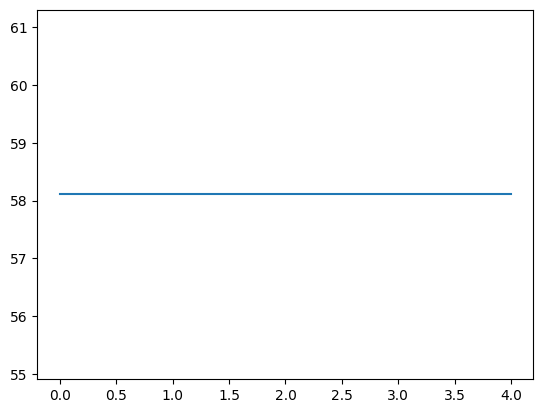

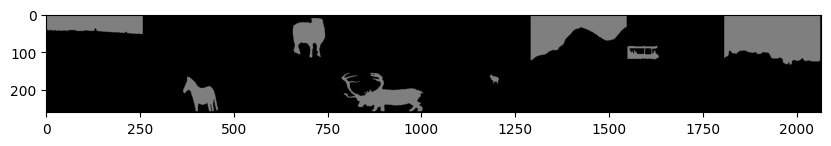

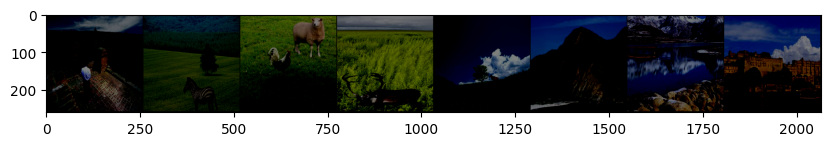

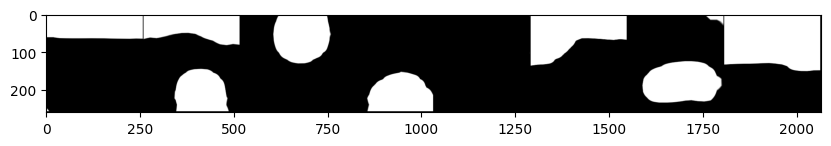

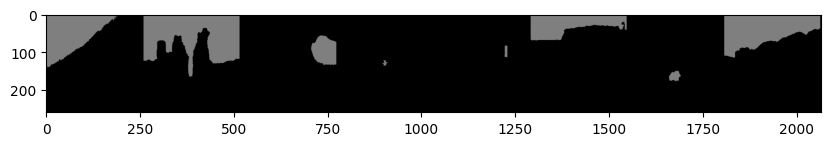

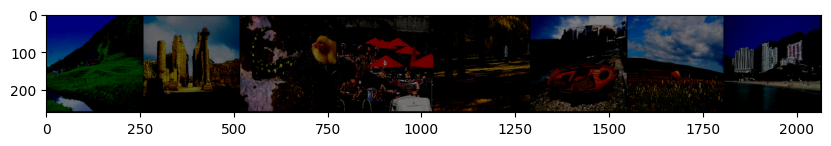

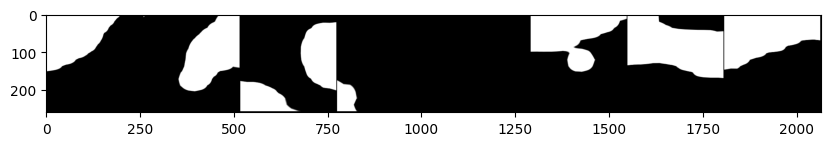

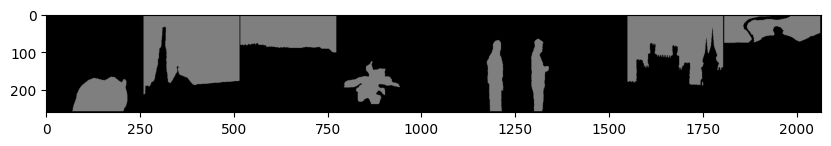

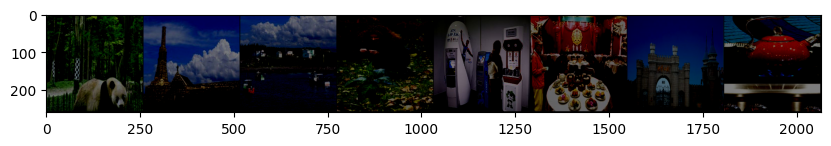

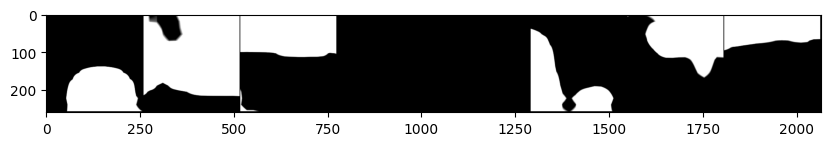

F1_score:  (0.2640078143103473, 0.15207891860726647, 0.9999999999874583)
Image score:  (0.1520805358883818, 0.9999999999874583, 2.2494404516825827e-06, 4.4988707834232385e-06, 79733.0, 1.0, 444554, 0)
Auc : 0.7922062279496295
F1_score:  (0.25745907768964277, 0.1477492289525627, 0.9999999999870907)
Image score:  (0.1477508544919057, 0.9999999999870907, 2.238012644766434e-06, 4.47601527215409e-06, 77463.0, 1.0, 446824, 0)
Auc : 0.7437897999073894


In [ ]:


    # epochhee=[0,1,2,3,4,5,6,7,8,9,]
lst156 = range(len(main_loss1_11))
lst256 = []
for i in range(len(main_loss1_11)):
    # print(i,sum(main_loss1[i]))
    lst256.append(sum(main_loss1_11[i]))
plt.plot(lst156, lst256)



countttt=0
for batch_idx, (images, labels, mask) in enumerate(dataloader_tampered):
    if countttt == 3:
      break
    countttt+=1
    with torch.no_grad():
            edge, outputs = model1_11(images.to(device))
            imshow(torchvision.utils.make_grid(mask))
            imshow(torchvision.utils.make_grid(images))
            imshow(torchvision.utils.make_grid(outputs.cpu().detach()))


img_score_train_11_1=[]
f1_score_train_11_1=[]
auc_score_train_11_1=[]
countt=0
for batch_idx, (images, labels, mask) in enumerate(dataloader_tampered):
   
    with torch.no_grad():
        edge, outputs = model1_11(images.to(device))
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
      
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)
        val = calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy())
        img_score_train_11_1.append(val)
      
        val = calculate_pixel_f1(outputs.cpu().detach().numpy(),mask.numpy())
        f1_score_train_11_1.append(val)
        auc_score_train_11_1.append(cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))

        if countt < 2:
      
          countt+=1
          print("F1_score: ",calculate_pixel_f1(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Image score: ",calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Auc :",cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
          print("="*60)


img_score_testing_1 = []
f1_score_testing_1 = []
auc_score_testing_1=[]
counttting=0
for batch_idx, (images, mask, labels) in enumerate(authenticated_data):
    
    with torch.no_grad():
        # print(labels)
        # print(mask.shape)
        # print(images)
        edge, outputs = model1_11(images.to(device))
       
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
      
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)
        val = calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy())
        img_score_testing_1.append(val)
      
        val = calculate_pixel_f1(outputs.cpu().detach().numpy(),mask.numpy())
        f1_score_testing_1.append(val)

        auc_score_testing_1.append(cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
        if counttting == 4:
      
          counttting+=1
          imshow(torchvision.utils.make_grid(images))
          imshow(torchvision.utils.make_grid(mask))
          imshow(torchvision.utils.make_grid(outputs.cpu().detach()))

          print("F1_score: ",calculate_pixel_f1(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Image score: ",calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Auc :",cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
          print("="*60)





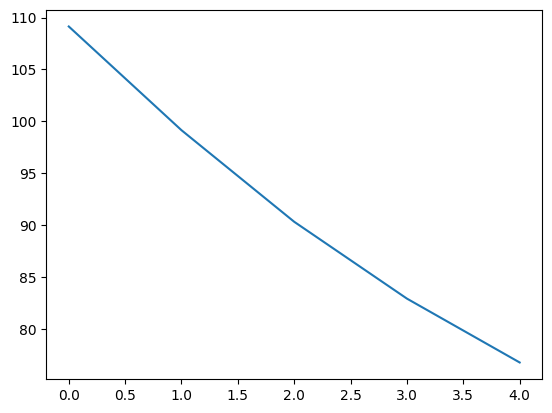

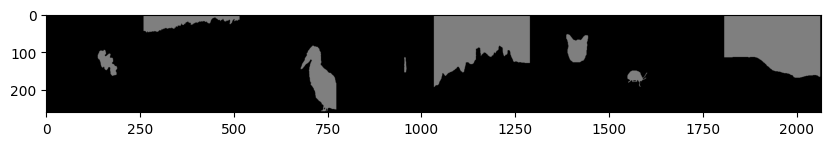

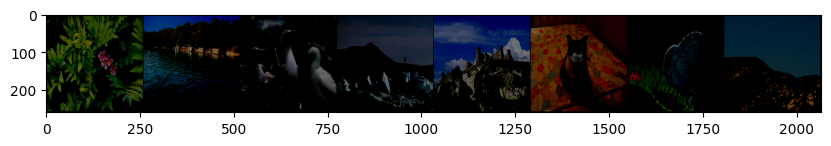

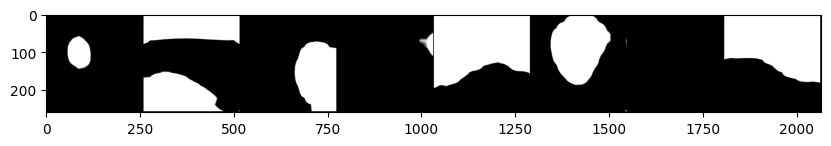

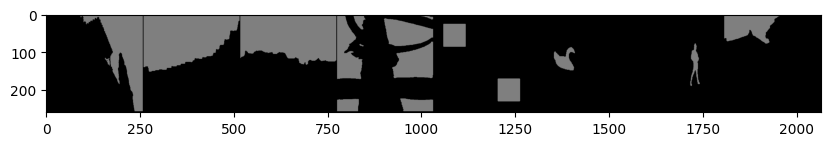

...

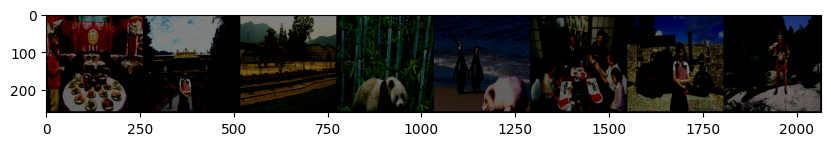

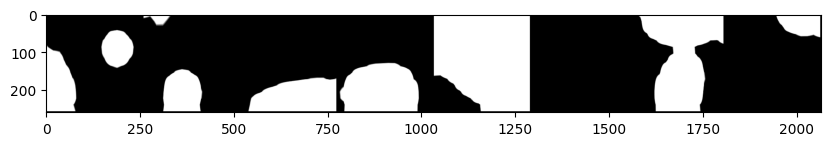

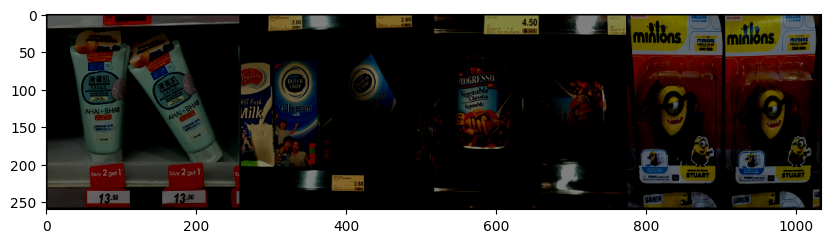

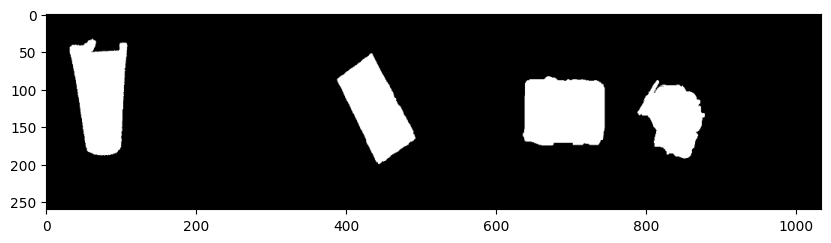

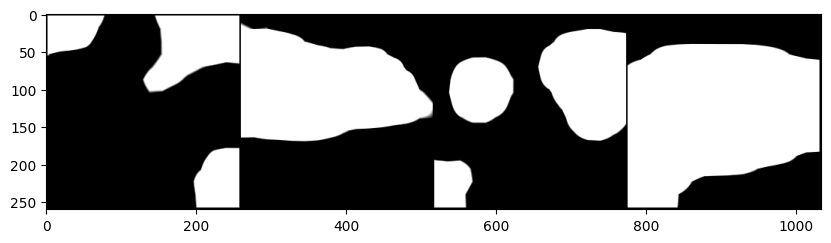

F1_score:  (0.215669658201826, 0.12086868286086705, 0.9999999999684394)
Image score:  (0.12086868286086705, 0.9999999999684394, 0.0, 0.0, 31685.0, 0.0, 230459, 0)
Auc : 0.5816069467341942


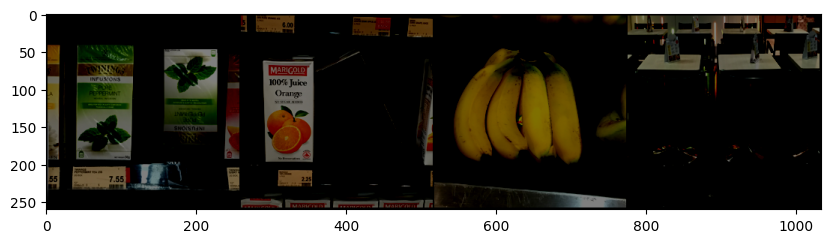

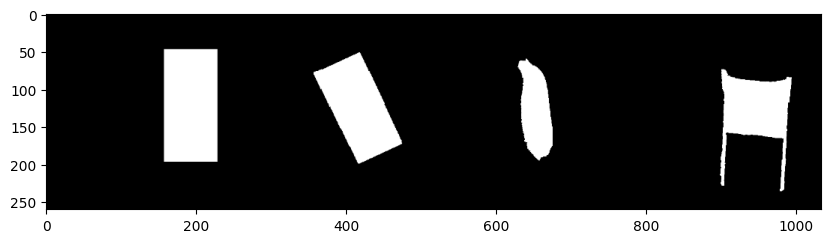

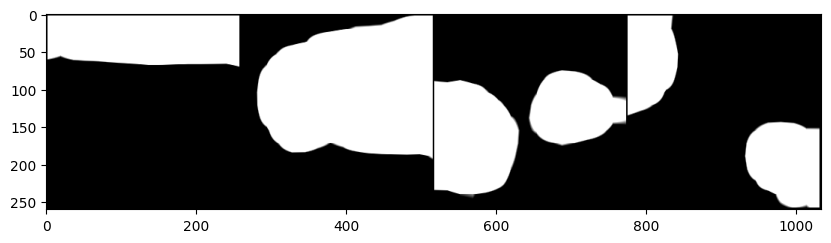

F1_score:  (0.2178410330836582, 0.12223434448195558, 0.999999999968792)
Image score:  (0.12223434448195558, 0.999999999968792, 0.0, 0.0, 32043.0, 0.0, 230101, 0)
Auc : 0.6140718411055128


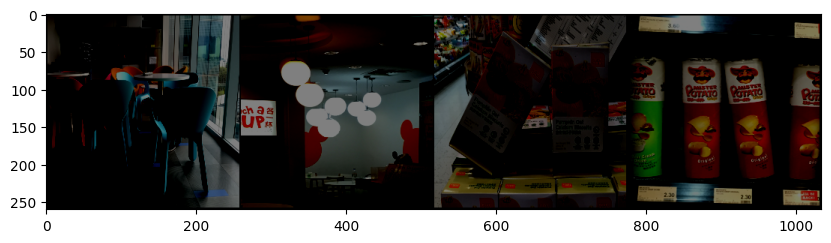

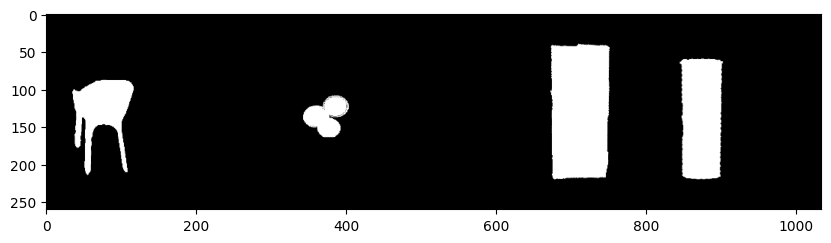

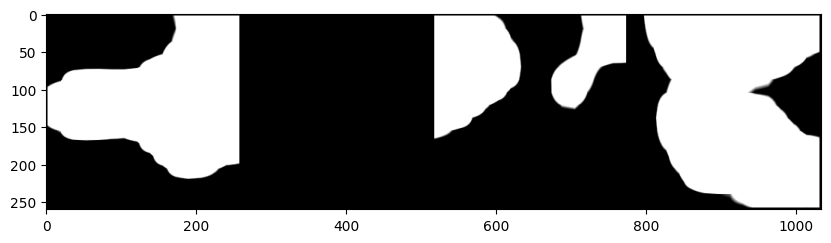

F1_score:  (0.2019993484106312, 0.1123466491694933, 0.9999999999660453)
Image score:  (0.1123466491694933, 0.9999999999660453, 0.0, 0.0, 29451.0, 0.0, 232693, 0)
Auc : 0.6138013617046452


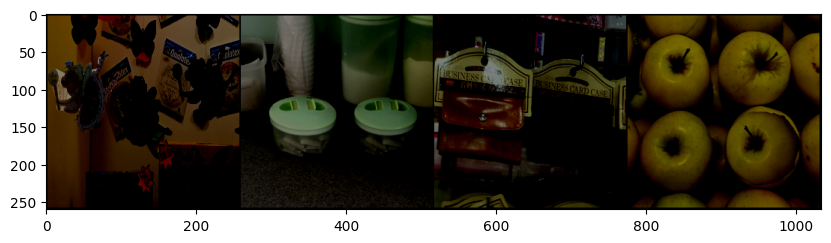

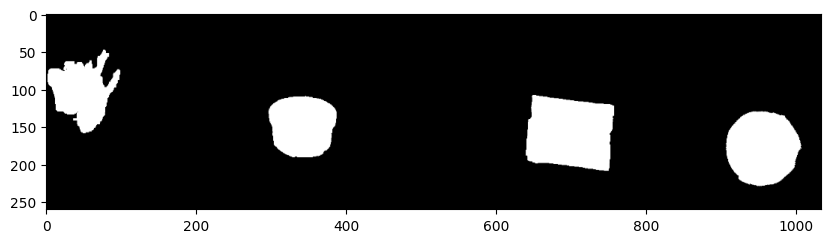

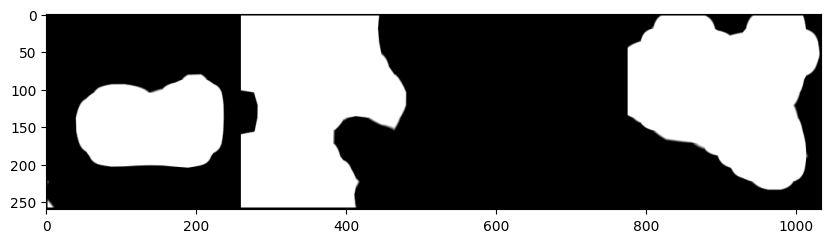

F1_score:  (0.20430866184812033, 0.11377716064409722, 0.9999999999664722)
Image score:  (0.11377716064409722, 0.9999999999664722, 0.0, 0.0, 29826.0, 0.0, 232318, 0)
Auc : 0.5606108517614621


In [ ]:
lst167 = range(len(main_loss1_11t))
lst267 = []
for i in range(len(main_loss1_11t)):
    # print(i,sum(main_loss1[i]))
    lst267.append(sum(main_loss1_11t[i]))
plt.plot(lst167, lst267)



countttt=0
for batch_idx, (images, labels, mask) in enumerate(dataloader_tampered):
    if countttt == 3:
      break
    countttt+=1
    with torch.no_grad():
            edge, outputs = model1_11t(images.to(device))
            imshow(torchvision.utils.make_grid(mask))
            imshow(torchvision.utils.make_grid(images))
            imshow(torchvision.utils.make_grid(outputs.cpu().detach()))


img_score_train_11_1t=[]
f1_score_train_11_1t=[]
auc_score_train_11_1t=[]
countt=0
for batch_idx, (images, labels, mask) in enumerate(dataloader_tampered):
    
    with torch.no_grad():
        edge, outputs = model1_11t(images.to(device))
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
      
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)
        val = calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy())
        img_score_train_11_1t.append(val)
      
        val = calculate_pixel_f1(outputs.cpu().detach().numpy(),mask.numpy())
        f1_score_train_11_1t.append(val)

        auc_score_train_11_1t.append(cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
        if countt == 2:
      
          countt+=1
          print("F1_score: ",calculate_pixel_f1(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Image score: ",calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Auc :",cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
          print("="*60)


img_score_testing_1t = []
f1_score_testing_1t = []
auc_score_testing_1t=[]
counttting=0
for batch_idx, (images, mask, labels) in enumerate(authenticated_data):
   
    with torch.no_grad():
        # print(labels)
        # print(mask.shape)
        # print(images)
        edge, outputs = model1_11t(images.to(device))
        # imshow(torchvision.utils.make_grid(images))
        # imshow(torchvision.utils.make_grid(mask))
        # imshow(torchvision.utils.make_grid(outputs.cpu().detach()))
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
      
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        # outputs = (outputs - min_val) / (max_val - min_val)
        val = calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy())
        img_score_testing_1t.append(val)
      
        val = calculate_pixel_f1(outputs.cpu().detach().numpy(),mask.numpy())
        f1_score_testing_1t.append(val)

        auc_score_testing_1t.append(cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
        if counttting < 4:
              
            counttting+=1
            imshow(torchvision.utils.make_grid(images))
            imshow(torchvision.utils.make_grid(mask))
            imshow(torchvision.utils.make_grid(outputs.cpu().detach()))
            print("F1_score: ",calculate_pixel_f1(outputs.cpu().detach().numpy(), mask.numpy()))
            print("Image score: ",calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy()))
            print("Auc :",cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
            print("="*60)




REsnet 18

In [ ]:

class ResNet18(nn.Module):
    def __init__(self, pretrained=True, n_input=3):
        super(ResNet18, self).__init__()
        self.model = models.resnet18(pretrained=pretrained)
        self.conv1 = nn.Conv2d(n_input, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.feature_map_layers = [self.model.layer1, self.model.layer2, self.model.layer3, self.model.layer4]
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))

    def base_forward(self, x):
        feature_map = []

        out = x
        out = self.conv1(out)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.maxpool(out)

        for layer in self.feature_map_layers:
            out = layer(out)
            feature_map.append(out)

        out = self.avgpool(out)
        out = out.view(out.size(0), -1)

        return feature_map, out

class MVSSNet18(ResNet18):
    def __init__(self,  n_input=3):
        super(MVSSNet18, self).__init__(pretrained=True, n_input=n_input)
        # self.num_class = nclass
        # self.aux = aux

        self.__setattr__('exclusive', ['head'])

        self.upsample = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
        self.upsample_4 = nn.Upsample(scale_factor=4, mode="bilinear", align_corners=True)
        self.sobel = sobel

        self.erb_db_1 = ERB(64, 1)
        self.erb_db_2 = ERB(128, 1)
        self.erb_db_3 = ERB(256, 1)
        self.erb_db_4 = ERB(512, 1)

        self.erb = ERB(1, 1)

        self.sobel_height_1, self.sobel_width_1 = sobel(64, 1)
        self.sobel_height_2, self.sobel_width_2 = sobel(128, 1)
        self.sobel_height_3, self.sobel_width_3 = sobel(256, 1)
        self.sobel_height_4, self.sobel_width_4 = sobel(512, 1)

        self.head = Dual_Attention_Head(512, 1)

    def forward(self, x):
        size = x.size()[2:]
        input_ = x.clone()
        feature_map, _ = self.base_forward(input_)
        c1, c2, c3, c4 = feature_map
        # print(c1.shape, c2.shape, c3.shape, c4.shape)
        res1 = self.erb_db_1(sobel_layer(self.sobel_height_1, self.sobel_width_1, c1))
        # print("RES1 SHAPE : ", res1.shape)
        res1 = self.erb(res1 + self.upsample(self.erb_db_2(sobel_layer(self.sobel_height_2, self.sobel_width_2, c2))))
        # print("RES1 SHAPE : ", res1.shape)
        res1 = self.erb(res1 + self.upsample_4(self.erb_db_3(sobel_layer(self.sobel_height_3, self.sobel_width_3, c3))))
        # print("RES1 SHAPE : ", res1.shape)
        res1 = self.erb((res1 + self.upsample_4(self.erb_db_4(sobel_layer(self.sobel_height_4, self.sobel_width_4, self.upsample(c4))))), relu=False)
        # print("RES1 SHAPE : ", res1.shape)

        outputs = []

        x = self.head(c4)
        x0 = F.interpolate(x[0], size, mode='bilinear', align_corners=True)
        outputs.append(x0)
        return res1, x0

def get_mvss_18():
    model = MVSSNet18()
    return model

In [ ]:
model_18 = get_mvss_18().to(device)

optimizer = optim.Adam(model_18.parameters(), lr=1e-4, betas=(0.9, 0.999), eps=1e-8,weight_decay=1e-7)

scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.1)

model_18

MVSSNet18(
  (model): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_run

In [ ]:
main_loss_18 = []

epoch = 5
for i in range(epoch):
    loss_val_18 = []

    model_18.train()
    for idx, (image, label, mask) in enumerate(dataloader_tampered):
        label = label.view(len(label), -1)
        optimizer.zero_grad()
        image, label, mask = image.to(device), label.to(device), mask.to(device)
        edge, outputs = model_18(image.to(device))
        # print(edge, outputs )
        edge, outputs = edge.to(device), outputs.to(device)
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
        # outputs = gray_transform(torch.mean(outputs, dim=1, keepdim=True))

        # Make a copy of mask and outputs before modifying them
        # mask_copy = mask.clone()
        # outputs_copy = outputs.clone()

        # Normalize mask_copy and outputs_copy using their minimum and maximum values
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)

        # Compute the segmentation loss and edge loss
        loss_seg = criterion_dice(outputs, mask)
        edge_mask=F.interpolate(gen_edge_mask(mask), scale_factor=0.25, mode='nearest').to(device)
        # print(edge.shape, edge_mask.shape)
        loss_edge = criterion_dice(edge, edge_mask)

        # # Compute the classification loss (assuming criterion is defined)
        # Gx = []
        # for out in outputs:
        #     Gx.append(torch.max(out).to(torch.float64))
        # Gx = torch.tensor(Gx).view(outputs.size(0), -1).to(device)
        # loss_clf = criterion(Gx.float(), label.float())

        # Compute the total loss as a weighted sum of the individual losses
        loss = 0.3 * loss_seg + 0.7 * loss_edge
        # loss = loss_seg
        loss.backward()
        optimizer.step()
        val = loss.detach().cpu().numpy()
        loss_val_18.append(val.item())
        # losses.update(loss.detach().cpu().numpy())
        scheduler.step(val.item())
    main_loss_18.append(loss_val_18)
    print("LOSS : ", sum(loss_val_18))
    print(i)
    torch.save({
    'epoch': epoch,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'loss': [loss_dice,loss_bce],
    }, '/content/drive/My Drive/smai/checkpoint_resnet18_all_losses.pt')


LOSS :  100.3103534579277
0
LOSS :  80.61568480730057
1
LOSS :  76.62499761581421
2
LOSS :  74.44519791007042
3
LOSS :  73.59634208679199
4


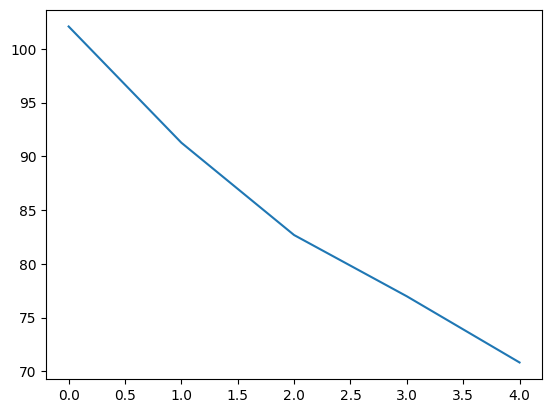

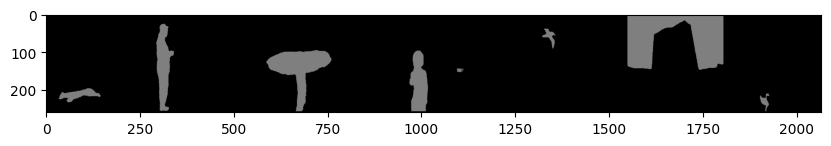

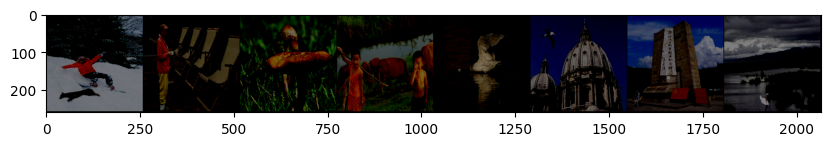

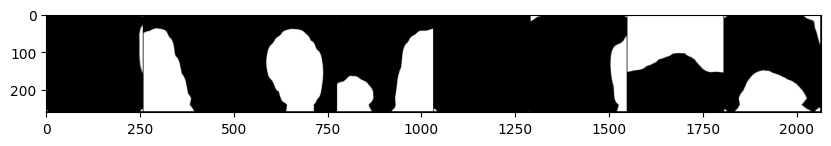

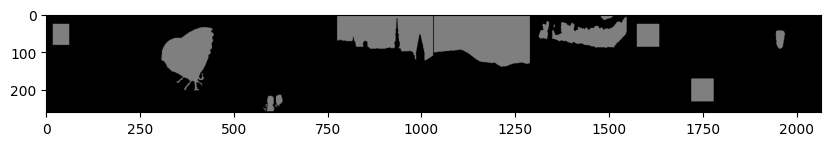

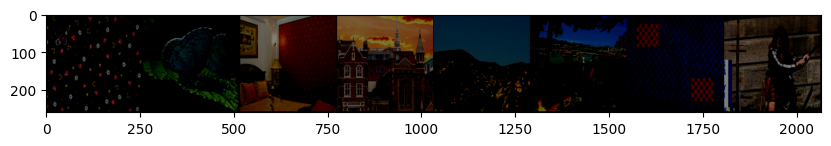

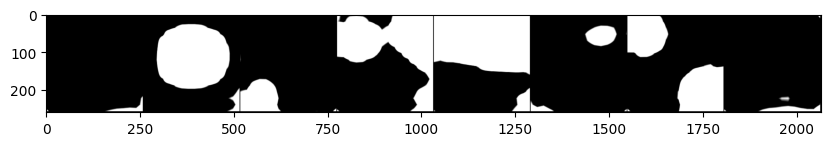

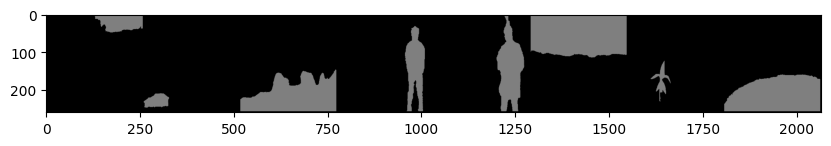

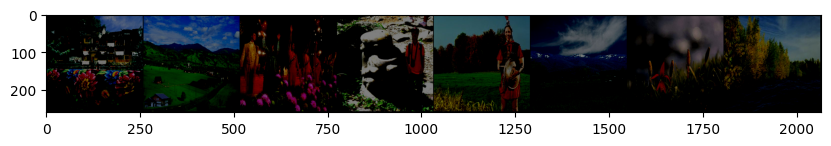

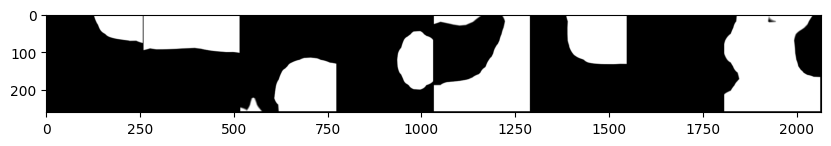

F1_score:  (0.42596398211200764, 0.2706189548848806, 0.9999999999929519)
Image score:  (0.27062034606881974, 0.9999999999929519, 2.615021730823745e-06, 5.2300297850059486e-06, 141882.0, 1.0, 382405, 0)
Auc : 0.8852941597585283
F1_score:  (0.36041955286416066, 0.21982425656134935, 0.9999999999913234)
Image score:  (0.21982574462848697, 0.9999999999913234, 2.4447666103495655e-06, 4.889521266960797e-06, 115251.0, 1.0, 409036, 0)
Auc : 0.8402649689087742


In [ ]:
lst1456 = range(len(main_loss_18))
lst2456 = []
for i in range(len(main_loss_18)):
    # print(i,sum(main_loss1[i]))
    lst2456.append(sum(main_loss_18[i]))
plt.plot(lst1456, lst2456)



countttt=0
for batch_idx, (images, labels, mask) in enumerate(dataloader_tampered):
    if countttt == 3:
      break
    countttt+=1
    with torch.no_grad():
            edge, outputs = model_18(images.to(device))
            imshow(torchvision.utils.make_grid(mask))
            imshow(torchvision.utils.make_grid(images))
            imshow(torchvision.utils.make_grid(outputs.cpu().detach()))


img_score_train_18=[]
f1_score_train_18=[]
auc_score_train_18=[]
countt=0
for batch_idx, (images, labels, mask) in enumerate(dataloader_tampered):
    
    with torch.no_grad():
        edge, outputs = model_18(images.to(device))
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
      
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)
        val = calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy())
        img_score_train_18.append(val)
      
        val = calculate_pixel_f1(outputs.cpu().detach().numpy(),mask.numpy())
        f1_score_train_18.append(val)

        auc_score_train_18.append(cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
        if countt < 2:
      
          countt+=1
          print("F1_score: ",calculate_pixel_f1(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Image score: ",calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Auc :",cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
          print("="*60)


img_score_testing_18 = []
f1_score_testing_18 = []
auc_score_testing_18=[]
counttting=0
for batch_idx, (images, mask, labels) in enumerate(authenticated_data):
   
    with torch.no_grad():
        # print(labels)
        # print(mask.shape)
        # print(images)
        edge, outputs = model_18(images.to(device))
        # imshow(torchvision.utils.make_grid(images))
        # imshow(torchvision.utils.make_grid(mask))
        # imshow(torchvision.utils.make_grid(outputs.cpu().detach()))
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
      
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        # outputs = (outputs - min_val) / (max_val - min_val)
        val = calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy())
        img_score_testing_18.append(val)
      
        val = calculate_pixel_f1(outputs.cpu().detach().numpy(),mask.numpy())
        f1_score_testing_18.append(val)

        auc_score_testing_18.append(cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
        if counttting == 4:
      
          counttting+=1
          imshow(torchvision.utils.make_grid(images))
          imshow(torchvision.utils.make_grid(mask))
          imshow(torchvision.utils.make_grid(outputs.cpu().detach()))
          print("F1_score: ",calculate_pixel_f1(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Image score: ",calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Auc :",cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
          print("="*60)




Seg + Edge

In [ ]:
model_18_seg = get_mvss_18().to(device)

optimizer = optim.Adam(model_18_seg.parameters(), lr=1e-4, betas=(0.9, 0.999), eps=1e-8,weight_decay=1e-7)

scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.1)

In [ ]:
main_loss_18_s = []

epoch = 6
for i in range(epoch):
    loss_val_18_s = []

    model_18_seg.train()
    for idx, (image, label, mask) in enumerate(dataloader_tampered):
        label = label.view(len(label), -1)
        optimizer.zero_grad()
        image, label, mask = image.to(device), label.to(device), mask.to(device)
        edge, outputs = model_18_seg(image.to(device))
        # print(edge, outputs )
        edge, outputs = edge.to(device), outputs.to(device)
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
        # outputs = gray_transform(torch.mean(outputs, dim=1, keepdim=True))

        # Make a copy of mask and outputs before modifying them
        # mask_copy = mask.clone()
        # outputs_copy = outputs.clone()

        # Normalize mask_copy and outputs_copy using their minimum and maximum values
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)

        # Compute the segmentation loss and edge loss
        loss_seg = criterion_dice(outputs, mask)
        edge_mask=F.interpolate(gen_edge_mask(mask), scale_factor=0.25, mode='nearest').to(device)
        # print(edge.shape, edge_mask.shape)
        loss_edge = criterion_dice(edge, edge_mask)

        # # Compute the classification loss (assuming criterion is defined)
        # Gx = []
        # for out in outputs:
        #     Gx.append(torch.max(out).to(torch.float64))
        # Gx = torch.tensor(Gx).view(outputs.size(0), -1).to(device)
        # loss_clf = criterion(Gx.float(), label.float())

        # Compute the total loss as a weighted sum of the individual losses
        loss = 0.3 * loss_seg + 0.7 * loss_edge
        # loss = loss_seg
        loss.backward()
        optimizer.step()
        val = loss.detach().cpu().numpy()
        loss_val_18_s.append(val.item())
        # losses.update(loss.detach().cpu().numpy())
        scheduler.step(val.item())
    main_loss_18_s.append(loss_val_18_s)
    print("LOSS : ", sum(loss_val_18_s))
    print(i)
    torch.save({
    'epoch': epoch,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'loss': [loss_dice,loss_bce],
    }, '/content/drive/My Drive/smai/checkpoint_resnet18_seg_and_edge_loss.pt')


LOSS :  113.97809207439423
0
LOSS :  114.01205438375473
1
LOSS :  113.97664850950241
2
LOSS :  113.94397705793381
3
LOSS :  113.92556113004684
4
LOSS :  113.98766565322876
5


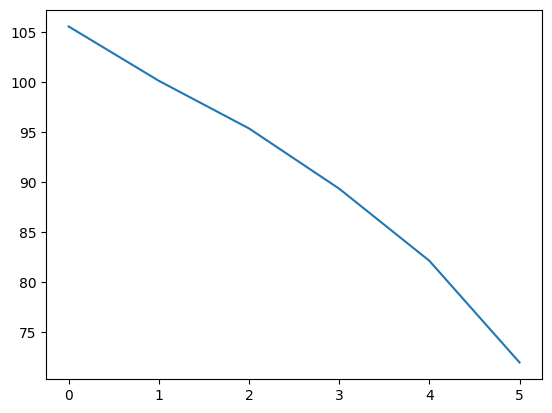

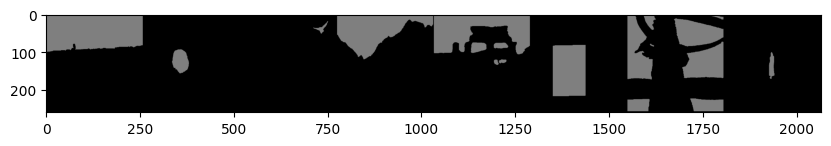

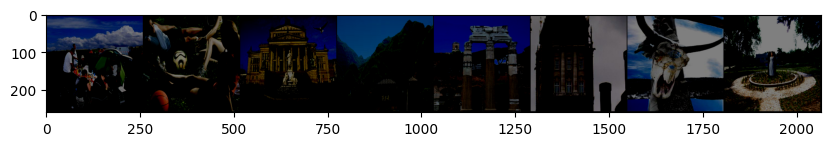

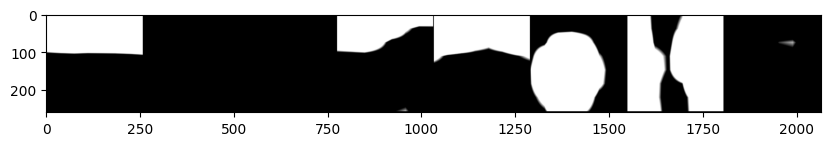

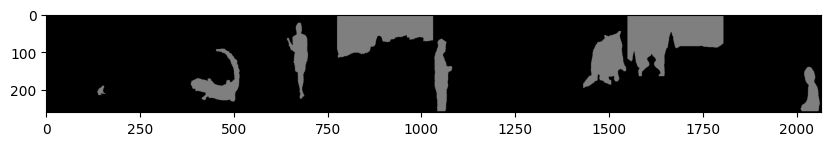

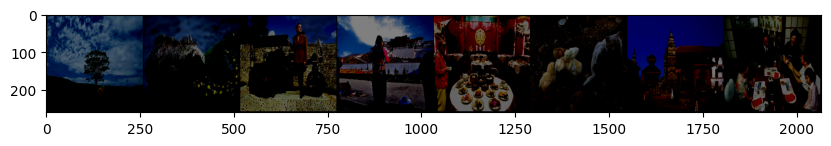

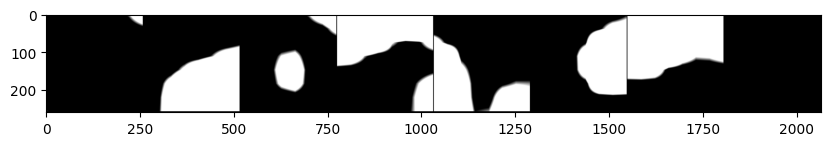

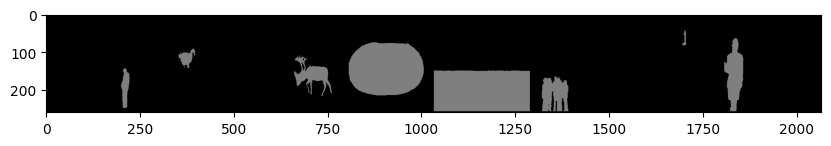

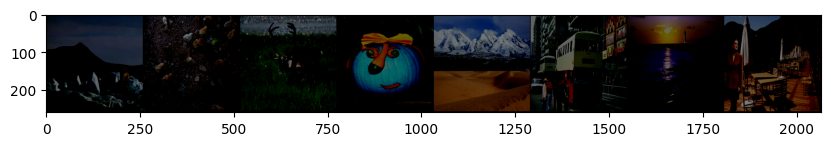

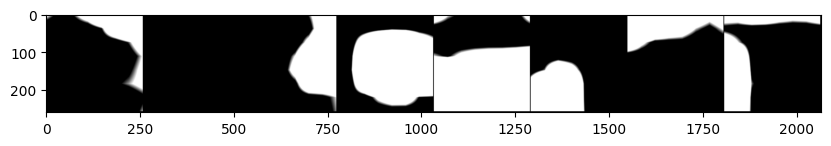

F1_score:  (0.22999495284500848, 0.12994028080015346, 0.9999999999853214)
Image score:  (0.12994194030736933, 0.9999999999853214, 2.1922036469451815e-06, 4.384397682397774e-06, 68126.0, 1.0, 456161, 0)
Auc : 0.9223640206663959
F1_score:  (0.3636332425079454, 0.2222198910134674, 0.9999999999914169)
Image score:  (0.2222213745112949, 0.9999999999914169, 2.452296698466941e-06, 4.904581369445183e-06, 116507.0, 1.0, 407780, 0)
Auc : 0.8668610239428515


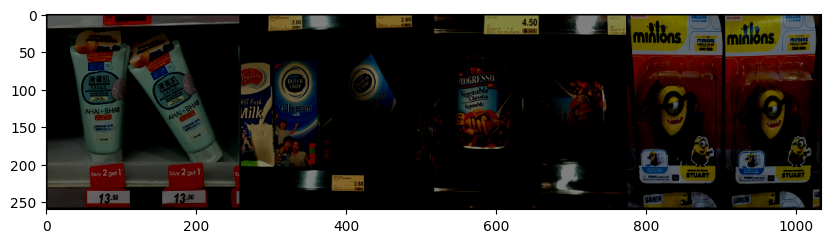

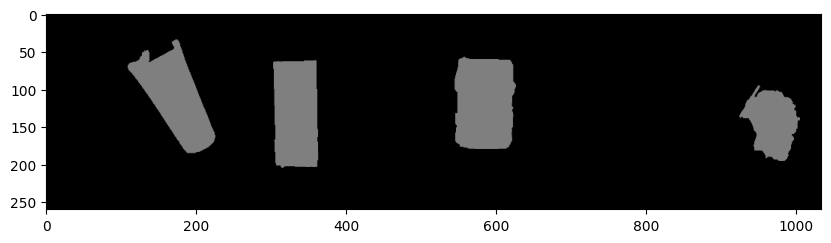

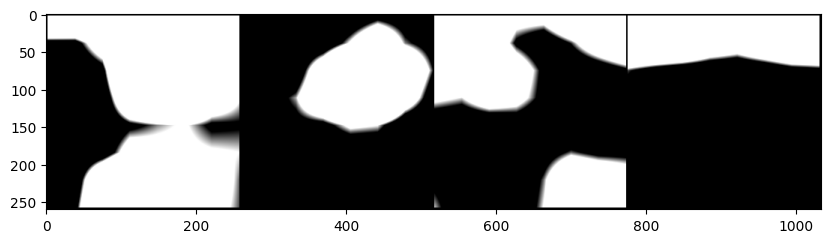

F1_score:  (0.21258548625669882, 0.11893463134720254, 0.9999999999679261)
Image score:  (0.11893463134720254, 0.9999999999679261, 0.0, 0.0, 31178.0, 0.0, 230966, 0)
Auc : 0.5003067504455901


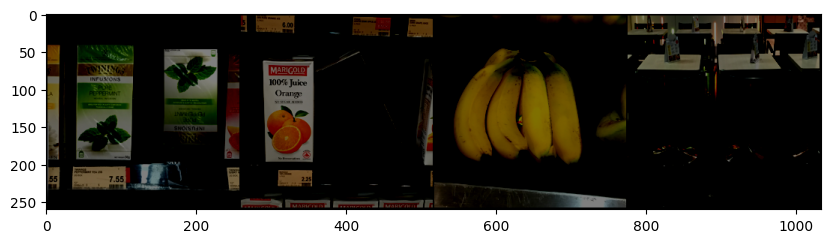

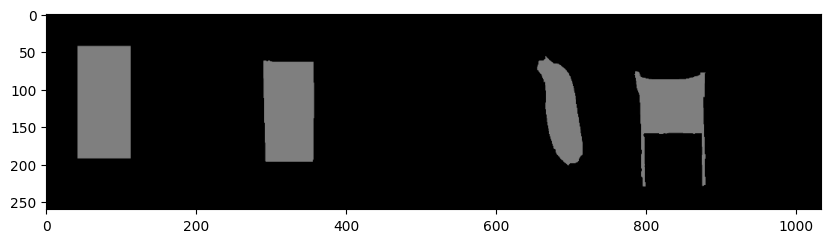

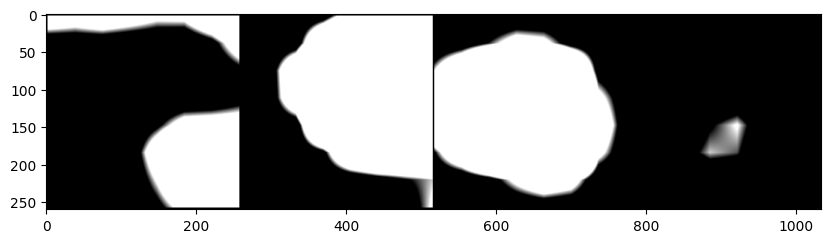

F1_score:  (0.22112441895897558, 0.12430572509718206, 0.999999999969312)
Image score:  (0.12430572509718206, 0.999999999969312, 0.0, 0.0, 32586.0, 0.0, 229558, 0)
Auc : 0.5162410115669829


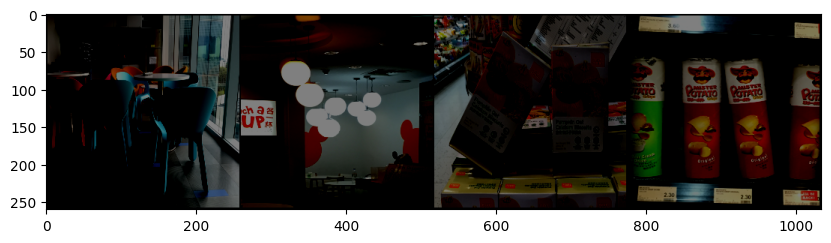

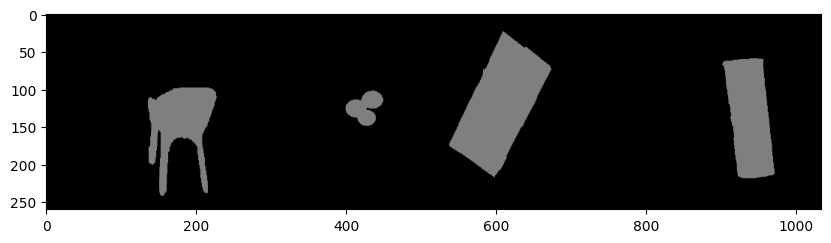

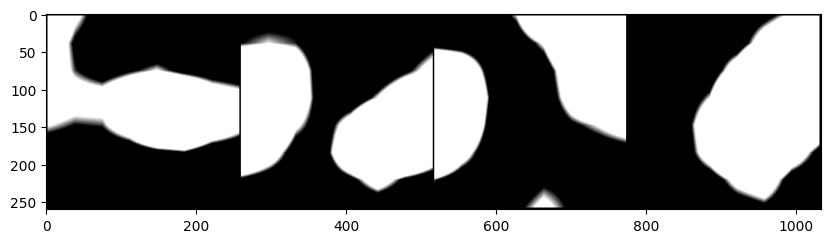

F1_score:  (0.2069248553324706, 0.11540222167924727, 0.9999999999669443)
Image score:  (0.11540222167924727, 0.9999999999669443, 0.0, 0.0, 30252.0, 0.0, 231892, 0)
Auc : 0.6677885541661179


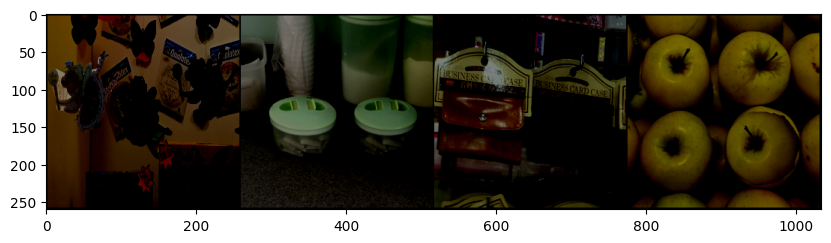

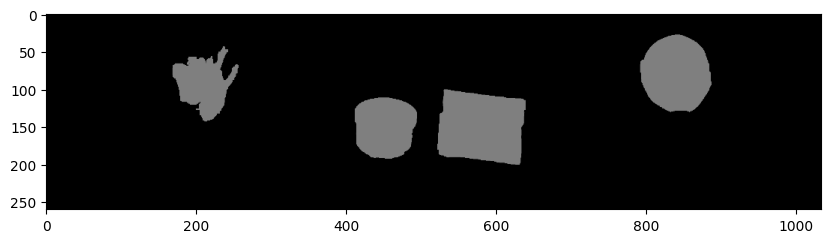

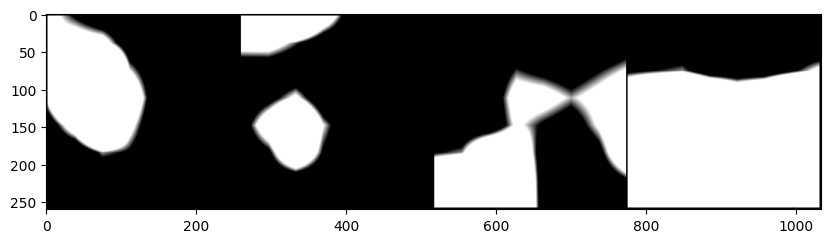

F1_score:  (0.19452594459759176, 0.1077423095699015, 0.9999999999645942)
Image score:  (0.1077423095699015, 0.9999999999645942, 0.0, 0.0, 28244.0, 0.0, 233900, 0)
Auc : 0.3098967194369464


In [ ]:
lst109 = range(len(main_loss_18_s))
lst209 = []
for i in range(len(main_loss_18_s)):
    # print(i,sum(main_loss1[i]))
    lst209.append(sum(main_loss_18_s[i]))
plt.plot(lst109, lst209)



countttt=0
for batch_idx, (images, labels, mask) in enumerate(dataloader_tampered):
    if countttt == 3:
      break
    countttt+=1
    with torch.no_grad():
            edge, outputs = model_18_seg(images.to(device))
            imshow(torchvision.utils.make_grid(mask))
            imshow(torchvision.utils.make_grid(images))
            imshow(torchvision.utils.make_grid(outputs.cpu().detach()))


img_score_train_18_s=[]
f1_score_train_18_s=[]
auc_score_train_18_s=[]
countt=0
for batch_idx, (images, labels, mask) in enumerate(dataloader_tampered):
    
    with torch.no_grad():
        edge, outputs = model_18_seg(images.to(device))
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
      
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)
        val = calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy())
        img_score_train_18_s.append(val)
      
        val = calculate_pixel_f1(outputs.cpu().detach().numpy(),mask.numpy())
        f1_score_train_18_s.append(val)

        auc_score_train_18_s.append(cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
        if countt < 2:
      
          countt+=1
          print("F1_score: ",calculate_pixel_f1(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Image score: ",calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Auc :",cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
          print("="*60)


img_score_testing_18_s = []
f1_score_testing_18_s = []
auc_score_testing_18_s=[]
counttting=0
for batch_idx, (images, mask, labels) in enumerate(authenticated_data):
    if counttting == 4:
      break
    counttting+=1
    with torch.no_grad():
        # print(labels)
        # print(mask.shape)
        # print(images)
        edge, outputs = model_18_seg(images.to(device))
        imshow(torchvision.utils.make_grid(images))
        imshow(torchvision.utils.make_grid(mask))
        imshow(torchvision.utils.make_grid(outputs.cpu().detach()))
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
      
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        # outputs = (outputs - min_val) / (max_val - min_val)
        val = calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy())
        img_score_testing_18_s.append(val)
      
        val = calculate_pixel_f1(outputs.cpu().detach().numpy(),mask.numpy())
        f1_score_testing_18_s.append(val)

        auc_score_testing_18_s.append(cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))

        # imshow(torchvision.utils.make_grid(images))
        # imshow(torchvision.utils.make_grid(mask))
        # imshow(torchvision.utils.make_grid(outputs.cpu().detach()))
        print("F1_score: ",calculate_pixel_f1(outputs.cpu().detach().numpy(), mask.numpy()))
        print("Image score: ",calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy()))
        print("Auc :",cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
        print("="*60)




Seg

In [ ]:
model_18_one = get_mvss_18().to(device)

optimizer = optim.Adam(model_18_one.parameters(), lr=1e-4, betas=(0.9, 0.999), eps=1e-8,weight_decay=1e-7)

scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.1)

In [ ]:
main_loss_18_one = []

epoch = 5
for i in range(epoch):
    loss_val_18_one = []

    model_18_one.train()
    for idx, (image, label, mask) in enumerate(dataloader_tampered):
        label = label.view(len(label), -1)
        optimizer.zero_grad()
        image, label, mask = image.to(device), label.to(device), mask.to(device)
        edge, outputs = model_18_one(image.to(device))
        # print(edge, outputs )
        edge, outputs = edge.to(device), outputs.to(device)
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
        # outputs = gray_transform(torch.mean(outputs, dim=1, keepdim=True))

        # Make a copy of mask and outputs before modifying them
        # mask_copy = mask.clone()
        # outputs_copy = outputs.clone()

        # Normalize mask_copy and outputs_copy using their minimum and maximum values
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)

        # Compute the segmentation loss and edge loss
        loss_seg = criterion_dice(outputs, mask)
        edge_mask=F.interpolate(gen_edge_mask(mask), scale_factor=0.25, mode='nearest').to(device)
        # print(edge.shape, edge_mask.shape)
        loss_edge = criterion_dice(edge, edge_mask)

        # # Compute the classification loss (assuming criterion is defined)
        # Gx = []
        # for out in outputs:
        #     Gx.append(torch.max(out).to(torch.float64))
        # Gx = torch.tensor(Gx).view(outputs.size(0), -1).to(device)
        # loss_clf = criterion(Gx.float(), label.float())

        # Compute the total loss as a weighted sum of the individual losses
        loss = loss_seg
        # loss = loss_seg
        loss.backward()
        optimizer.step()
        val = loss.detach().cpu().numpy()
        loss_val_18_one.append(val.item())
        # losses.update(loss.detach().cpu().numpy())
        scheduler.step(val.item())
    main_loss_18_one.append(loss_val_18_one)
    print("LOSS : ", sum(loss_val_18_one))
    print(i)
    torch.save({
    'epoch': epoch,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'loss': [loss_dice,loss_bce],
    }, '/content/drive/My Drive/checkpoint_resnet18_seg_loss.pt')


LOSS :  85.2831404209137
0
LOSS :  77.0016148686409
1
LOSS :  70.48909056186676
2
LOSS :  66.05062192678452
3
LOSS :  60.933467507362366
4


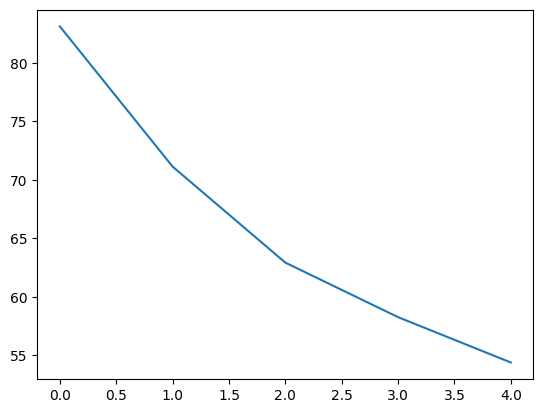

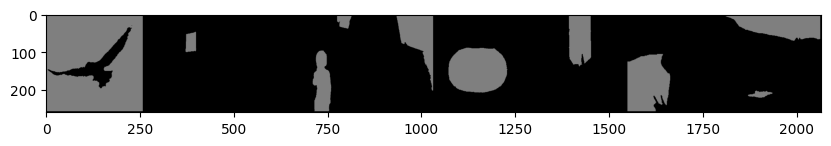

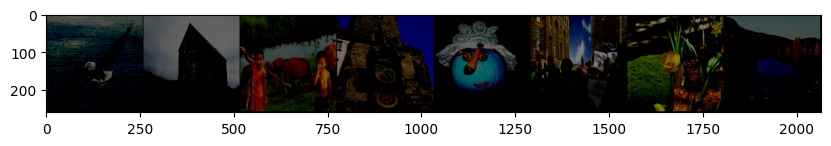

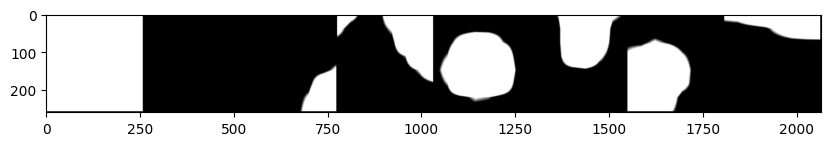

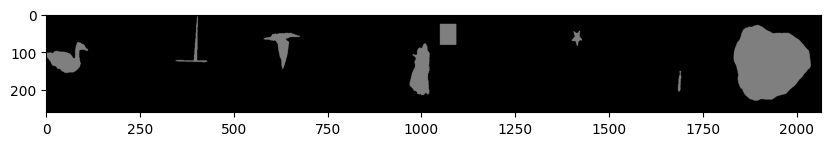

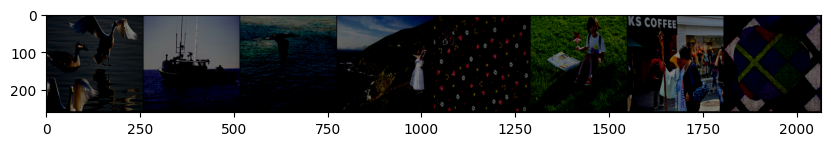

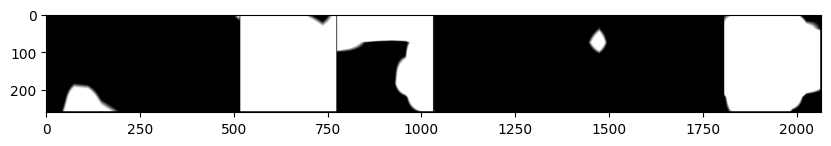

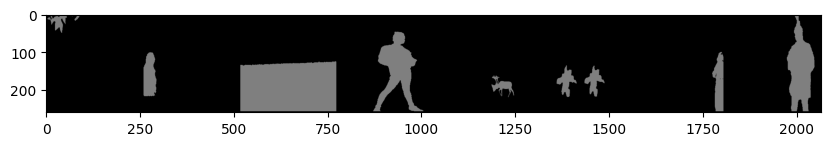

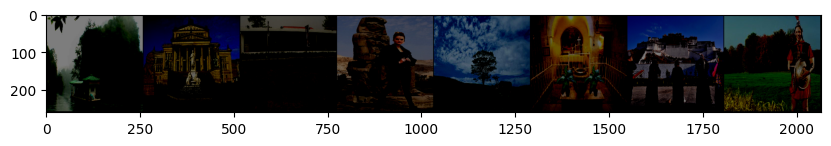

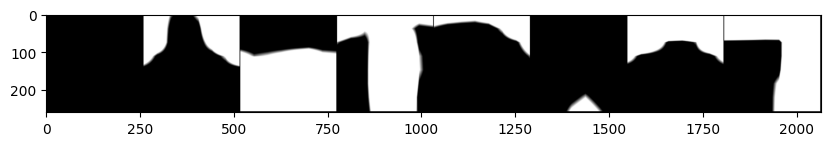

F1_score:  (0.23075651123355612, 0.13042665562920608, 0.9999999999853761)
Image score:  (0.1304283142087356, 0.9999999999853761, 2.193429800371143e-06, 4.386849978494813e-06, 68381.0, 1.0, 455906, 0)
Auc : 0.8844293217390848
F1_score:  (0.15606486113843562, 0.08463684966423994, 0.9999999999774642)
Image score:  (0.08463859558089325, 0.9999999999774642, 2.083706664106311e-06, 4.167404644563792e-06, 44374.0, 1.0, 479913, 0)
Auc : 0.7685348910982


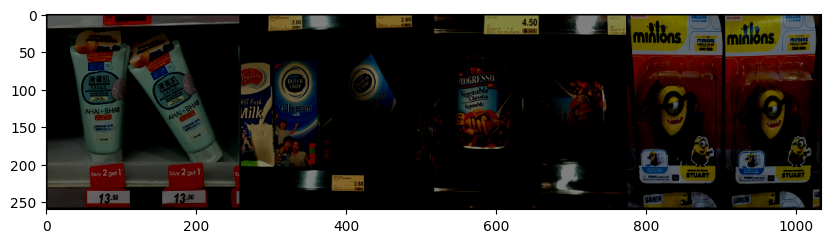

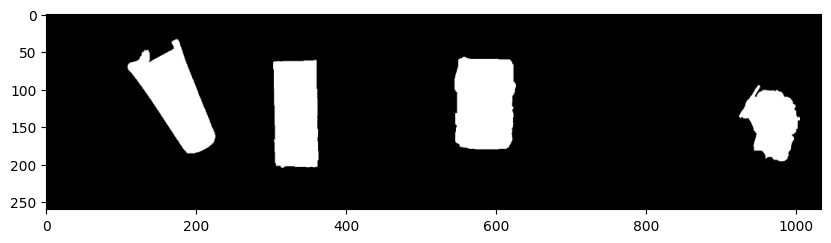

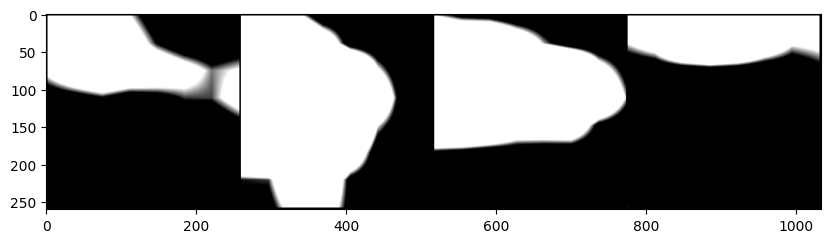

F1_score:  (0.21258548625669882, 0.11893463134720254, 0.9999999999679261)
Image score:  (0.11893463134720254, 0.9999999999679261, 0.0, 0.0, 31178.0, 0.0, 230966, 0)
Auc : 0.6697936038279939


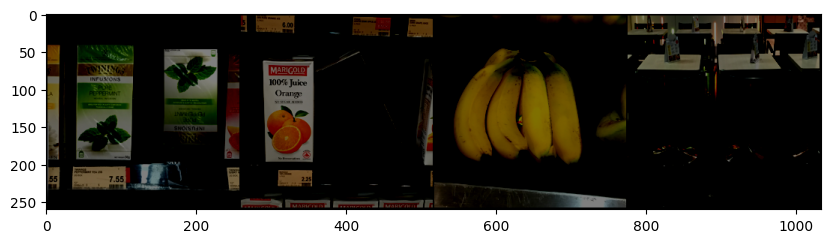

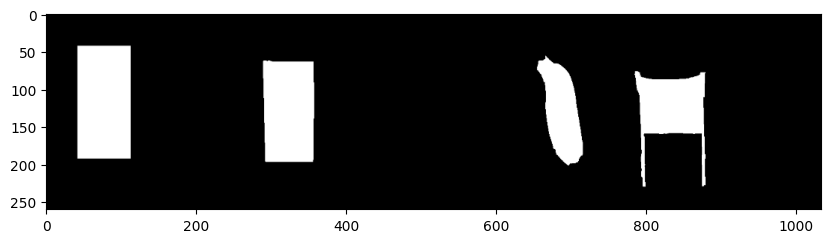

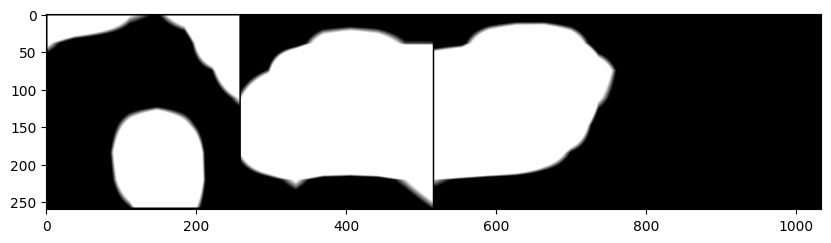

F1_score:  (0.22112441895897558, 0.12430572509718206, 0.999999999969312)
Image score:  (0.12430572509718206, 0.999999999969312, 0.0, 0.0, 32586.0, 0.0, 229558, 0)
Auc : 0.5957663357082414


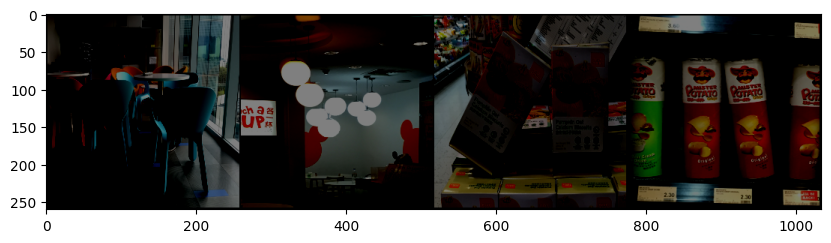

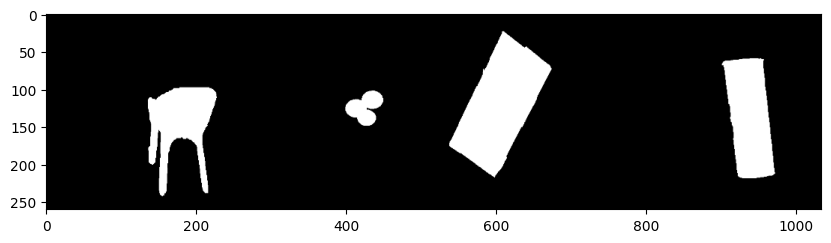

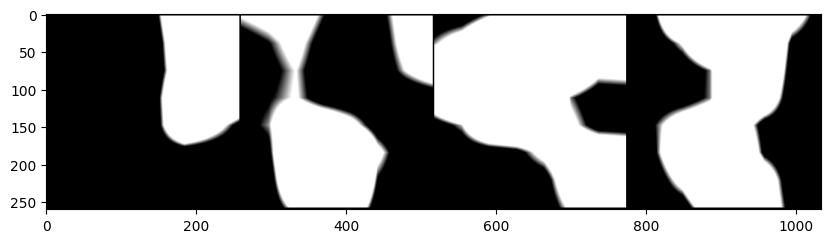

F1_score:  (0.2069248553324706, 0.11540222167924727, 0.9999999999669443)
Image score:  (0.11540222167924727, 0.9999999999669443, 0.0, 0.0, 30252.0, 0.0, 231892, 0)
Auc : 0.6181804573753951


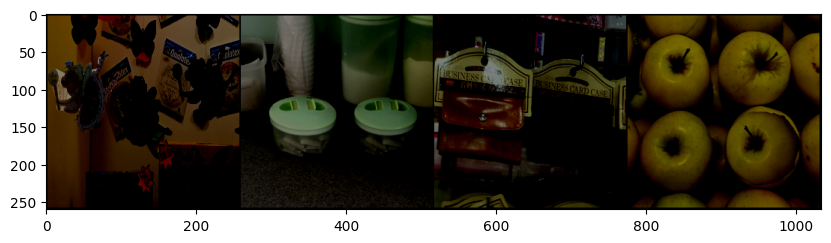

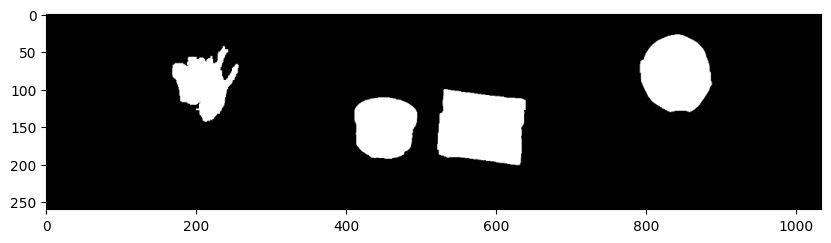

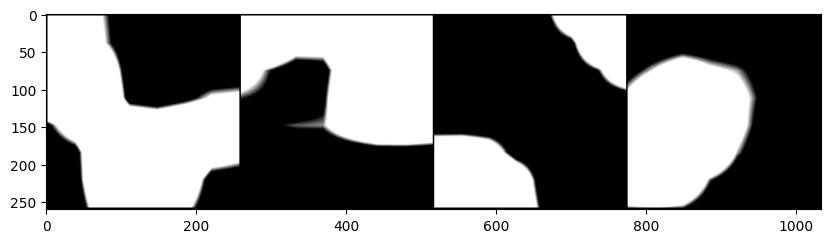

F1_score:  (0.19452594459759176, 0.1077423095699015, 0.9999999999645942)
Image score:  (0.1077423095699015, 0.9999999999645942, 0.0, 0.0, 28244.0, 0.0, 233900, 0)
Auc : 0.5380928776188193


In [ ]:
lst150 = range(len(main_loss_18_one))
lst250 = []
for i in range(len(main_loss_18_one)):
    # print(i,sum(main_loss1[i]))
    lst250.append(sum(main_loss_18_one[i]))
plt.plot(lst150, lst250)



countttt=0
for batch_idx, (images, labels, mask) in enumerate(dataloader_tampered):
    if countttt == 3:
      break
    countttt+=1
    with torch.no_grad():
            edge, outputs = model_18_one(images.to(device))
            imshow(torchvision.utils.make_grid(mask))
            imshow(torchvision.utils.make_grid(images))
            imshow(torchvision.utils.make_grid(outputs.cpu().detach()))


img_score_train_18_one=[]
f1_score_train_18_one=[]
auc_score_train_18_one=[]
countt=0
for batch_idx, (images, labels, mask) in enumerate(dataloader_tampered):
   
    with torch.no_grad():
        edge, outputs = model_18_one(images.to(device))
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
      
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)
        val = calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy())
        img_score_train_18_one.append(val)
      
        val = calculate_pixel_f1(outputs.cpu().detach().numpy(),mask.numpy())
        f1_score_train_18_one.append(val)

        auc_score_train_18_one.append(cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
        if countt < 2:
      
          countt+=1
          print("F1_score: ",calculate_pixel_f1(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Image score: ",calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Auc :",cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
          print("="*60)


img_score_testing_18_one = []
f1_score_testing_18_one = []
auc_score_testing_18_one=[]
counttting=0
for batch_idx, (images, mask, labels) in enumerate(authenticated_data):
   
    with torch.no_grad():
        # print(labels)
        # print(mask.shape)
        # print(images)
        edge, outputs = model_18_one(images.to(device))
        # imshow(torchvision.utils.make_grid(images))
        # imshow(torchvision.utils.make_grid(mask))
        # imshow(torchvision.utils.make_grid(outputs.cpu().detach()))
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
      
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        # outputs = (outputs - min_val) / (max_val - min_val)
        val = calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy())
        img_score_testing_18_one.append(val)
      
        val = calculate_pixel_f1(outputs.cpu().detach().numpy(),mask.numpy())
        f1_score_testing_18_one.append(val)

        auc_score_testing_18_one.append(cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
        if counttting < 4:
      
          counttting+=1
          imshow(torchvision.utils.make_grid(images))
          imshow(torchvision.utils.make_grid(mask))
          imshow(torchvision.utils.make_grid(outputs.cpu().detach()))
          print("F1_score: ",calculate_pixel_f1(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Image score: ",calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Auc :",cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
          print("="*60)




####`LOSS COMPARISON BETWEEN ORIGINAL RESNET_50,RESNET_18,LAYER_REMOVED RESNET_50`

#### WHEN ALL LOSSES ARE CONSIDERED

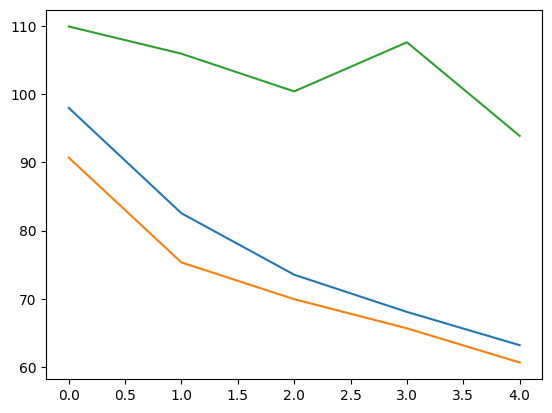

In [ ]:
plt.plot(lst1, lst2)
plt.plot(lst19, lst29) 

plt.plot(lst1456, lst2456)


Seg+edge loss

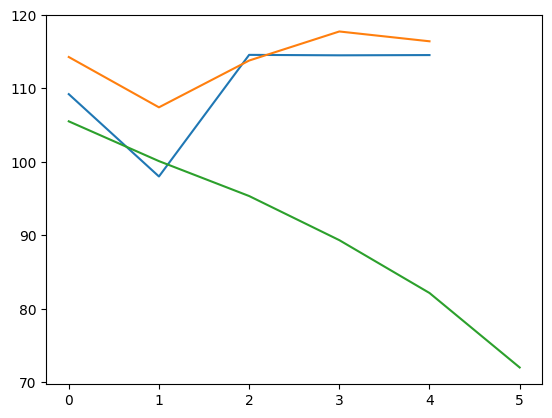

In [ ]:
plt.plot(lst11, lst22)   
plt.plot(lst167, lst267)
plt.plot(lst109, lst209)  


Seg

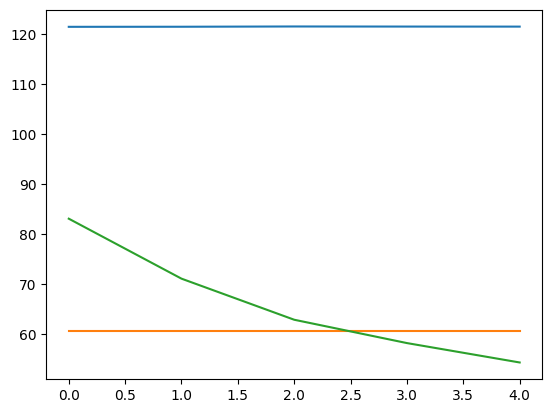

In [ ]:
plt.plot(lst123, lst222)  
plt.plot(lst156, lst256)  
plt.plot(lst150, lst250)  


In [ ]:
lst_resnet_18_lst = []
lst_resnet_50_rem_lst = []
lst_resnet_50_lst = []

for i in range((25)):

    lst_resnet_18_lst.append([img_score_testing_18[i][0], f1_score_testing_18[i][0], auc_score_testing_18[i]])
    lst_resnet_50_rem_lst.append([img_score_testing_1t[i][0], f1_score_testing_1t[i][0], auc_score_testing_1t[i]])
    lst_resnet_50_lst.append([img_score_test[i][0], f1_score_test[i][0], auc_score_test[i]])

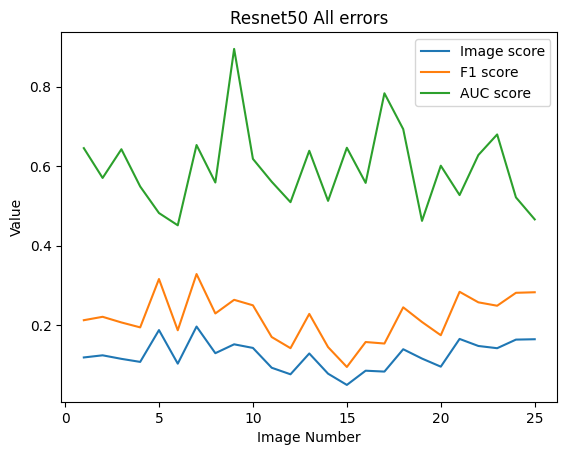

In [ ]:
temp_lst1 = range(1, 26)
temp_lst2 = range(1, 26)
temp_lst3 = range(1, 26)
# l1 = [row[1] for row in lst_resnet_18_lst]
# l2 = [row[1] for row in lst_resnet_50_rem_lst]
# l3 = [row[1] for row in lst_resnet_50_lst]
l1=[row[0] for row in img_score_test]
l2=[row[0] for row in f1_score_test]
l3=auc_score_test

plt.plot(temp_lst1, l1, label='Image score')
plt.plot(temp_lst1, l2, label='F1 score')
plt.plot(temp_lst1, l3, label='AUC score')

# Adding labels and title
plt.xlabel('Image Number')
plt.ylabel('Value')
plt.title('Resnet50 All errors')
plt.legend()
plt.show()

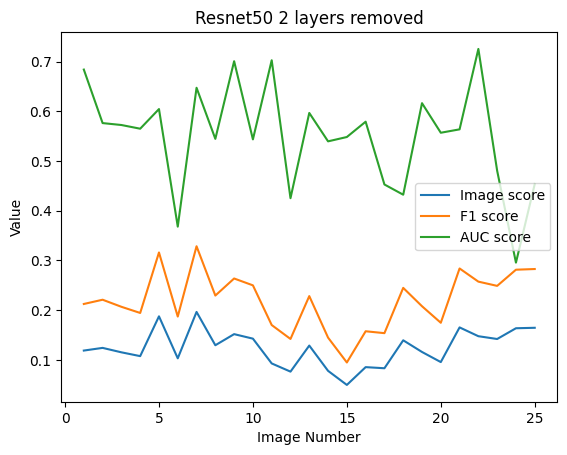

In [ ]:
temp_lst1 = range(1, 26)
l1=[row[0] for row in img_score_testing]
l2=[row[0] for row in f1_score_testing]
l3=auc_score_testing

plt.plot(temp_lst1, l1, label='Image score')
plt.plot(temp_lst1, l2, label='F1 score')
plt.plot(temp_lst1, l3, label='AUC score')

# Adding labels and title
plt.xlabel('Image Number')
plt.ylabel('Value')
plt.title('Resnet50 2 layers removed')
plt.legend()
plt.show()

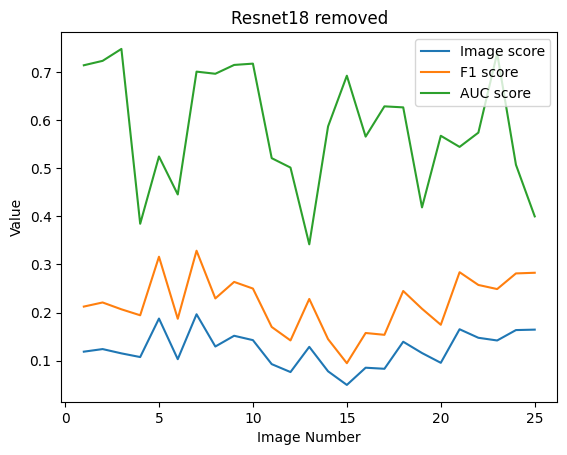

In [ ]:
temp_lst1 = range(1, 26)
l1=[row[0] for row in img_score_testing_18]
l2=[row[0] for row in f1_score_testing_18]
l3=auc_score_testing_18

plt.plot(temp_lst1, l1, label='Image score')
plt.plot(temp_lst1, l2, label='F1 score')
plt.plot(temp_lst1, l3, label='AUC score')

# Adding labels and title
plt.xlabel('Image Number')
plt.ylabel('Value')
plt.title('Resnet18 removed')
plt.legend()
plt.show()

In [ ]:
l1=[row[0] for row in img_score_test]
l2=[row[0] for row in f1_score_test]
l3=auc_score_test

print("Mean Image Score :", np.mean(l1))
print("Mean F1 Score :", np.mean(l2))
print("Mean AUC Score :", np.mean(l3))

Mean Image Score : 0.12438125610304114
Mean F1 Score : 0.21942536600804025
Mean AUC Score : 0.5940316780447897


In [ ]:
class ResNet50(nn.Module):
    def __init__(self, pretrained=True, n_input=3):
        super(ResNet50, self).__init__()
        self.model = models.resnet50(pretrained=pretrained)
        self.conv1 = nn.Conv2d(n_input, 64, kernel_size=7, stride=2, padding=3,bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.feature_maps = [self.model.layer1, self.model.layer2, self.model.layer3, self.model.layer4]
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
      

    def base_forward(self, x):
        feature_map = []
        
        out = x
        out = self.conv1(out)
        out = self.bn1(out)
        out= self.relu(out)
        out= self.maxpool(out)
        for layer in self.feature_maps:
            out = layer(out)
            feature_map.append(out)
        out = self.avgpool(out)
        out = out.view(out.size(0), -1)

        return feature_map, out




class ResFCN(ResNet50):
    def __init__(self, nclass=1, aux=False, n_input=3, **kwargs):
        super(ResFCN, self).__init__(pretrained=True, n_input=n_input)
        self.num_class = nclass
        self.aux = aux

        self.__setattr__('exclusive', ['head'])


        self.head = Dual_Attention_Head(2048, self.num_class, aux, **kwargs)

    def forward(self, x):
        size = x.size()[2:]
        input_ = x.clone()
        feature_map, _ = self.base_forward(input_)
        c1, c2, c3, c4 = feature_map

        outputs = []

        x = self.head(c4)
        x0 = F.interpolate(x[0], size, mode='bilinear', align_corners=True)
        outputs.append(x0)

        return x, x0

def get_fcn():
    model = ResFCN()
    return model

In [ ]:
class ResNet50(nn.Module):
    def __init__(self, pretrained=True, no_of_inputs=3):
        super(ResNet50, self).__init__()
        self.model = models.resnet50(pretrained=pretrained)
        self.conv1 = nn.Conv2d(no_of_inputs, 64, kernel_size=7, stride=2, padding=3,bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.feature_maps = [self.model.layer1, self.model.layer2, self.model.layer3, self.model.layer4]
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
      

    def base_forward(self, x):
        feature_map = []
        
        out = x
        out = self.conv1(out)
        out = self.bn1(out)
        out= self.relu(out)
        out= self.maxpool(out)
        for layer in self.feature_maps:
            out = layer(out)
            feature_map.append(out)
        out = self.avgpool(out)
        out = out.view(out.size(0), -1)

        return feature_map, out




class ResFCN(ResNet50):
    def __init__(self, no_of_classes=1, no_of_inputs=3):
        super(ResFCN, self).__init__(pretrained=True, no_of_inputs=no_of_inputs)
        self.num_class = no_of_classes
        self.__setattr__('exclusive', ['head'])
        self.head = Dual_Attention_Head(2048, self.num_class)

    def forward(self, x):
        size = x.size()[2:]
        input_ = x.clone()
        feature_map, _ = self.base_forward(input_)
        c1, c2, c3, c4 = feature_map

        outputs = []

        x = self.head(c4)
        x0 = F.interpolate(x[0], size, mode='bilinear', align_corners=True)
        outputs.append(x0)

        return x0

def get_fcn():
    model = ResFCN()
    return model

In [ ]:
model_fcn = get_fcn().to(device)

optimizer = optim.Adam(model_18.parameters(), lr=1e-4, betas=(0.9, 0.999), eps=1e-8,weight_decay=1e-7)

scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.1)

model_fcn

ResFCN(
  (model): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0)

In [ ]:
main_loss_fcn = []

epoch = 10
for i in range(epoch):
    loss_val_fcn = []

    model_fcn.train()
    for idx, (image, label, mask) in enumerate(dataloader_tampered):
        label = label.view(len(label), -1)
        optimizer.zero_grad()
        image, label, mask = image.to(device), label.to(device), mask.to(device)
        outputs = model_fcn(image.to(device))
        outputs = outputs.to(device)
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)

        loss_seg = criterion_dice(outputs, mask)
        loss = loss_seg
        loss.backward()
        optimizer.step()
        val = loss.detach().cpu().numpy()
        loss_val_fcn.append(val.item())
        scheduler.step(val.item())
    main_loss_fcn.append(loss_val_fcn)
    print("LOSS : ", sum(loss_val_fcn))
    print(i)
    torch.save({
    'epoch': epoch,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'loss': [loss_dice,loss_bce],
    }, '/content/drive/My Drive/smai/checkpoint_fcn.pt')


LOSS :  94.37482535839081
0
LOSS :  94.16002660989761
1
LOSS :  94.32577586174011
2
LOSS :  94.55973362922668
3
LOSS :  94.38553428649902
4
LOSS :  94.3015433549881
5
LOSS :  94.28605276346207
6
LOSS :  94.44929230213165
7
LOSS :  94.37641108036041
8
LOSS :  94.14192712306976
9


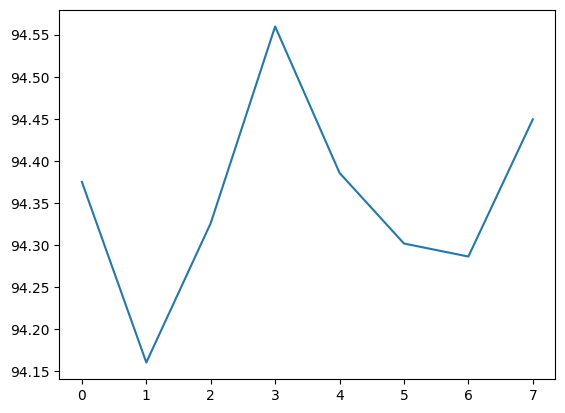

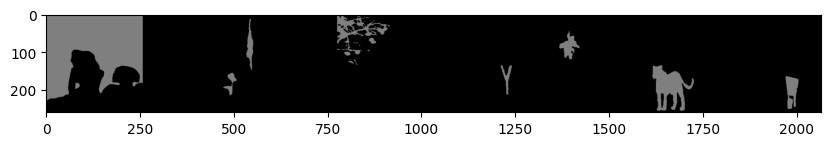

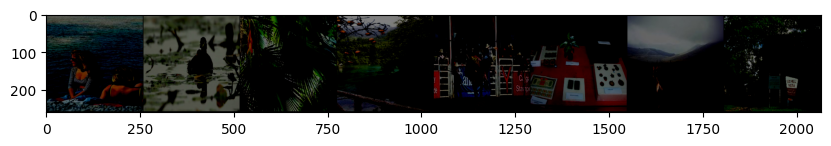

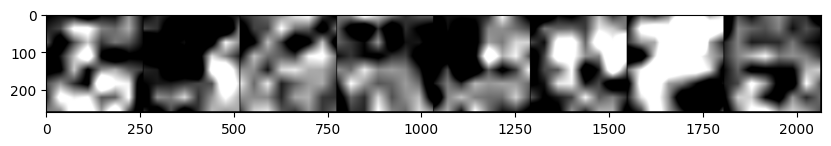

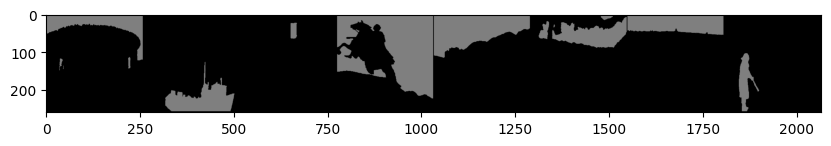

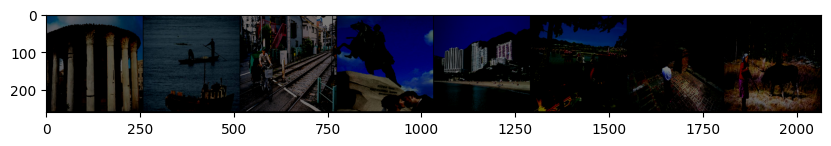

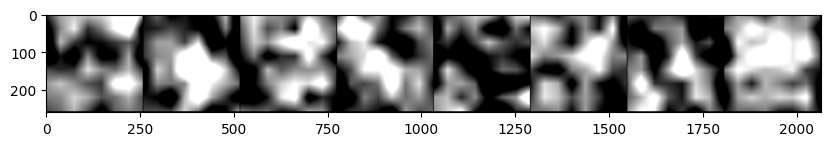

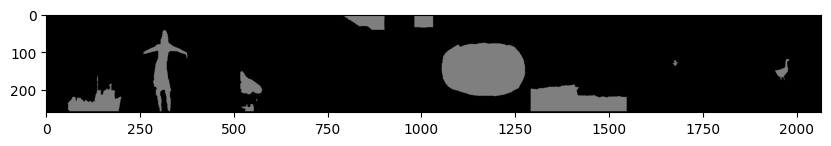

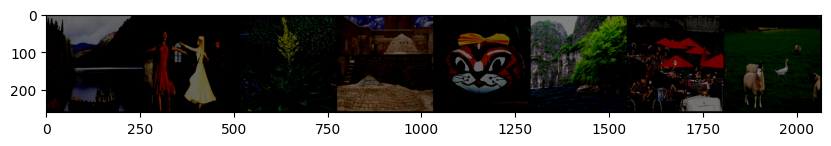

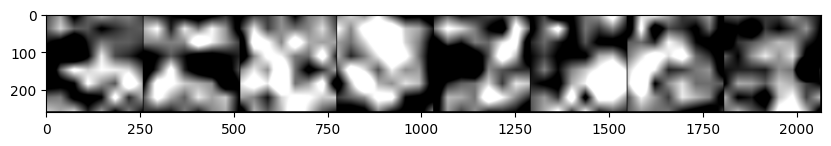

F1_score:  (0.4010058389279169, 0.2507863059731582, 0.9999999999923944)
Image score:  (0.2507877349848732, 0.9999999999923944, 2.545798922611415e-06, 5.09158488307152e-06, 131484.0, 1.0, 392803, 0)
Auc : 0.49202668861785487
F1_score:  (0.2175384557846144, 0.12204384239906378, 0.9999999999843716)
Image score:  (0.12204551696754065, 0.9999999999843716, 2.172486758688486e-06, 4.344964078000046e-06, 63986.0, 1.0, 460301, 0)
Auc : 0.48874792005746126


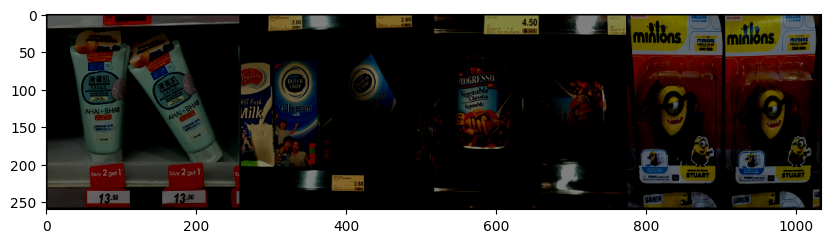

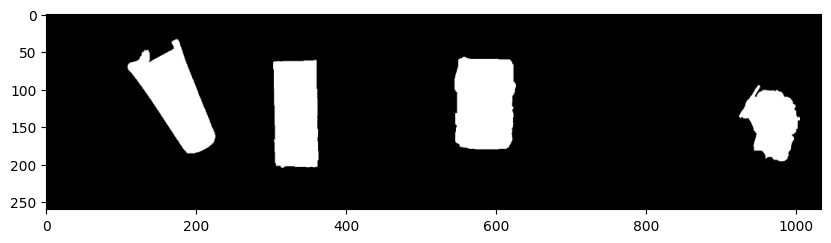

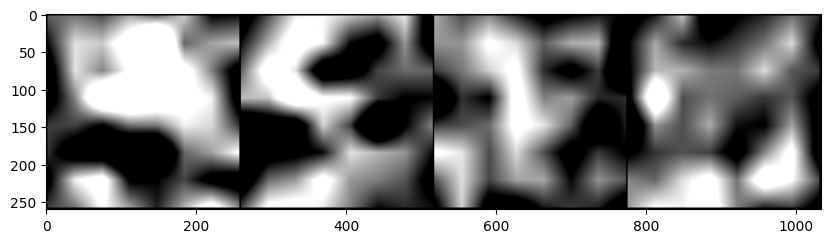

F1_score:  (0.21258548625669882, 0.11893463134720254, 0.9999999999679261)
Image score:  (0.11893463134720254, 0.9999999999679261, 0.0, 0.0, 31178.0, 0.0, 230966, 0)
Auc : 0.6097026041927147


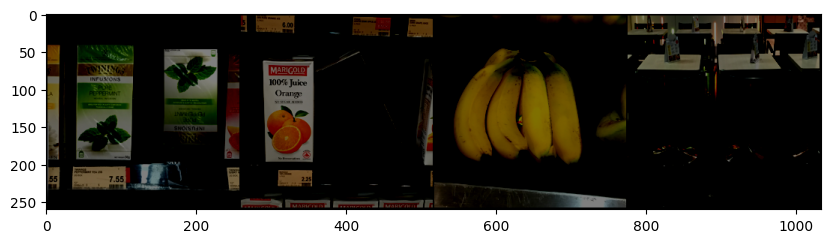

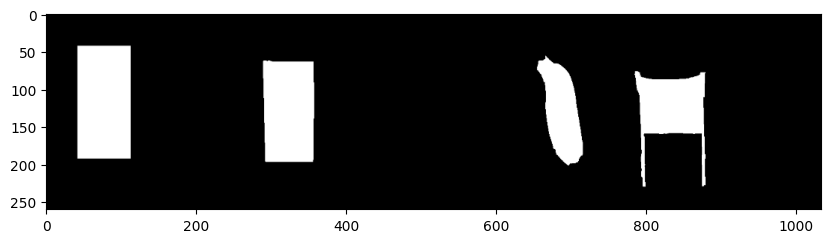

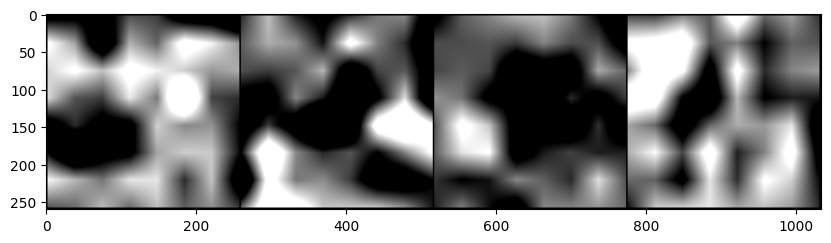

F1_score:  (0.22112441895897558, 0.12430572509718206, 0.999999999969312)
Image score:  (0.12430572509718206, 0.999999999969312, 0.0, 0.0, 32586.0, 0.0, 229558, 0)
Auc : 0.3402342871317762


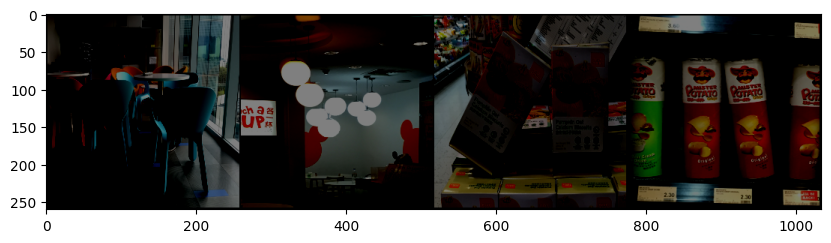

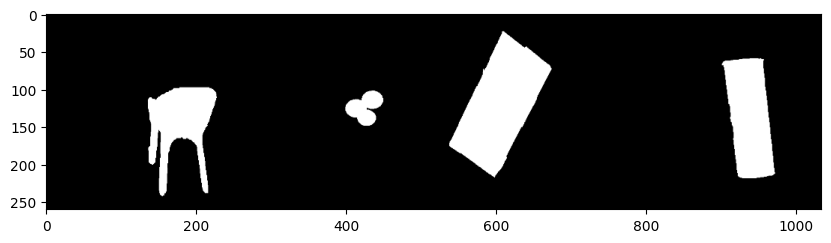

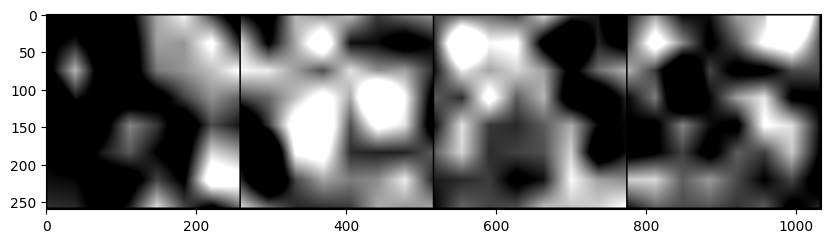

F1_score:  (0.2069248553324706, 0.11540222167924727, 0.9999999999669443)
Image score:  (0.11540222167924727, 0.9999999999669443, 0.0, 0.0, 30252.0, 0.0, 231892, 0)
Auc : 0.6540595170714023


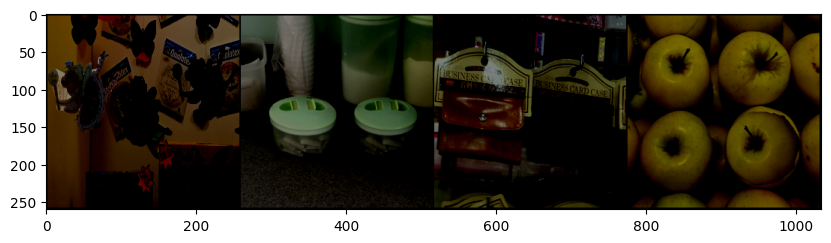

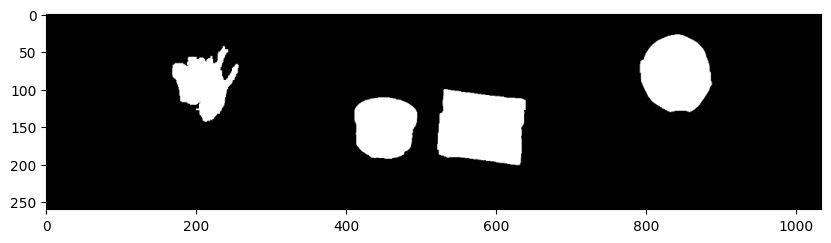

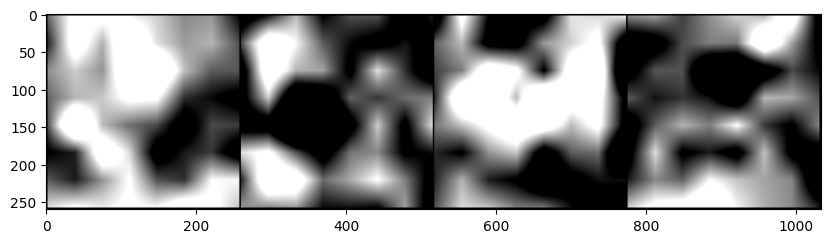

F1_score:  (0.19452594459759176, 0.1077423095699015, 0.9999999999645942)
Image score:  (0.1077423095699015, 0.9999999999645942, 0.0, 0.0, 28244.0, 0.0, 233900, 0)
Auc : 0.4370183248093996


In [ ]:
lst150 = range(len(main_loss_fcn[2:]))
lst250 = []
for i in range(len(main_loss_fcn[2:])):
    # print(i,sum(main_loss1[i]))
    lst250.append(sum(main_loss_fcn[i]))
plt.plot(lst150, lst250)



countttt=0
for batch_idx, (images, labels, mask) in enumerate(dataloader_tampered):
    if countttt == 3:
      break
    countttt+=1
    with torch.no_grad():
            edge, outputs = model_fcn(images.to(device))
            imshow(torchvision.utils.make_grid(mask))
            imshow(torchvision.utils.make_grid(images))
            imshow(torchvision.utils.make_grid(outputs.cpu().detach()))


img_score_train_fcn=[]
f1_score_train_fcn=[]
auc_score_train_fcn=[]
countt=0
for batch_idx, (images, labels, mask) in enumerate(dataloader_tampered):
   
    with torch.no_grad():
        edge, outputs = model_fcn(images.to(device))
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
      
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)
        val = calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy())
        img_score_train_fcn.append(val)
      
        val = calculate_pixel_f1(outputs.cpu().detach().numpy(),mask.numpy())
        f1_score_train_fcn.append(val)

        auc_score_train_fcn.append(cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
        if countt < 2:
      
          countt+=1
          print("F1_score: ",calculate_pixel_f1(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Image score: ",calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Auc :",cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
          print("="*60)


img_score_testing_fcn = []
f1_score_testing_fcn = []
auc_score_testing_fcn=[]
counttting=0
for batch_idx, (images, mask, labels) in enumerate(authenticated_data):
   
    with torch.no_grad():
        # print(labels)
        # print(mask.shape)
        # print(images)
        edge, outputs = model_fcn(images.to(device))
        # imshow(torchvision.utils.make_grid(images))
        # imshow(torchvision.utils.make_grid(mask))
        # imshow(torchvision.utils.make_grid(outputs.cpu().detach()))
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))
      
        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        # outputs = (outputs - min_val) / (max_val - min_val)
        val = calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy())
        img_score_testing_fcn.append(val)
      
        val = calculate_pixel_f1(outputs.cpu().detach().numpy(),mask.numpy())
        f1_score_testing_fcn.append(val)

        auc_score_testing_fcn.append(cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
        if counttting < 4:
      
          counttting+=1
          imshow(torchvision.utils.make_grid(images))
          imshow(torchvision.utils.make_grid(mask))
          imshow(torchvision.utils.make_grid(outputs.cpu().detach()))
          print("F1_score: ",calculate_pixel_f1(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Image score: ",calculate_img_score(outputs.cpu().detach().numpy(), mask.numpy()))
          print("Auc :",cal_auc(outputs.cpu().detach().numpy(), mask.numpy()))
          print("="*60)




### MVSS++

In [ ]:
class ResNet50(nn.Module):
    def __init__(self, pretrained=True, n_input=3):
        super(ResNet50, self).__init__()
        self.model = models.resnet50(pretrained=pretrained)
        self.conv1 = nn.Conv2d(n_input, 64, kernel_size=7, stride=2, padding=3,bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.feature_maps = [self.model.layer1, self.model.layer2, self.model.layer3, self.model.layer4]
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
      

    def base_forward(self, x):
        feature_map = []
        
        out = x
        out = self.conv1(out)
        out = self.bn1(out)
        out= self.relu(out)
        out= self.maxpool(out)
        for layer in self.feature_maps:
            out = layer(out)
            feature_map.append(out)
        out = self.avgpool(out)
        out = out.view(out.size(0), -1)

        return feature_map, out

class MVSSNetPlus(ResNet50):
    def __init__(self,  n_input=3):
        super(MVSSNetPlus, self).__init__(pretrained=True, n_input=n_input)
        # self.aux = aux
        self.__setattr__('exclusive', ['head'])

        self.upsample_1 = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
        self.upsample_2 = nn.Upsample(scale_factor=4, mode="bilinear", align_corners=True)
       

        self.erb1 = ERB(256, 1)
        self.erb2 = ERB(512, 1)
        self.erb3 = ERB(1024, 1)
        self.erb4 = ERB(2048, 1)
        self.erb = ERB(1, 1)
        self.sobel_height_1, self.sobel_width_1 = sobel(256, 1)
        self.sobel_height_2, self.sobel_width_2 = sobel(512, 1)
        self.sobel_height_3, self.sobel_width_3 = sobel(1024, 1)
        self.sobel_height_4, self.sobel_width_4 = sobel(2048, 1)

        self.resnet = ResNet50(n_input=3, pretrained=True)
        self.constrain_conv = BayarConv2d(in_channels=1, out_channels=3, padding=2)
        self.dual = Dual_Attention_Head(4096, 1)
       

    def forward(self, x):
        size = x.size()[2:]
        input_ = x.clone()
        feature_map, _ = self.base_forward(input_)
        c1, c2, c3, c4 = feature_map

        
        res1 = sobel_layer(self.sobel_height_1, self.sobel_width_1, c1)
        res1=self.erb1(res1)
        temp_1=sobel_layer(self.sobel_height_2, self.sobel_width_2, c2)
        temp_2=self.upsample_1(self.erb2(temp_1))
        res1=self.erb(res1+temp_2)
        temp_3=self.upsample_2(self.erb3(sobel_layer(self.sobel_height_3, self.sobel_width_3, c3)))
        res1=self.erb(temp_3+res1)
        res1 = self.erb(res1 + self.upsample_2(self.erb4(sobel_layer(self.sobel_height_4, self.sobel_width_4, self.upsample_1(c4)))), relu=False)

        
        x = torch.unsqueeze(0.2989 * x[:, 0, :, :] + 0.5870 * x[:, 1, :, :] + 0.1140 * x[:, 2, :, :], 1)

        x = self.constrain_conv(x)
        constrain_features, _ = self.resnet.base_forward(x)
        constrain_feature = constrain_features[-1]
        c4 = torch.cat([c4, constrain_feature], dim=1)

        c4=self.upsample_1(c4)

        x = self.dual(c4)
        x0 = F.interpolate(x[0], size, mode='bilinear', align_corners=True)

        return res1, x0



def get_mvss_plus():
    model = MVSSNetPlus()
    return model

In [ ]:
mvs_plus_plus = get_mvss_plus().to(device)
optimizer = optim.Adam(mvs_plus_plus.parameters(), lr=1e-4, betas=(0.9, 0.999), eps=1e-8,weight_decay=1e-7)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.1)
mvs_plus_plus

MVSSNetPlus(
  (model): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
        

In [ ]:
class GeM(nn.Module):
    def __init__(self, p=3, eps=1e-6):
        super(GeM,self).__init__()
        self.p = nn.Parameter(torch.ones(1)*p)
        self.eps = eps
        
    def forward(self, x):
        return F.avg_pool2d(x.clamp(min=self.eps).pow(self.p), (x.size(-2), x.size(-1))).pow(1./self.p)


class GEM(nn.Module):
    def __init__(self, alpha, pretrained=True, no_of_inputs=1):
        super(GEM, self).__init__()
        self.conv1 = nn.Conv2d(no_of_inputs, 32, kernel_size=3, stride=1)
        self.conv2 = nn.Conv2d(32, 1, kernel_size=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.relu = nn.ReLU(inplace=True)
        self.gem = GeM()
        self.sigmoid = nn.Sigmoid()
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.alpha = alpha

      

    def forward(self, x):
        out = self.conv1(x)
        out= self.relu(out)
        out = self.bn1(out)
        out = self.conv2(out)
        out = self.sigmoid(out)
        out= self.maxpool(out)
        out = self.gem(out)
        out1 = self.gem(x)
        out = out*(1-self.alpha) + out1*(self.alpha)
        out = out.view(out.size(0), -1)
        return out

In [ ]:
import gc
gc.collect()
torch.cuda.empty_cache()

In [ ]:
main_loss_fcn = []
gem = GEM(alpha=0.7).to(device)

epoch = 5
for i in range(epoch):
    loss_val_fcn = []
    gc.collect()
    torch.cuda.empty_cache()
    mvs_plus_plus.train()
    for idx, (image, label, mask) in enumerate(dataloader_tampered):
        label = label.view(len(label), -1)
        optimizer.zero_grad()
        image, label, mask = image.to(device), label.to(device), mask.to(device)
        edge,outputs = mvs_plus_plus(image.to(device))
        outputs = outputs.to(device)
        edge=edge.to(device)
        gray_transform = transforms.Grayscale()
        mask = gray_transform(torch.mean(mask, dim=1, keepdim=True))

        min_val, max_val = torch.min(mask), torch.max(mask)
        mask = (mask - min_val) / (max_val - min_val)

        min_val, max_val = torch.min(outputs), torch.max(outputs)
        outputs = (outputs - min_val) / (max_val - min_val)
        loss_seg = criterion_dice(outputs, mask)
        rescaled_edge_mask = gen_edge_mask(mask).to(device)
        edge_mask = F.interpolate(rescaled_edge_mask, scale_factor=0.25, mode='nearest')
        loss_edge = criterion_dice(edge, edge_mask)

        # Gx = gem(outputs)
        # loss_clf = criterion(Gx.float(), label.float())
        loss = 0.2 * loss_seg + 0.8 * loss_edge
        # loss = 0.14 * loss_seg + 0.06 * loss_clf + 0.8 * loss_edge
        loss.backward()
        optimizer.step()
        val = loss.detach().cpu().numpy()
        loss_val.append(val.item())
        scheduler.step(val.item())
    main_loss.append(loss_val)
    print("LOSS : ", sum(loss_val))
    print(i)

    torch.save({
    'epoch': epoch,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'loss': [loss_dice,loss_bce],
    }, '/content/drive/My Drive/smai/checkpoint_mvs_plus.pt')


LOSS :  87.53435450792313
0
LOSS :  68.2547435760498
1
LOSS :  59.652978241443634
2
LOSS :  53.551200687885284
3
LOSS :  27.782336838543415
4


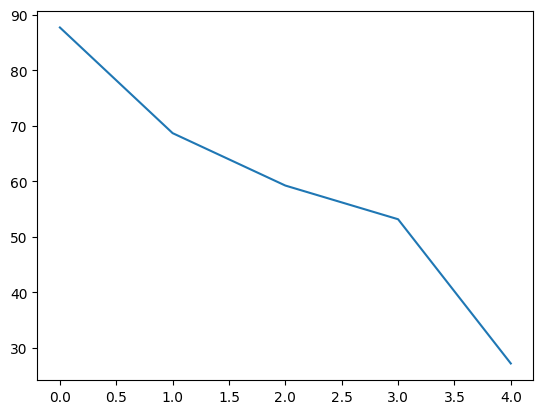

In [ ]:
lst1 = range(len(main_loss))
lst2 = []
for i in range(len(main_loss)):
    # print(i,sum(main_loss[i]))
    lst2.append(sum(main_loss[i]))

plt.plot(lst1, lst2)


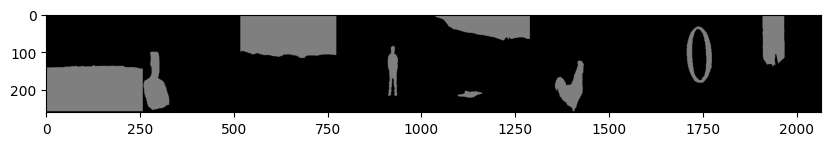

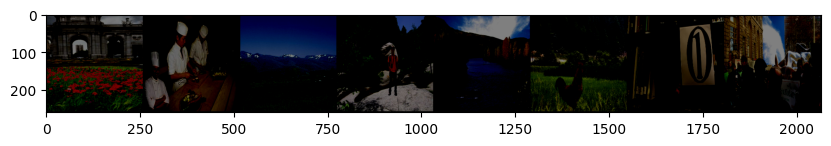

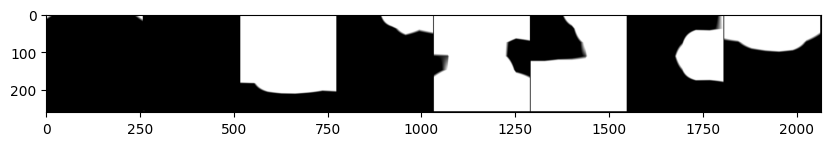

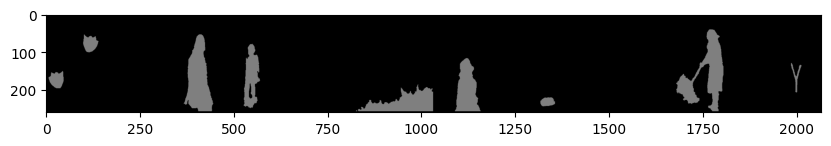

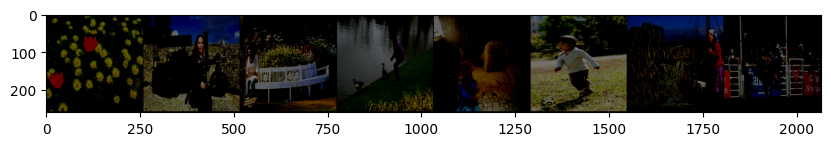

...

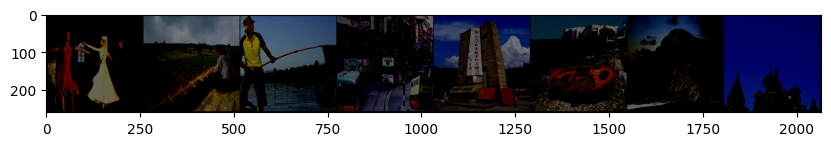

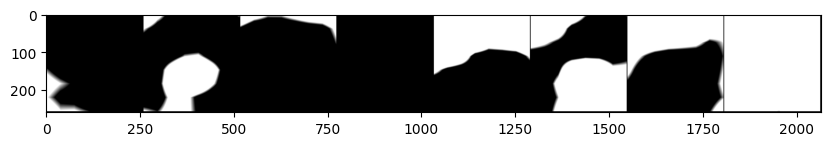

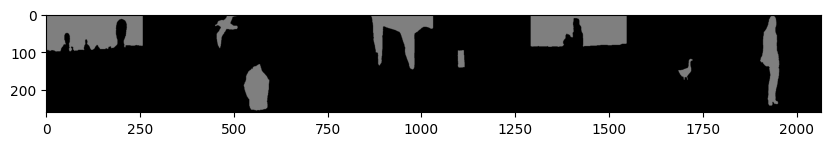

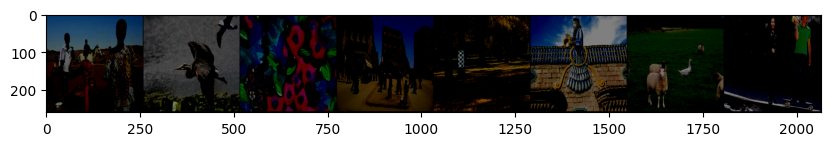

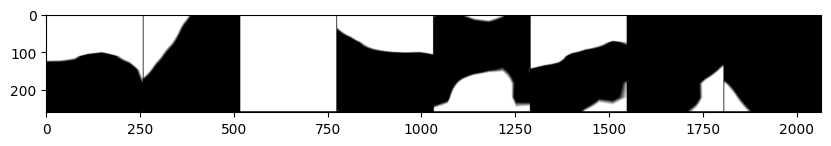

KeyboardInterrupt: ignored

In [ ]:
for batch_idx, (images, labels, mask) in enumerate(dataloader_tampered):
    with torch.no_grad():
            edge, outputs = mvs_plus_plus(images.to(device))
            imshow(torchvision.utils.make_grid(mask))
            imshow(torchvision.utils.make_grid(images))
            imshow(torchvision.utils.make_grid(outputs.cpu().detach()))

INTUTIONS

In [ ]:
sobel_layer=sobel(3,3)
erb=ERB(3,1)
bcd=BayarConv2d(3,3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


original:


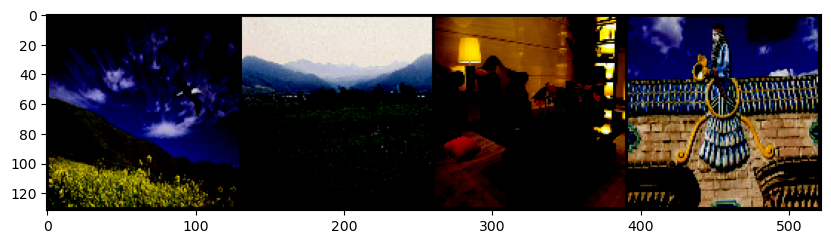

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


BayarConv2d


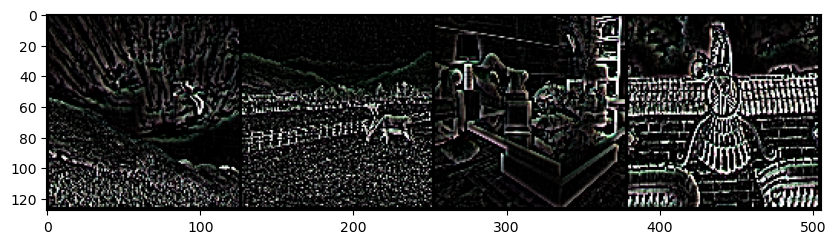

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sobel_layer


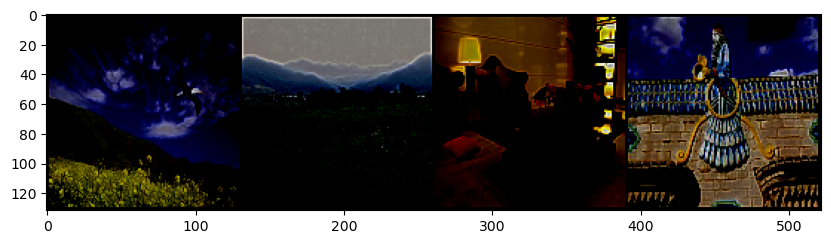

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


ERB


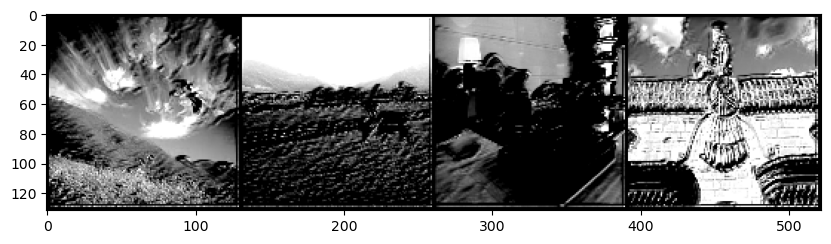

original:


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


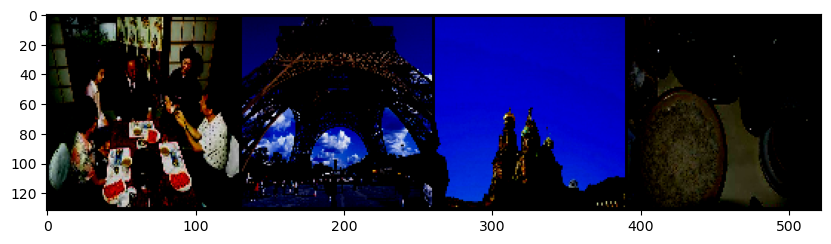

BayarConv2d


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


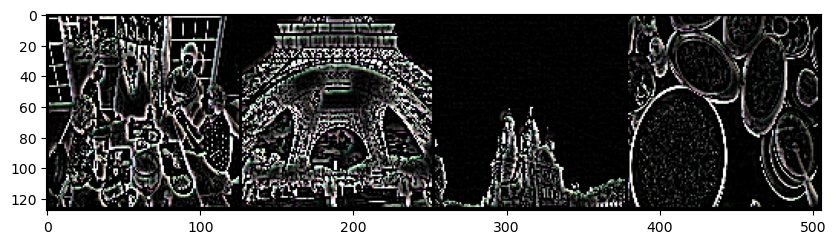

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sobel_layer


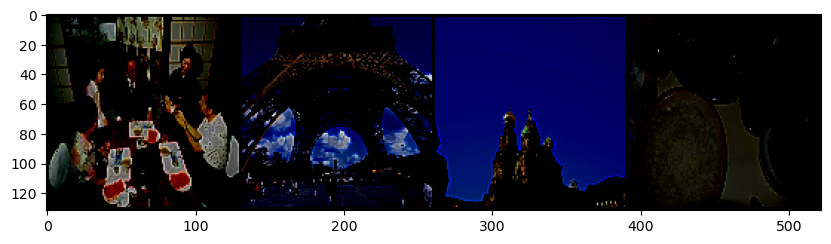

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


ERB


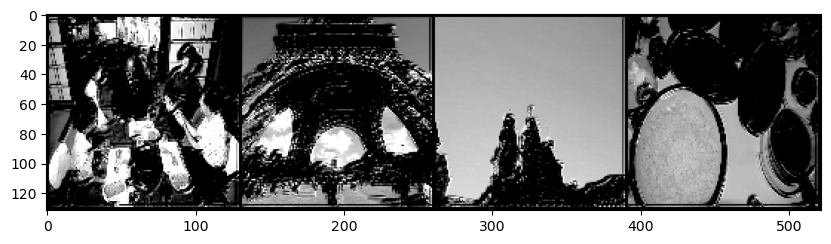

In [ ]:
count=0
for batch_idx, (images, labels, mask) in enumerate(dataloader_tampered):
    if count <2:
        count+=1
        print("original:")
        imshow(torchvision.utils.make_grid(images))        

        print("BayarConv2d")
        imshow(torchvision.utils.make_grid(bcd(images)))        
        print("Sobel_layer")
        a=sobel_layer(images)
        imshow(torchvision.utils.make_grid(a))
        
        print("ERB")
        imshow(torchvision.utils.make_grid(erb(a)))
